In [1]:
# Import some common packages
%reset -f
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import os
import shutil
import ipywidgets as iw

#import useful visualization functions
import FluvialVis as fv

#remove warnings
import warnings
warnings.filterwarnings('ignore')

# **Coupling grids with different geometries and scales: an example from fluvial geomorphology**
```
NetworkSedimentTransporter | OverlandFlow | SoilInfiltrationGreenAmpt | SpatialPrecipitationDistribution
```

$by$ $Shelby$ $Ahrendt^{1},$ $Josie$ $Arcuri^{2},$ $Eric$ $Barefoot^{3},$ $Rachel$ $Bosch^{4},$ $François$ $Clapuyt^{5},$ $Hima$ $Hassenruck$ $Gudapati^{6},$ $Vinicius$ $Perin^{7},$ $Edwin$ $Saavedra$ $Cifuentes^{8},$ $and$ $Mohit$ $Tunwal^{9}$

```
1. University of Washington, 2. Indiana University, 3. Rice University, 4. University of Cincinnati, 
5. Université Catholique de Louvain, 6. University of Texas Austin, 7. North Carolina State University, 
8. Northwestern University, 9. Penn State University
```

## Conceptual Model

This activity couples multiple Landlab components--NetworkSedimentTransporter, ChannelProfiler, FlowAccumulator, DepressionFinderAndRouter, SpatialPrecipitation Distribution, OverlandFlow, and SoilInfiltrationGreenAmpt--to simulate floodplain response to upland runoff and sediment transport. Beginning with a digital elevation model (DEM) of a small watershed as a raster grid, a channel network is identified and extracted as a network grid. A rain event is then applied as a thin layer of water over the raster grid. The downstream node of this network grid sets channel bed elevation and water depth in the channel - allowing for aggradation due to upland bedload input. From simulating upland rain events, one can track how much water and sediment is transferred between grids and note how spatially variable infiltration influences flooding.  

<img src="https://i.imgur.com/TsYaQqu.png" alt="conceptual framework" width="500"/>

## Learning Objectives

### *Fluvial geomorphology objectives*

*Given a structured Jupyter notebook with parameters that can vary, students will have the opportunity to test hypotheses about relationships between these geomorphic factors*: rainfall intensity, rainfall distribution, sediment supply, and infiltration properties on overbank flow in a floodplain.

### *Software engineering objectives*

*Through implementing this coupled notebook, students will be able to design a jupyter notebook to practice the following skills in Python*: Introduce two model grid types (network and rectilinear); connect these two grids by layering them on top of each other; and connect two rectilinear grids by having output of one feed into the input for another.

## 1. Upland Catchment

### 1.1 Topology
The raster model grid for our upland catchment has elevation determined by an imported DEM. Flow paths derived from the `'FlowAccumulator'` and `'DepressionFinderandRouter'` and `'ChannelProfiler'` components are then used to created a network model grid.  water is routed over the raster grid, where sediment is routed over the network grid.  

### *Import topography from a raster*
A raster file containing the topography of an area is loaded as a Landlab grid which will be stored as `rmg`. In this case, we will be dealing with a two-dimensional grid composed of the tiles that make up the raster file.

The elevation attribute read from this raster is stored as `z`, which is connected to the fixed name `'topographic__elevation'`.

In [2]:
# Package for reading raster files
from landlab.io.esri_ascii import read_esri_ascii, write_esri_ascii

# Read raster as Landlab grid and assign info in raster as z.
PATH_TO_TOPOGRAPHY = './data/hugo_site.asc'
rmg, z = read_esri_ascii(PATH_TO_TOPOGRAPHY, name='topographic__elevation')

Boundaries are set to closed on all cells which are not the outlet, so we can easily trach fluxes out of the watershed. This is possible because this DEM has non-outlet boundaries masked by setting elevation equal to -9999 at those cells. If other DEMs are to be used, non-outlet cells should be masked in the same way before use with this notebook so all water discharge from the basin can be detected by querrying only the outlet cell.

In [3]:
rmg.status_at_node[np.isclose(z, -9999.)] = rmg.BC_NODE_IS_CLOSED
rmg.set_watershed_boundary_condition('topographic__elevation')

Let's check the topography of this basin. Notice that we plot the `'topographic__elevation'` of the grid `rmg`, rather than plotting the `z` variable that we stored before. However, `z` points to `'topographic__elevation'`. 

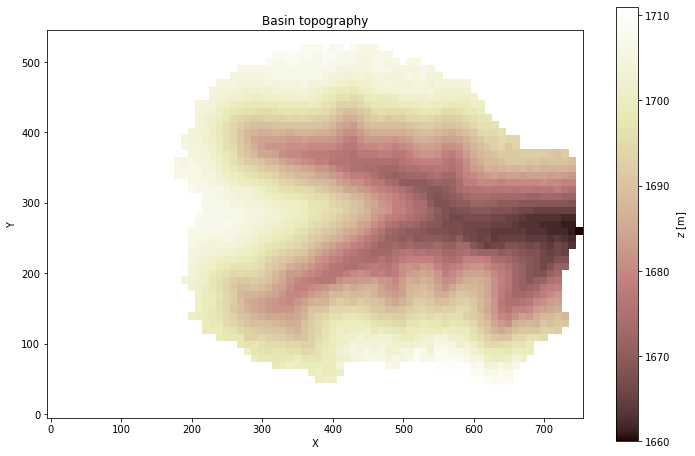

In [4]:
fv.plot_topography(rmg)

 ### *Find flowpaths from raster topography*
 We start by finding the drainage network and defining a minimum flow accumulation to define the channel using the `FLowAccumulator` and `ChannelProfiler` packages.

In [5]:
# Package for finding flow accumulation in each grid cell
from landlab.components import FlowAccumulator 
# Package for finding water accumulation depressions
from landlab.components import DepressionFinderAndRouter
from landlab.plot.imshow import imshow_grid_at_node

Call `FlowAccumulator` on the rmg grid and plot after one time setep

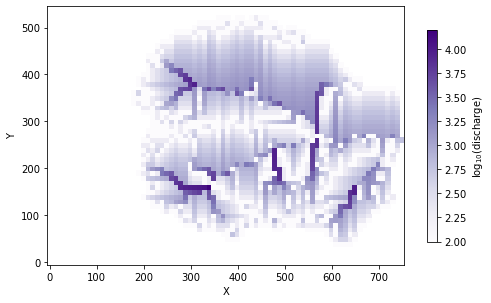

In [6]:
fa = FlowAccumulator(rmg, 
                     'topographic__elevation',
                     flow_director='FlowDirectorSteepest')
fa.run_one_step()

plt.figure(figsize=(8,6))
imshow_grid_at_node(rmg,\
                    np.log10(rmg.at_node['surface_water__discharge']),\
                    color_for_closed=None,cmap="Purples",shrink = 0.65,\
                    colorbar_label='log$_{10}$(discharge)')

That doesn't look like a very well defined channel network, let's fill in those depressions that are affecting the flow and then reroute it with `DepressionRouterandFinder`.

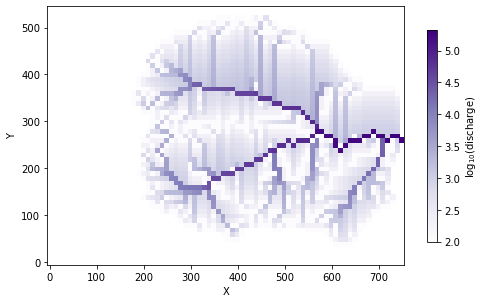

In [7]:
df_4 = DepressionFinderAndRouter(rmg)
df_4.map_depressions()

plt.figure(figsize=(8,6))
imshow_grid_at_node(rmg,
                    np.log10(rmg.at_node['surface_water__discharge']),
                    color_for_closed=None,cmap="Purples",shrink = 0.65,\
                    colorbar_label='log$_{10}$(discharge)')

Now, we use the `ChannelProfiler` package to extract the channels. The variable `'min_channel_thresh'` will define the threshold of flow accumulation required for a channel to be identified:
* Note: the complexity of the network modified by `'min_channel_thresh'` may affect the capabilities of the NetworkGrid set-up and the NetworkSedimentTransport model
    * You should ensure your `'min_channel_thresh'` is low enough to represent the catchment channels but high enough that that there aren't too many channels
    * We recommend a `'min_channel_thresh'` between 8,000 - 30,000 $m^2$

(*Notice that the discharge plots above were in log scale!*)

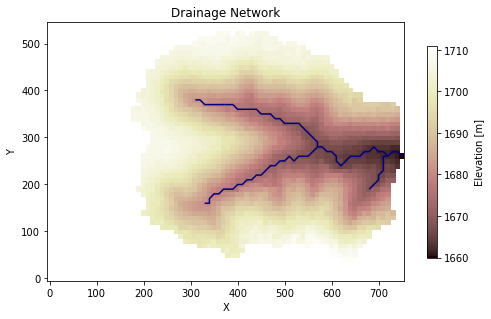

In [8]:
# Package for using water accumulation to exctract Channel profiler.
from landlab.components import ChannelProfiler
min_channel_thresh = 15000

def runChannelProfiler(Threshold):
  Threshold = 10**Threshold
  pf = ChannelProfiler(
    rmg,
    number_of_watersheds=1,
    minimum_channel_threshold=Threshold,
    main_channel_only=False,
    cmap='jet',
  )
  pf.run_one_step()
  plt.figure(figsize = (8,6))
  plt.title("Drainage Network")
  pf.plot_profiles_in_map_view(\
    colorbar_label='Elevation [m]',shrink=0.65,\
    color_for_closed=None)
  
  plt.show()
  return pf

profiler = runChannelProfiler(np.log10(min_channel_thresh))

Play here ⚽:
You can toggle this minimum channel threshold to refine the network!

In [9]:
# Create a slider for moving the threshold
_=iw.interact_manual(runChannelProfiler,\
               Threshold=iw.FloatSlider(min=0, max=5, value=4 , step=0.2));

interactive(children=(FloatSlider(value=4.0, description='Threshold', max=5.0, step=0.2), Button(description='…

What does the elevation of the channels look like going upstream?

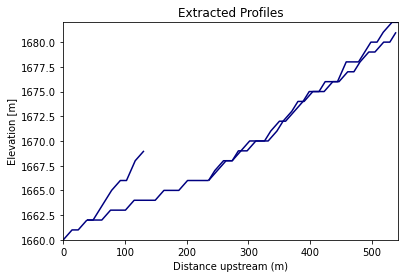

In [10]:
profiler.plot_profiles(xlabel='Distance upstream (m)',ylabel='Elevation [m]')

### *Create channel network grid*
Now we can create a `network_grid`. This network is composed of nodes and links, meaning it will work as a one-dimensional grid. We iterate through the watershed segments of the Channel profiler to define nodes at regular intervals `'d_node_spacing'`

* Note: both of the following should be considered when setting node spacing
    * `d_node_spacing` cannot be longer than shortest link segment (you don't want to skip channel segments! If you do want longer grid spacings, adjust the 'min_channel_thresh' variable in the ChannelProfiler function above in order to exclude smaller channel segments.
    * `d_node_spacing` should be greater than grid resolution (it doesn't make sense to have nodes that are closer together than channels can be resolved by the underlying DEM)

In [11]:
d_node_spacing = 20 #units to space nodes (see considerations above)

#obtain watershed key to access data from ChannelProfiler data structure
ws_keys = [k for k in profiler.data_structure.keys()]

#send message if there is more than 1 watershed (code is not currently set up to handle multipe watersheds)
if len(ws_keys) > 1:
    print('More than one watershed in DEM, unable to deliniate network properly')

#access number of channel segments
n_channel_segs = len(profiler.data_structure[ws_keys[0]])
#generate random colors to keep track of channel segs for plotting
colors = [list(np.random.random(3)) for i in range(n_channel_segs)] 

In [12]:
x_of_nodes = np.array([]) #empty list to store x locations of network model grid nodes
y_of_nodes = np.array([]) #empty list to store y locations of network model grid nodes
rmg_nodes = np.array([]) #empty list to store raster model grid node corresponding to each network model grid node
colors_nodes = [] #empty list to store colors corresponding to each channel segment
nodes_per_segment = [] #empty list to store number of nodes in each channel segment

links = [] #empty list to store links of network model grid
node_xy = []#empty list to store xy locations of network model grid nodes

#find the nodes of the start and end index of each segment
ws_start =[ws_seg[0] for ws_seg in profiler.data_structure[ws_keys[0]].keys()] 
ws_end = [ws_seg[1] for ws_seg in profiler.data_structure[ws_keys[0]].keys()]

#loop through each segment
for i, seg_key in enumerate(profiler.data_structure[ws_keys[0]].keys()):
    #access individual segment
    seg_i = profiler.data_structure[ws_keys[0]][seg_key] 
    #print(seg_i)
    # create array of idealized node locations using previously specified distance between nodes
    node_locs = np.arange(seg_i['distances'][0], seg_i['distances'][-1], d_node_spacing)
    n_possible_nodes = len(node_locs)
    nodes_per_segment.append(n_possible_nodes)
    
    #Find the index of the nearest channel cells to idealized node locations:
    idx_nodes = [np.abs(seg_i['distances'] - loc).argmin() for loc in node_locs]
    
    #obtain list of raster model grid nodes corresponding to channel nodes
    rmg_nodes_i = seg_i['ids'][idx_nodes]
    rmg_nodes = np.append(rmg_nodes, rmg_nodes_i) #append to list that will connect rmg node values to nmg
    
    #append x,y values to list of network model grid nodes from raster model grid
    x_of_nodes = np.append(x_of_nodes, rmg.x_of_node[rmg_nodes_i])
    y_of_nodes = np.append(y_of_nodes, rmg.y_of_node[rmg_nodes_i])
    
    #find links for x,y values
    for n in range(0,n_possible_nodes-1):

        head_node_xy = (rmg.x_of_node[seg_i['ids'][idx_nodes[n]]], rmg.y_of_node[seg_i['ids'][idx_nodes[n]]])
        tail_node_xy = (rmg.x_of_node[seg_i['ids'][idx_nodes[n+1]]], rmg.y_of_node[seg_i['ids'][idx_nodes[n+1]]])
            
        #the code below is taken from the read_shapefile landlab code
            
        # we should expect that the head node and tail node of later links will
        # already be part of the model grid. So we check, and add the nodes,
        # if they don't already exist.

        if head_node_xy not in node_xy:
            node_xy.append(head_node_xy)

        if tail_node_xy not in node_xy:
            node_xy.append(tail_node_xy)

        # get the index of the head and tail node index.
        head_node__node_id = node_xy.index(head_node_xy)
        tail_node__node_id = node_xy.index(tail_node_xy)

        # append the head and tail node ids to the link array
        links.append((head_node__node_id, tail_node__node_id))
        
        # let's make sure we have links connecting all of our channel segments!
        # check to see if the last node needs to be connected to the start of another segment
        if n == n_possible_nodes-2:
            if seg_i['ids'][-1] in ws_start:
                #Find the segment we need to connect
                seg_n = profiler.data_structure[ws_keys[0]][(ws_start[ws_start.index(seg_i['ids'][-1])],
                                                             ws_end[ws_start.index(seg_i['ids'][-1])])]
                
                #add the x,y locations of the nodes we are connecting
                head_node_xy = (rmg.x_of_node[seg_i['ids'][idx_nodes[n+1]]], rmg.y_of_node[seg_i['ids'][idx_nodes[n+1]]])
                tail_node_xy = (rmg.x_of_node[seg_n['ids'][0]], rmg.y_of_node[seg_n['ids'][0]])
                
                #if these nodes don't already exist in the array, add them! (but they should already be there)
                if head_node_xy not in node_xy:
                    node_xy.append(head_node_xy)
                if tail_node_xy not in node_xy:
                    node_xy.append(tail_node_xy)

                # get the index of the head and tail node index
                head_node__node_id = node_xy.index(head_node_xy)
                tail_node__node_id = node_xy.index(tail_node_xy)

                # append the head and tail node ids to the link array
                links.append((head_node__node_id, tail_node__node_id))
       
    #DEV ONLY: keep track of nodes per seg as explicit x and y locations
#     x_of_nodes.append(rmg.x_of_node[rmg_nodes_i])
#     y_of_nodes.append(rmg.y_of_node[rmg_nodes_i])
    
    #add colors to correspond to each segment (this is just for dev plotting and can be removed later)
    for n in range(len(rmg_nodes_i)):
        colors_nodes.append(colors[i])

print(links)     
#get unique nodes
xy_df = pd.DataFrame({'x': x_of_nodes, 'y': y_of_nodes})
uniq_x_of_nodes = xy_df.drop_duplicates()['x'].values
uniq_y_of_nodes = xy_df.drop_duplicates()['y'].values

#print(x_of_nodes)
#print(y_of_nodes)

[(0, 1), (1, 2), (2, 3), (3, 4), (4, 5), (5, 6), (2, 7), (7, 8), (8, 9), (9, 10), (10, 11), (11, 12), (12, 13), (13, 14), (14, 15), (15, 16), (16, 17), (17, 18), (18, 19), (19, 20), (20, 21), (21, 22), (22, 23), (23, 24), (24, 25), (25, 26), (26, 27), (27, 28), (28, 29), (29, 30), (30, 31), (16, 32), (32, 33), (33, 34), (34, 35), (35, 36), (36, 37), (37, 38), (38, 39), (39, 40), (40, 41), (41, 42), (42, 43), (43, 44), (44, 45), (45, 46)]


Label the watershed segments by their id number and color nodes according to their watershed segement

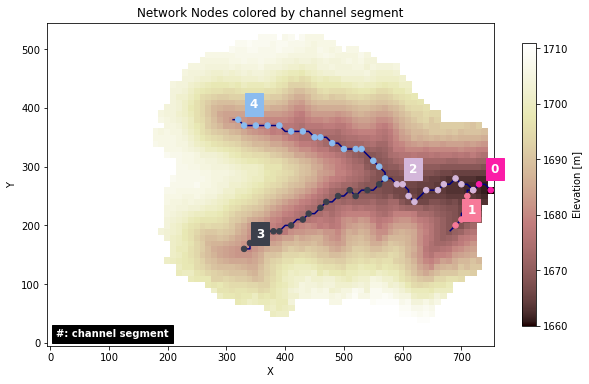

In [13]:
plt.figure(figsize = (10,8))
profiler.plot_profiles_in_map_view(\
    colorbar_label='Elevation [m]',shrink=0.65,\
    color_for_closed=None,output=False)
plt.scatter(x_of_nodes, y_of_nodes, c=colors_nodes, s=30, zorder=2)

#hacky way to label channel segments with #s -------
node_id = 0 #dummy counter
idx_x = [] #store indexes to acces x,y location of last node on channel
#loop through channels, get node index
for node_len in nodes_per_segment:
    node_id+=node_len
    idx_x.append(node_id-1)
#plot numbers at last node for each channel seg
for i in range(n_channel_segs):
    plt.text(x_of_nodes[idx_x[i]]+20,
             y_of_nodes[idx_x[i]]+20,
             '%d'%i,
             color='white',backgroundcolor=colors[i],
             fontweight='bold',fontsize="large")
plt.text(10,10,'#: channel segment',
         color='white', backgroundcolor="black",
         fontweight='bold')
plt.title('Network Nodes colored by channel segment')
plt.show()

The list of nodes and links just created can be used to form a `network_grid`.

In [14]:
# Package for building a Network Model Grid
from landlab.grid.network import NetworkModelGrid
# Package for building a building a Network Graph
from landlab.graph.graph import NetworkGraph

x_of_node, y_of_node = zip(*node_xy)

# We want to ensure that we maintain sorting, so start by creating an
# unsorted network graph and sorting.
# The sorting is important to ensure that the fields are assigned to
# the correct links.
graph_net = NetworkGraph((y_of_node, x_of_node), links=links, sort=False)
#                        ^                    ^ ^          ^
#                        ^--Node Coordinates--^ ^-Links id-^

sorted_nodes, sorted_links, sorted_patches = graph_net.sort()

# use the sorting information to make a new network model grid.
network_grid = NetworkModelGrid(
    (np.asarray(y_of_node)[sorted_nodes], np.asarray(x_of_node)[sorted_nodes]),
     np.vstack((graph_net.node_at_link_head, graph_net.node_at_link_tail)).T,
)

We can plot nodes and links on the newly formed `network_grid`.

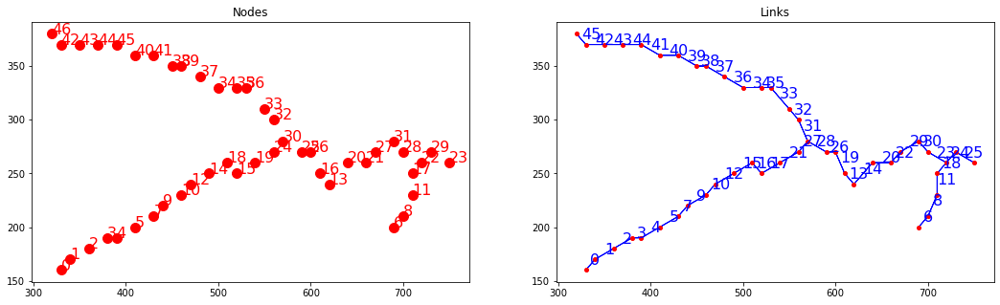

In [15]:
fv.plot_network(network_grid)

Now, we can track water flow over the catchment and sediment movement though the drainiage network with accurate indexing and registration. 

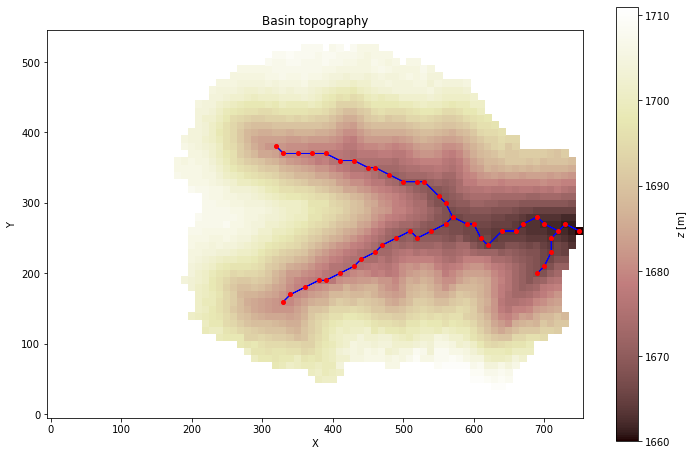

In [16]:
fv.plot_topography(rmg, network_grid)

### 1.2 Precipitation
Once grids are set up, the `SpatialPrecipitationDistribution`component is used to create a time series of spatially-variable rainfall events to simulate over the upland catchment. 

### *Add an initial storm*
Rain is added as a layer of water on top of the topography imported before. For the overland flow model, this is done by adding information to the `surface_water__depth` attribute of the grid `rmg` we are working on. 

First, we can add a homogeneous rain falling over the whole domain just by populating `surface_water__depth` with a constant value `h_init`.

In [17]:
# Initial thin layer of water (m)
h_init = 0.05 

# set water level at all nodes to initial height
rmg.at_node["surface_water__depth"] = np.zeros(rmg.number_of_nodes)
h = rmg.at_node['surface_water__depth']  # h >> surface water depth
h += h_init   

Similarly, a spatially variable rain pattern can be added modifying the array `h`. In this case, we add some more rain in a rectagular region. 

In [18]:
# Create a list of indexes where to add the rain
bools = (rmg.node_y > 100)*(rmg.node_y < 450)*(rmg.node_x < 400)*(rmg.node_x > 200)

# Add the rain only to the indexes defined above
h[bools] = 0.15 #initial water depth m

Let's check how this initial storm is distributed on the basin by plotting `h`  across the upland catchment. 

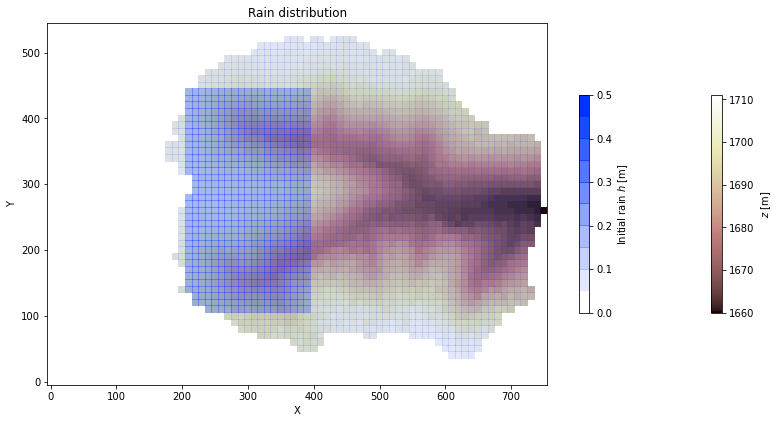

In [19]:
fv.plot_storm(rmg,h)

### *Prepare storm time series* 
a time series of storms likethe previous section are generated for the entire model run time. They produce rain in the specified region for a set duration, but the magnitude of rainfall varies.  

We first must determine how long we will run the model for before we generate the rainfall time series, be setting `'run_time'`.

In [20]:
from landlab.components import SpatialPrecipitationDistribution
import shutil

run_time = 60*60 #2 hours of rain 

Create a folder to house rainfall time series

In [21]:
# Folder for rainfall data
dir_rainfall = './rainfall_series'
# Overwrite or create directory for rainfall data
if os.path.exists(dir_rainfall):
    shutil.rmtree(dir_rainfall)
os.makedirs(dir_rainfall)

The duration and magnitude of storm events are set with the following variables: 
   * `'nb_years'` duration of each storm event. For example, if this is set to 90 each generated storm event lasts 90 seconds. we recommend this set at about 120 seconds.  
   * `'rainfall_scaling'` factor to scale rainfall events by.  For example, if this is set to .5, cells in the upland catchment expeirence half a meter of rainfall per time step for the duration on `'nb_years'`. we recommend this be set at about .2 m.
   

In [22]:
# time scale for rainfall events
nb_years = 30
# Factor to scale rainfall values 
rainfall_scaling = 1

# Create time series of rainfall events (output is in mm/h)
rain = SpatialPrecipitationDistribution(rmg,number_of_years = nb_years)
np.random.seed(18)  # arbitrary to get a same storm everytime if the same variable rmg, rainfall_scaling, and nb_years are used. 

# Container for rainfall duration
storm_t_all = []
interstorm_t_all = []

# get the storm simulator to provide a storm
# Variables required to generate rainfall datasets
i = 0
max_rainfall = []
for (storm_t, interstorm_t) in rain.yield_storms():  # storm lengths in hrs
    i += 1
    rmg.at_node['rainfall__flux'] *= 0.001  # because the rainfall comes out in mm/h
    rmg.at_node['rainfall__flux'] *= rainfall_scaling  # to change magnitude of event

    # Save rainfall data to ascii file
    write_esri_ascii('./'+ dir_rainfall +'/rainfall_'+ str(i) + '.asc', rmg, 'rainfall__flux', clobber=True)
    
    # Save duration of storm and non-storm periods
    storm_t_all.append(storm_t)
    interstorm_t_all.append(interstorm_t)
    
    # Store max rainfall value
    max_rainfall.append(max(rmg.at_node['rainfall__flux']))

storm_ids = np.array(range(len(storm_t_all))) + 1

# Get moment of storms (initially in hours, to be rescaled over run_time)
days_storms = (np.array(interstorm_t_all)/24)
scaled_days_storms_steps = (days_storms * (run_time / (nb_years*365))).round()
scaled_days_storms = scaled_days_storms_steps.cumsum()
# Set first storm a time = 1
scaled_days_storms = scaled_days_storms - scaled_days_storms[0] + 1

#Set initial water depth values and rainfall flux values
rmg.at_node["surface_water__depth"] = np.zeros(rmg.number_of_nodes)
rmg.at_node.pop('rainfall__flux')

array([ 0.,  0.,  0., ...,  0.,  0.,  0.])

### 2.3 Calculate discharge from first storm

The rain field will act as the initial condition for the `OverlandFlow` component in section 1.3 to calculate the discharge in the basin. We start by initializing the `surface_water__discharge` attribute in `rmg` with data from our first rainfall event.

In [23]:
# Read first rainfall data
q_rain = read_esri_ascii(dir_rainfall + '/rainfall_1.asc', grid=rmg, name='rainfall__flux')
# Update id for rainfall
rainfall_id = 1

# Update surface water depth with rainfall data
rmg.at_node['surface_water__depth'].fill(1.e-12)  # a veneer of water stabilises the model
rmg.at_node['surface_water__depth'] += rmg.at_node['rainfall__flux'] 

## Set inital discharge with first storm, if any
rmg.at_node["surface_water__discharge"] = q_rain[1]


### 1.3 Water Surface
After rain is added to he catchment, the `'OverlandFlow'` component routes water over the topography and updates water surface elevation at each node and discharge at each link. 

In [24]:
from landlab.components import OverlandFlow

# Upland overland flow
uplandOF = OverlandFlow(rmg, steep_slopes=True)
uplandOF.run_one_step()

### 1.4 Connect Grids
The raster model grid is querried to pass variable to the netwrok grid which are necessary for computing sediment transport. we landlab functions are used to determine which raster nodes hold the data we want to pass to the flooplain upstream boundary. 

###  *Assign Node fields*

For each network grid node, `'topographic_elevation'` value are set equal to the nearst raster grid node's elevation. 

In [25]:
nmg_node_topo = np.zeros(network_grid.number_of_nodes) #create empty array holding node elevations for network model grid
nmg_node_h = np.zeros(network_grid.number_of_nodes) #same for water level

for i in range(network_grid.number_of_nodes):
    idx_nearest_raster_cell = rmg.find_nearest_node([network_grid.x_of_node[i], network_grid.y_of_node[i]])
    nmg_node_topo[i] = rmg.at_node["topographic__elevation"][idx_nearest_raster_cell]
    
network_grid.at_node["topographic__elevation"] = nmg_node_topo.copy()

network_grid.at_node["bedrock__elevation"] = nmg_node_topo.copy()

###  *Assign Link fields*

For each network grid link, `'flow_depth'` is set equal to the n raster grid node nearest that link's upstream end.  `'reach_length'` is determined for each link by measuring the distance between node's upstream and downstream end.

In [26]:
nmg_link_h = np.zeros(network_grid.number_of_links)#create empty array holding link flow depths for network model grid
nmg_link_length = np.zeros(network_grid.number_of_links) # same for reach_length

for i in range(network_grid.number_of_links):
    idx_node_1_link = network_grid.nodes_at_link[i][0]
    idx_node_2_link = network_grid.nodes_at_link[i][1]
    nmg_link_length[i] = np.sqrt((network_grid.x_of_node[idx_node_2_link] - network_grid.x_of_node[idx_node_1_link])**2 
                         + (network_grid.y_of_node[idx_node_2_link] - network_grid.y_of_node[idx_node_1_link])**2)
    square_idx = rmg.find_nearest_node([network_grid.x_of_node[idx_node_1_link], network_grid.y_of_node[idx_node_1_link]]) #get raster grid idx closest to link tail
    nmg_link_h[i] = rmg.at_node['surface_water__depth'][square_idx] #assign surface at square_idx to network grid
    
network_grid.at_link["channel_width"] = 10 * np.ones(network_grid.number_of_links) #set uniform channel width thoughout network

network_grid.at_link["flow_depth"] = nmg_link_h.copy()

network_grid.at_link["reach_length"] = nmg_link_length

### *Determine outlet node*
To link catchment to floodplain, we visually determine the network grid's outlet node number and set it as `'outlet_node'`. We use the raster grid nodes surrounding the netwrok grid outlet's locationto determine a catchment outlet/floodplain inlet water surface level and bed elevation.     

In [27]:
# keep track of hydrograph at outlet 
hydrograph_time = []
discharge_at_outlet = []
height_at_outlet = []

outlet_node = 23

#find cell on raster grid nearest most downstream node on netwrok grid
outlet_nearest_raster_cell = rmg.find_nearest_node([network_grid.x_of_node[outlet_node], network_grid.y_of_node[outlet_node]])
print(outlet_nearest_raster_cell)

#define group of cells to search for high water level - this handles some instabilities at outlet 
search_nodes = rmg.nodes_around_point(network_grid.x_of_node[29], network_grid.y_of_node[29]) 
search_nodes_discharge = rmg.nodes_around_point(network_grid.x_of_node[outlet_node], network_grid.y_of_node[outlet_node]) 

2051


### 1.5 Sediment Flux
With water surface elevation solved on the raster grid and transfered to nodes in the network grid, `NetworkSedimentTransporter` can track a `DataRecord` parcels distributed along the netwrok grid -  solving for their location everyime the component is called. 


`FlowDirectorSteepest` is used to route flow through the network grid for the sediment transport calculation.

In [28]:
from landlab.components import FlowDirectorSteepest

# Flow direction in channel network
fd = FlowDirectorSteepest(network_grid, "topographic__elevation")
fd.run_one_step()

`NetworkSedimentTransporter` is used to track parcel locations as they are transported along the grid as bed load. Many variables are defined to characterize parcels distributions as a `'DataRecord'`.

In [29]:
from landlab.data_record import DataRecord
from landlab.components import NetworkSedimentTransporter

`'element_id'` is the link on which the parcel begins. additional columns are added with new locations every time step. locations are noted with link numbers.

In [30]:
element_id = np.repeat(np.arange(network_grid.number_of_links), 50)
element_id = np.expand_dims(element_id, axis=1)
items = {"grid_element": "link", "element_id": element_id}

the following variables all describe the parcel's physical properties necessary for transport calculations. 

In [31]:
volume = 1*np.ones(np.shape(element_id))  # (m3)
active_layer = np.ones(np.shape(element_id)) # 1= active, 0 = inactive
density = 2650 * np.ones(np.size(element_id))  # (kg/m3)
abrasion_rate = 0 * np.ones(np.size(element_id)) # (mass loss /m)

# Lognormal GSD
medianD = 0.002 # m, coarse sand
mu = np.log(medianD)
sigma = np.log(2) #assume that D84 = sigma*D50
np.random.seed(42)
D = np.random.lognormal(
    mu,
    sigma,
    np.shape(element_id)
)  # (m) the diameter of grains in each parcel


#randomly distribute parcels along link, so they dont begin aggregated at nodes.
time_arrival_in_link = np.random.rand(np.size(element_id), 1) 
location_in_link = np.random.rand(np.size(element_id), 1) 
lithology = ["quartzite"] * np.size(element_id)

variables = {
    "abrasion_rate": (["item_id"], abrasion_rate),
    "density": (["item_id"], density),
    "lithology": (["item_id"], lithology),
    "time_arrival_in_link": (["item_id", "time"], time_arrival_in_link),
    "active_layer": (["item_id", "time"], active_layer),
    "location_in_link": (["item_id", "time"], location_in_link),
    "D": (["item_id", "time"], D),
    "volume": (["item_id", "time"], volume)
}


Parcels are tracked in a `DataRecord` and are flagged once they are transported out of the network and past the outlet node. 

In [32]:
parcels = DataRecord(
    network_grid,
    items=items,
    time=[0.0],
    data_vars=variables,
    dummy_elements={"link": [NetworkSedimentTransporter.OUT_OF_NETWORK]},
)

Initiate `NetworkSedimentTransporter` component with `'network_grid'`, parcel record,and flow routing component

In [33]:
#network sed transporter 
nst = NetworkSedimentTransporter(    
    network_grid,
    parcels,
    fd,
    bed_porosity=0.3,
    g=9.81,
    fluid_density=1000,
    transport_method="WilcockCrowe",
)

Time step for sediment transport calculation set at `'dt_sed'`

In [34]:
dt_sed = 60 #(seconds)

## 2. Floodplain and Channel

### 2.1 Topology

In [35]:
from landlab import RasterModelGrid

# set up overland flow grid for small-scale floodplain
Channel_Depth = 1.5
Channel_Width = 10
nX = 200
nY = 100
spacing = 1.0
Datum = network_grid.at_node['topographic__elevation'][outlet_node] + Channel_Depth
h_initFP = 0.1

In [36]:
def makeFP(Channel_Depth, Channel_Width, Datum):
   
    #Define grid
    nX = 200
    nY = 100
    spacing = 1.0
    h_initFP = 0.1

    _grd = RasterModelGrid((nX, nY), xy_spacing=1.)

    # Pointer to topographic elevation > z
    _z = np.ones(nX*nY) * Datum
    _z = _grd.add_field('topographic__elevation', _z, at='node')

    
    # Add a longitudinal slope 
    ## (makes thing flow north to south)
    Long_Slope = 1./1000
    _z += _grd.node_y*Long_Slope

    # Add the channel indentation 
    ## (it's just a straigth strip)
    
    isChannel = (_grd.node_x > (nY/2 - Channel_Width/2)) * (_grd.node_x < (nY/2 + Channel_Width/2))
    _z[isChannel] -= Channel_Depth

    # Add a slope to the banks
    ## (so water flows always towards the main channel)
    Transversal_Slope = 1./100
    _z += np.abs(_grd.node_x-(nY/2))*Transversal_Slope

    # Add some random noise to the floodplains
    ## (makes the hillshading look prettier)
    _z += ~isChannel * np.reshape(np.tile(np.random.rand(10,10)*0.20,[int(nX/10),int(nY/10)]),nX*nY) 
    
    return _grd, _z, isChannel

In [37]:
gridFP, zFP, isChannel = makeFP(Channel_Depth = Channel_Depth, Channel_Width = Channel_Width, Datum=Datum)

### 2.2 Water Surface

In [38]:
# Pointer to surface water depth in the 2D floodplain
hFP = np.zeros(nX*nY)
bools = (gridFP.node_x > nY/2 - Channel_Width*1.5) * (gridFP.node_x < nY/2 + 1.5*Channel_Width) * (gridFP.node_y >= nX-5)

hFP = gridFP.add_field('surface_water__depth', hFP, at='node')
hFP[bools] = .1# Channel_Depth*0.5
hFP += h_initFP

In [39]:
# overland flow in the floodplain
floodplainOF = OverlandFlow(gridFP, steep_slopes=True)

### 2.3 Infiltration

In [40]:
from landlab.components import SoilInfiltrationGreenAmpt

dFP = gridFP.add_ones("soil_water_infiltration__depth", at="node", dtype=float)
dFP *= 0.2
#open boundaries at all grid edges except north
gridFP.set_fixed_value_boundaries_at_grid_edges(False, True, False, False,value=0, value_of = 'surface_water__depth')
hcFP = gridFP.add_ones('hydraulic_conductivity', at='node')
hcFP *= 1.0E-5

infBandWidthNorm = 0.3
infBandWidth = nY/2 * infBandWidthNorm

channel_left = (nY + Channel_Width) / 2
channel_right = (nY - Channel_Width) / 2


#Define high infiltration bands at the banks

highInfBand = np.logical_and(gridFP.x_of_node < channel_left + infBandWidth, 
                             gridFP.x_of_node > channel_right - infBandWidth)
inf_maskFP = np.logical_xor(highInfBand, isChannel)

hcFP[inf_maskFP] *= 10


In [41]:
# soil infiltration in the floodplain
SI = SoilInfiltrationGreenAmpt(gridFP, hydraulic_conductivity=hcFP)

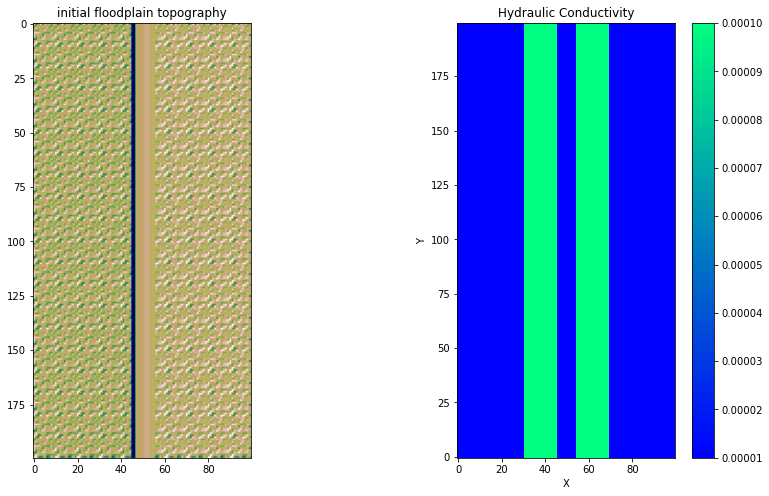

In [42]:
# Plot floodplain
fv.plot_initial_floodplain(zFP, nX, nY, gridFP)

## 3. Run Model

### *Prepare for output*

In [43]:
# Folders from saving figures
dir_output_list = ['./output/floodplain', './output/flow','./output/sed']
for folder in dir_output_list:
# Overwrite or create directory for plots
    if os.path.exists(folder):
        shutil.rmtree(folder)
    os.makedirs(folder)

### *Run components together in loop*

In [44]:
elapsed_time = 1.
iters = 0
old_channel_depth = Channel_Depth

dt_sed = 60
run_time_slices = np.arange(dt_sed,run_time+1,dt_sed)
rainfall_id = 0


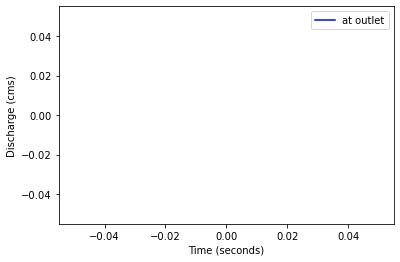

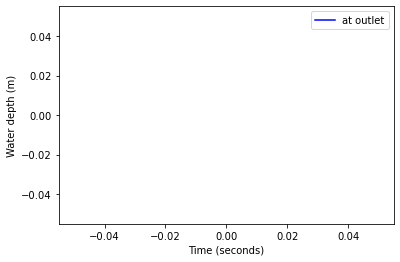

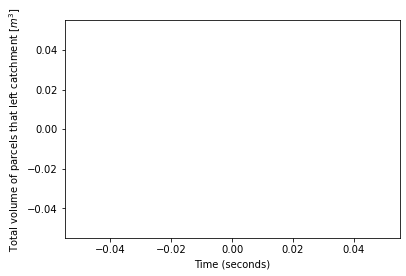

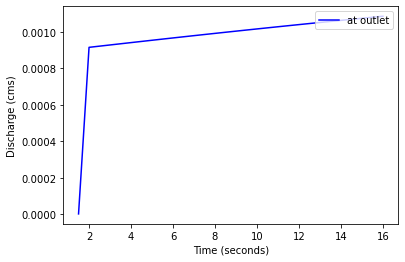

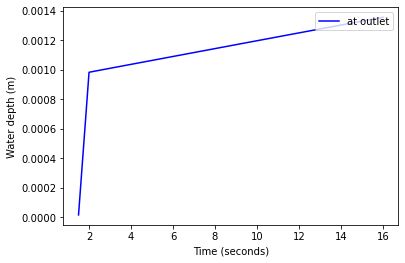

...

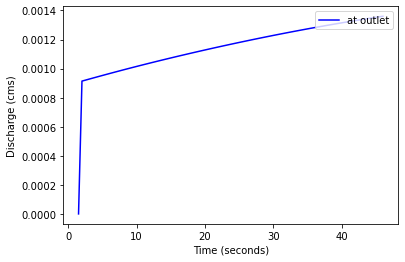

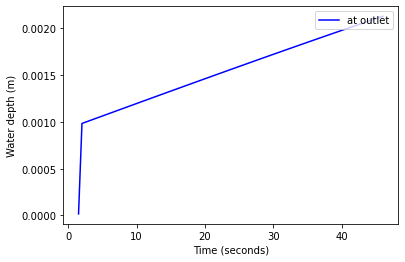

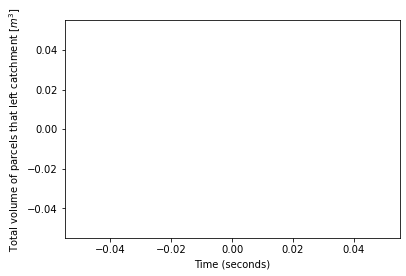

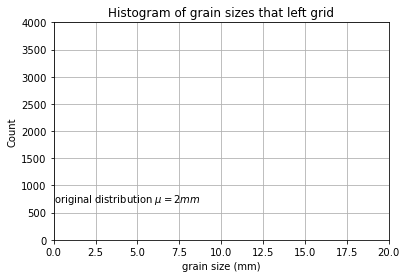

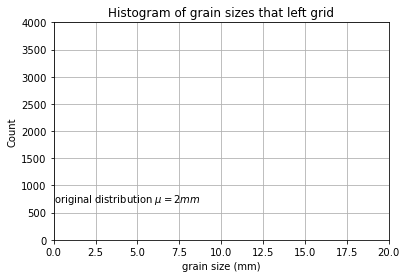

60.0


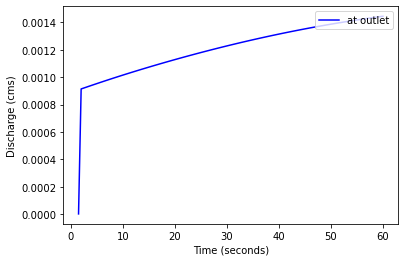

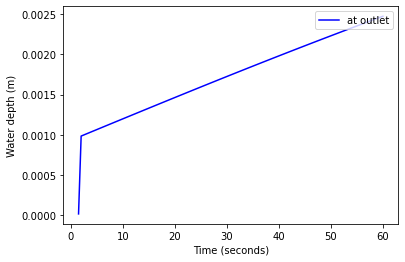

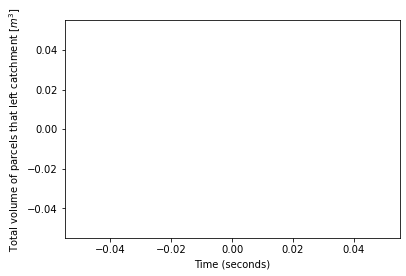

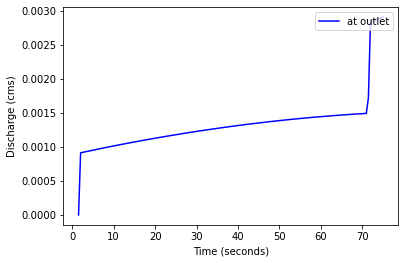

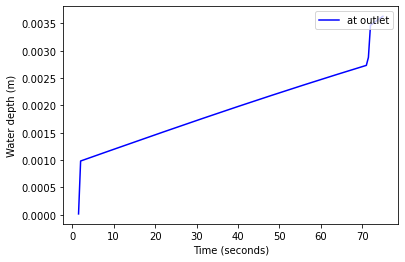

...

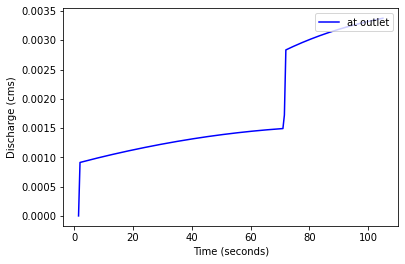

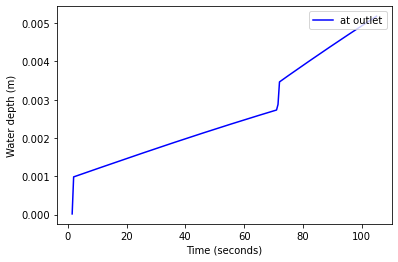

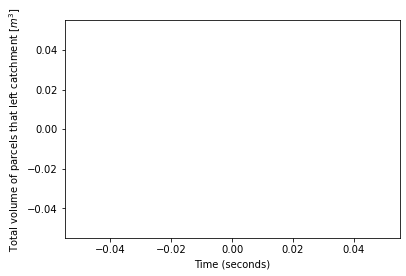

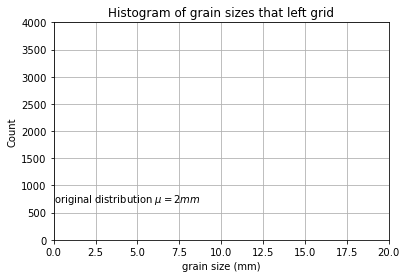

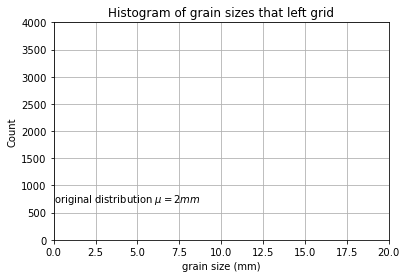

120.0


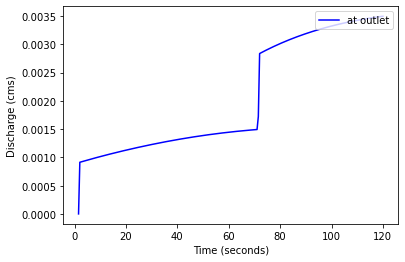

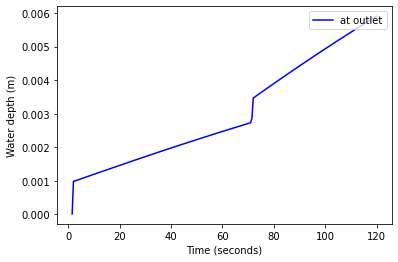

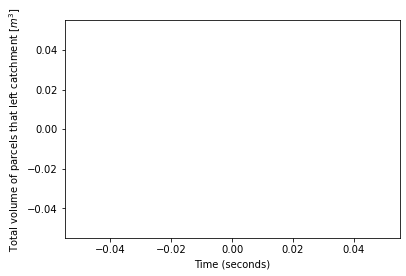

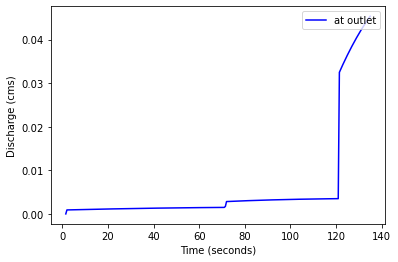

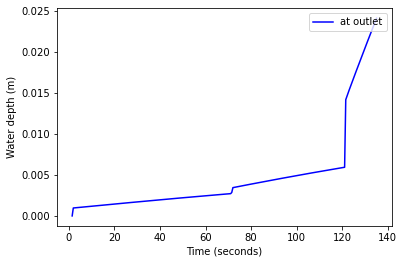

...

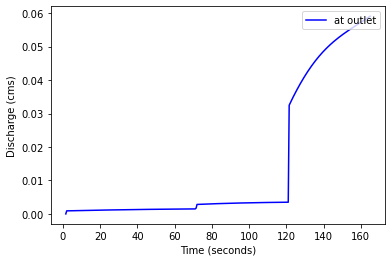

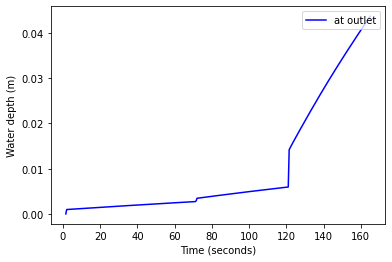

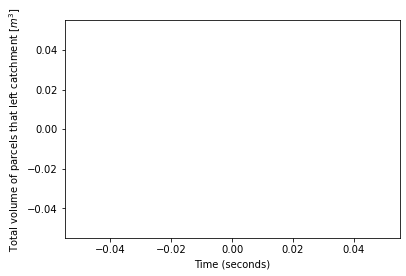

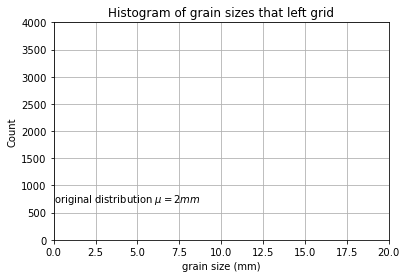

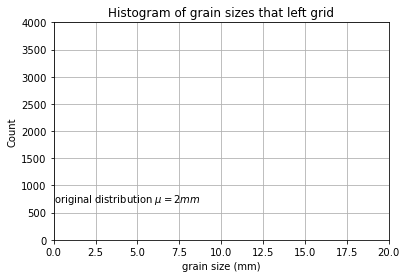

180.0


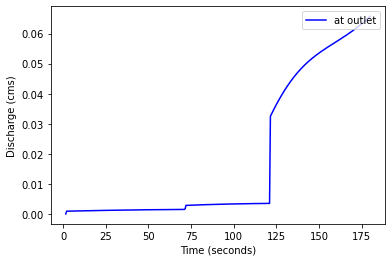

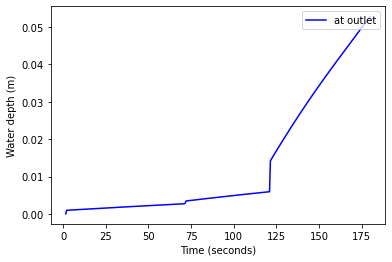

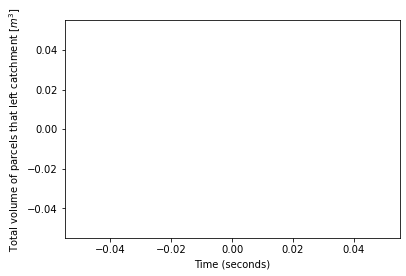

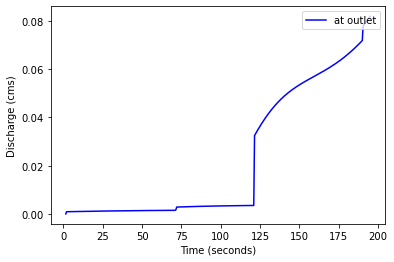

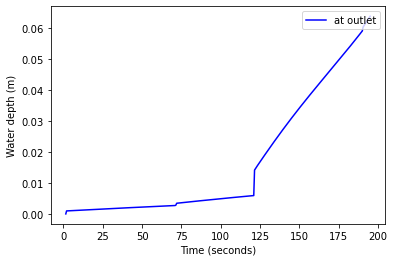

...

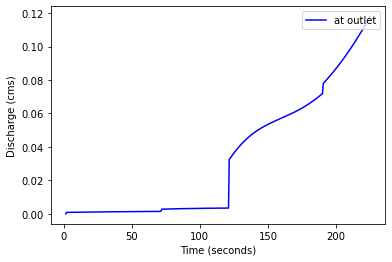

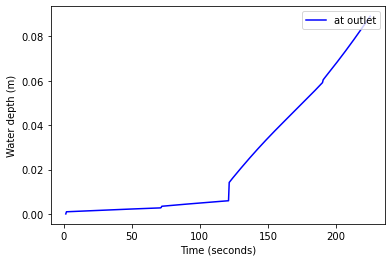

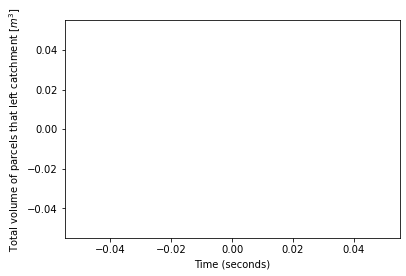

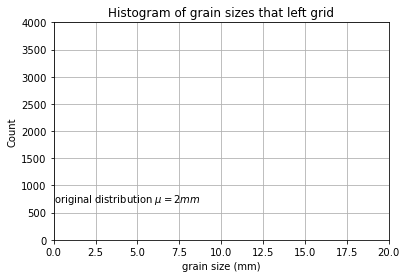

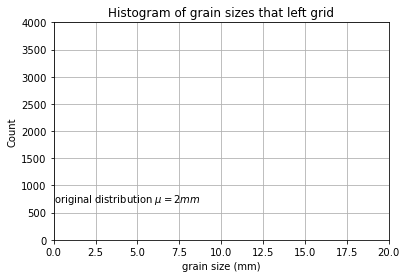

240.0


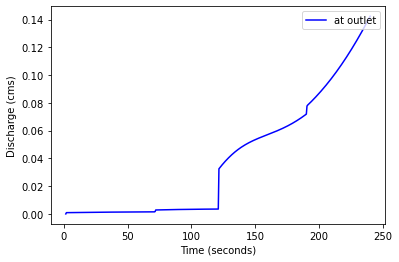

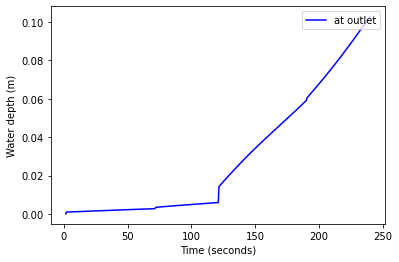

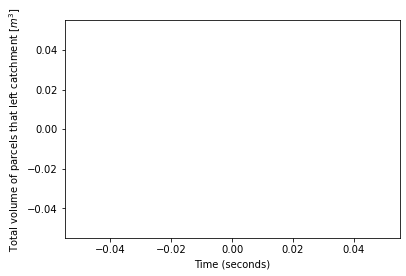

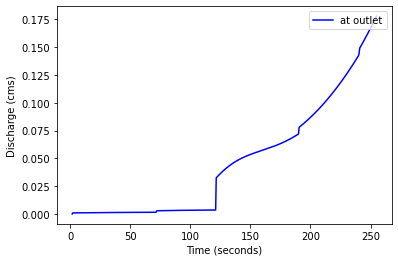

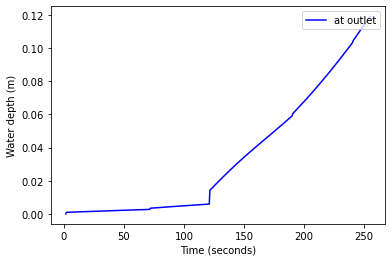

...

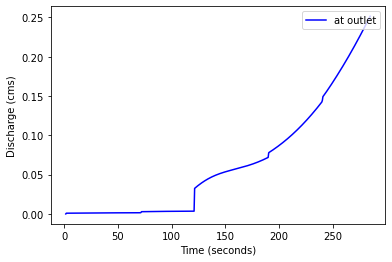

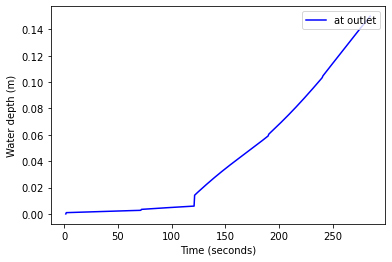

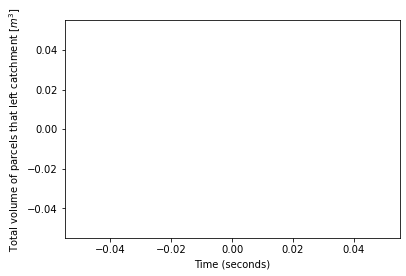

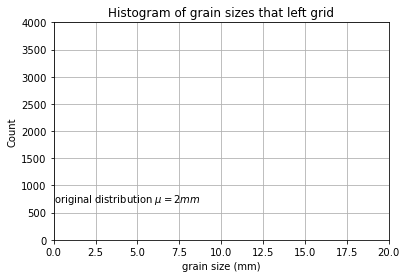

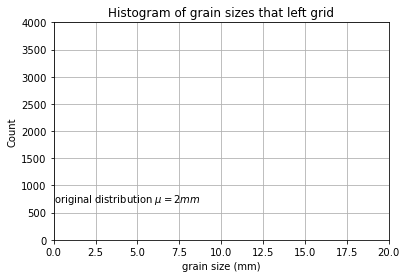

300.0


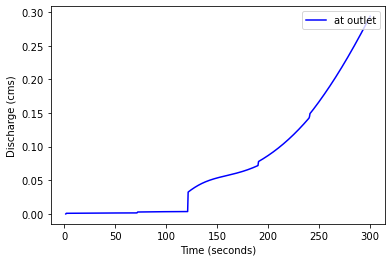

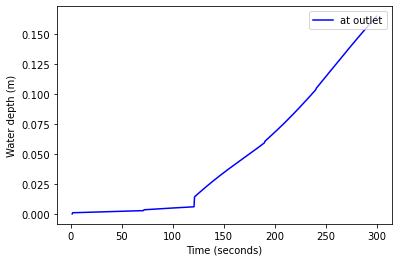

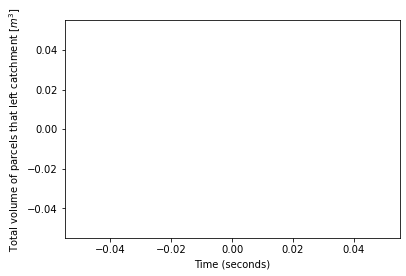

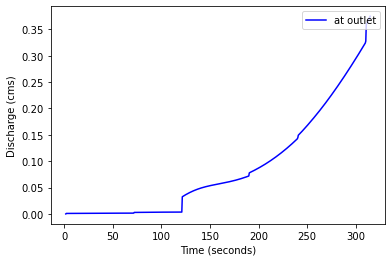

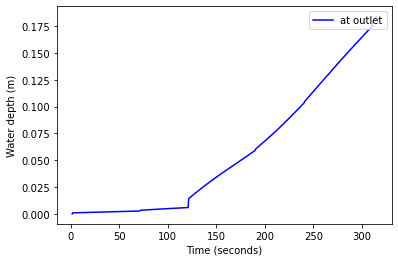

...

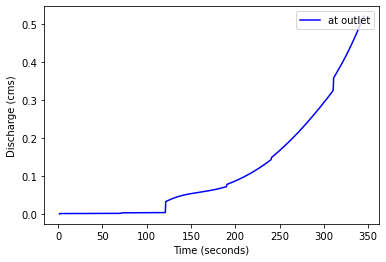

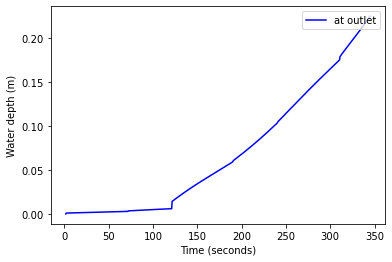

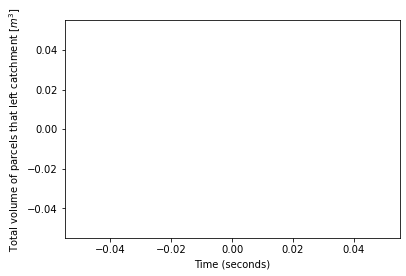

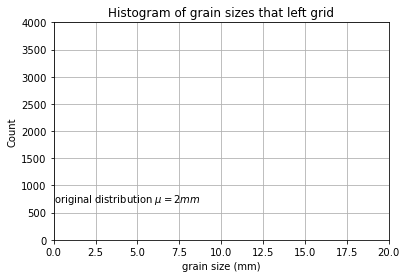

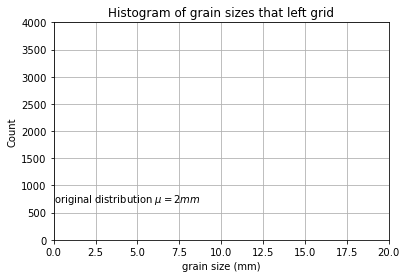

360.0


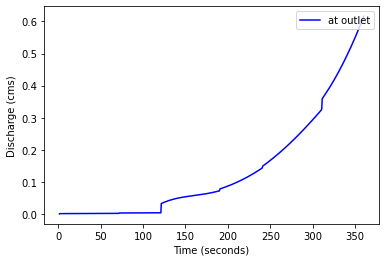

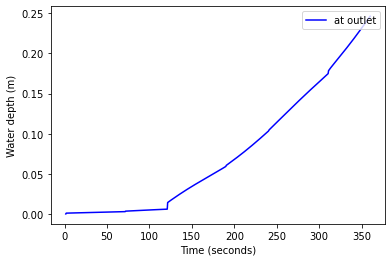

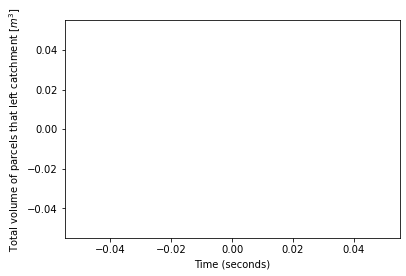

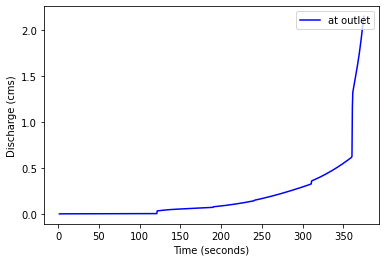

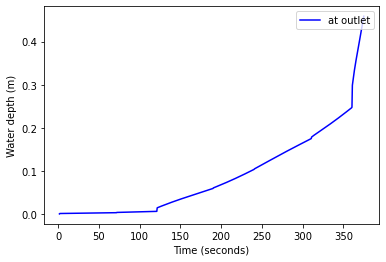

...

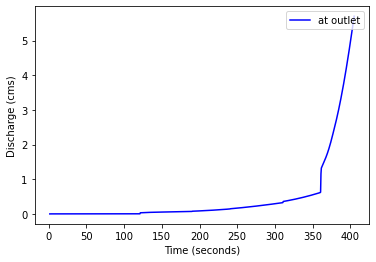

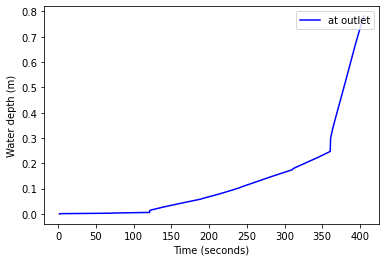

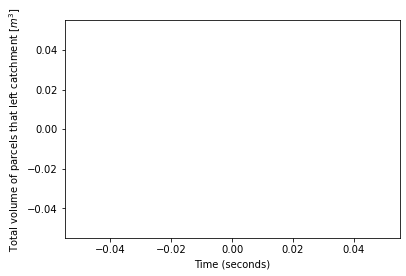

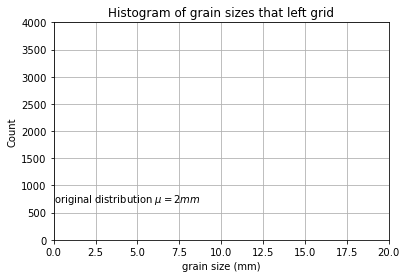

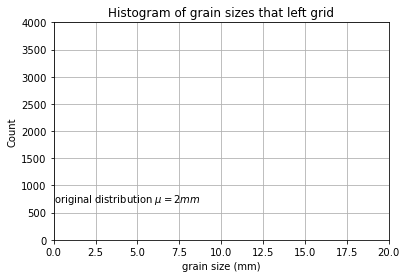

420.0


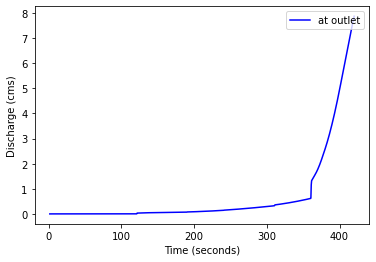

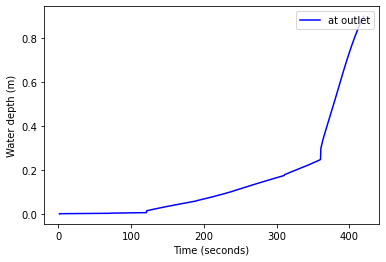

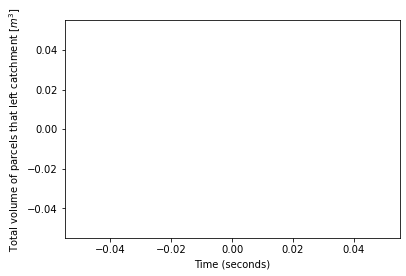

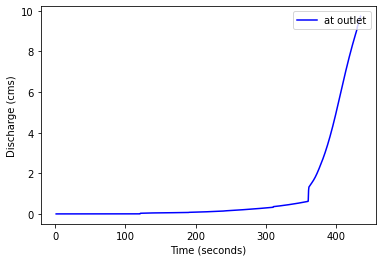

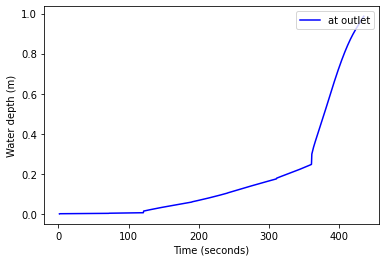

...

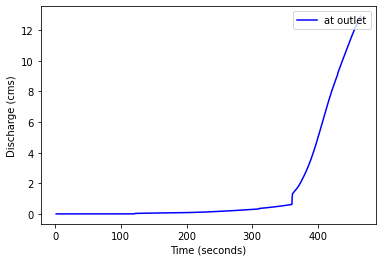

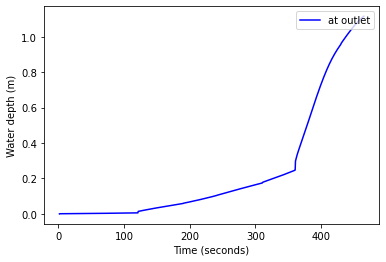

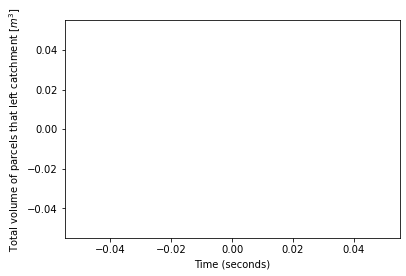

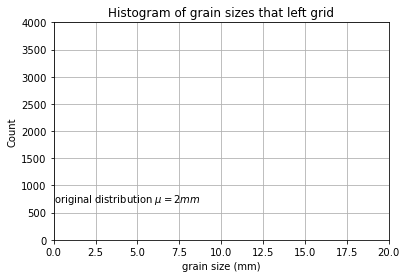

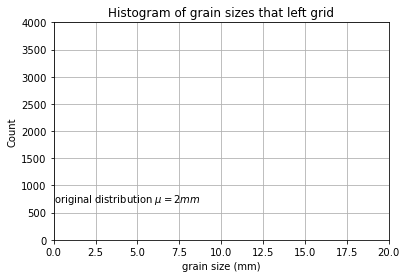

480.0


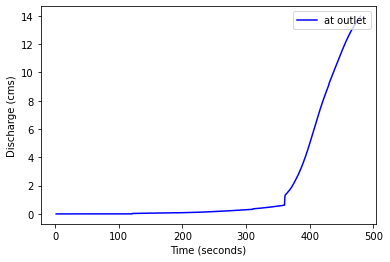

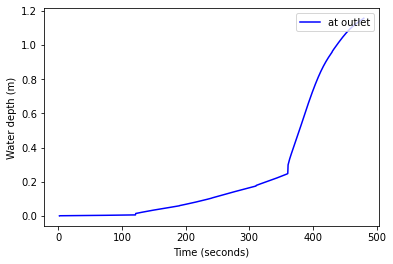

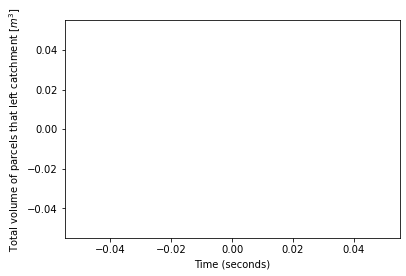

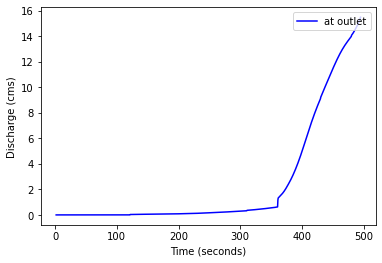

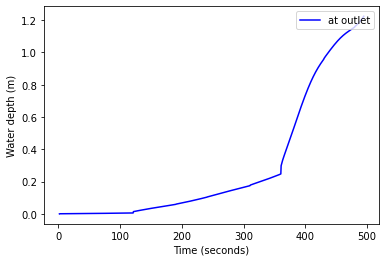

...

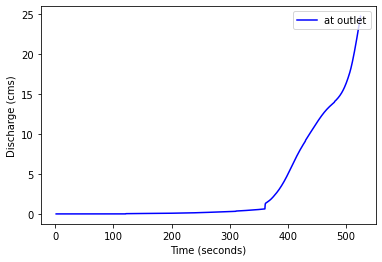

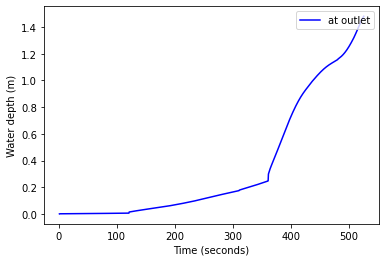

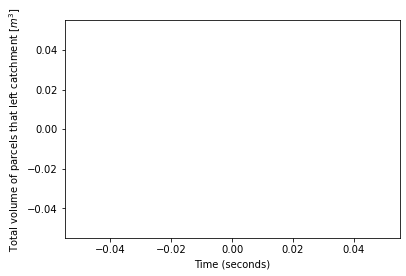

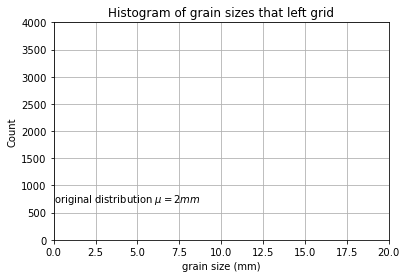

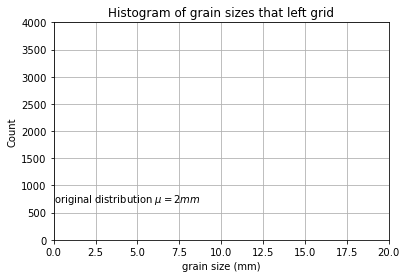

540.0


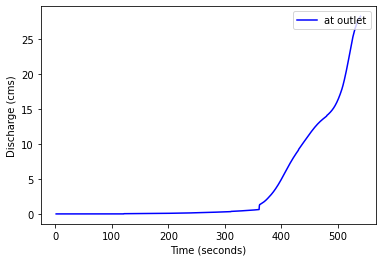

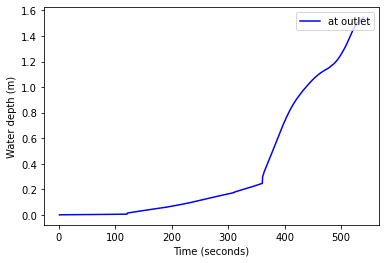

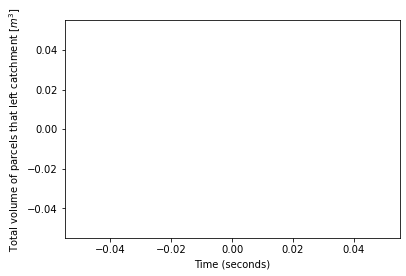

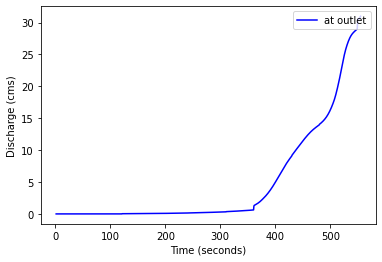

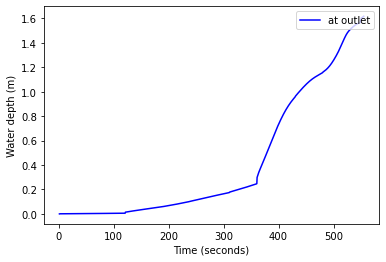

...

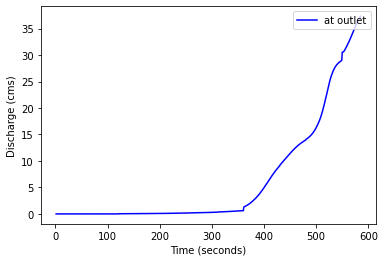

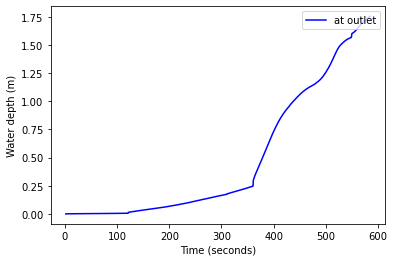

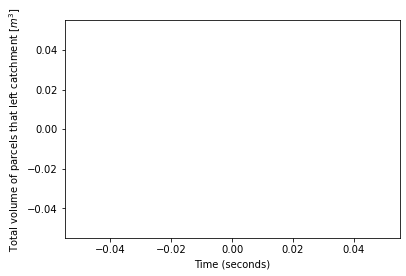

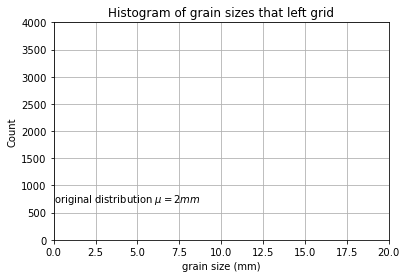

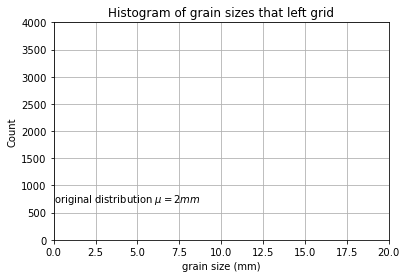

600.0


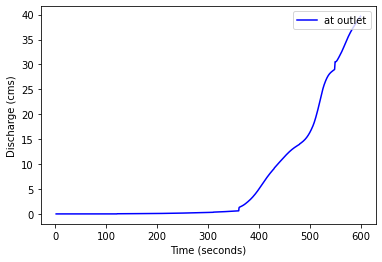

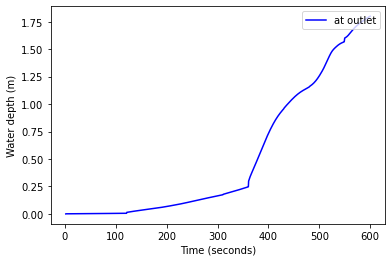

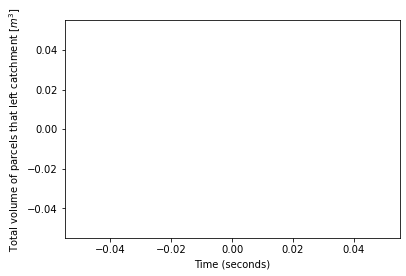

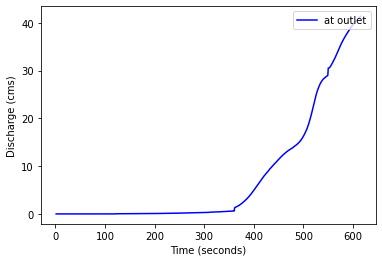

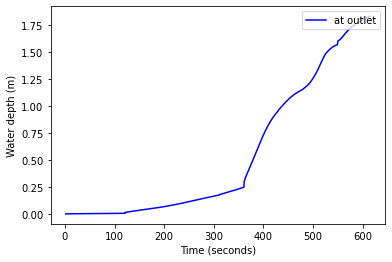

...

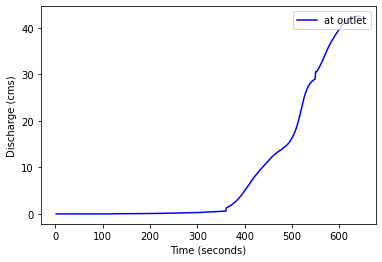

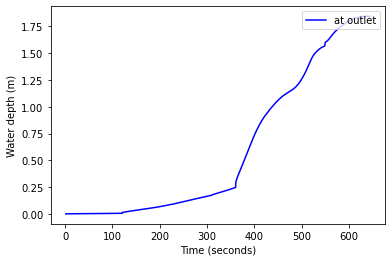

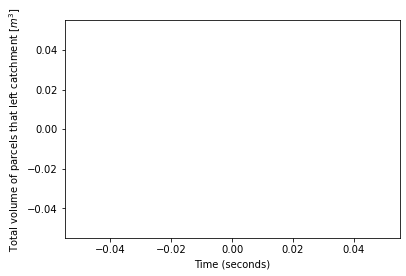

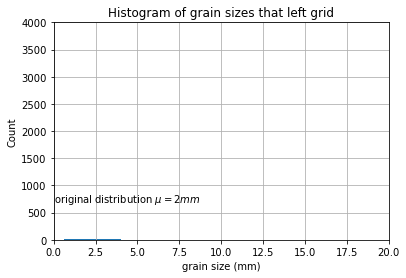

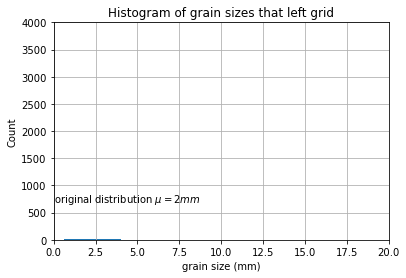

660.0


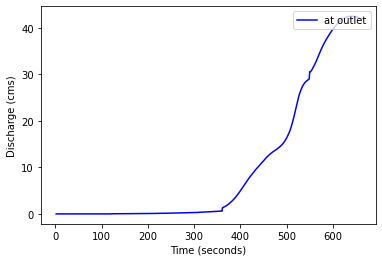

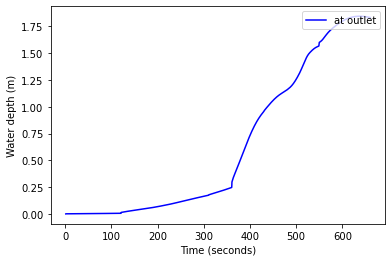

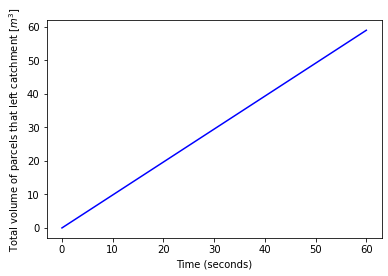

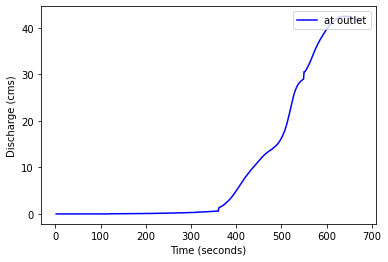

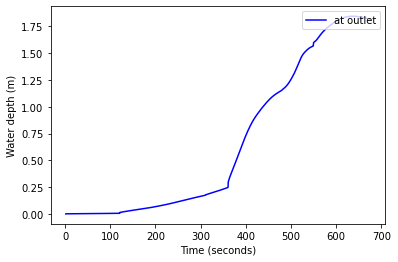

...

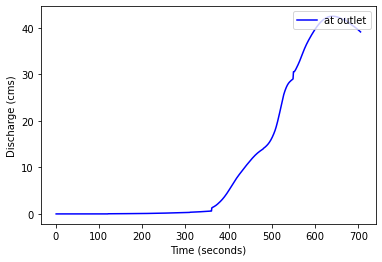

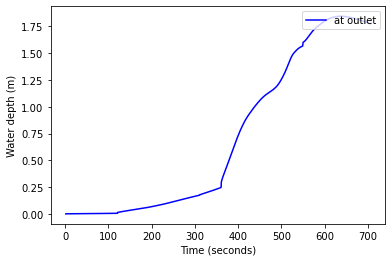

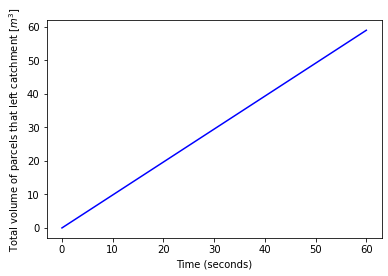

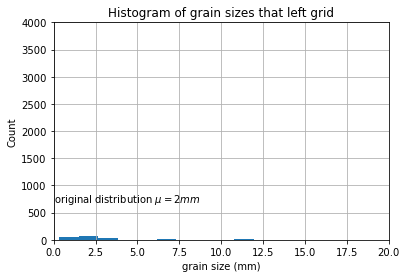

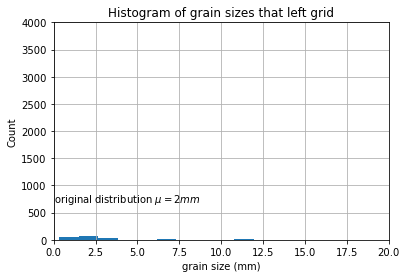

720.0


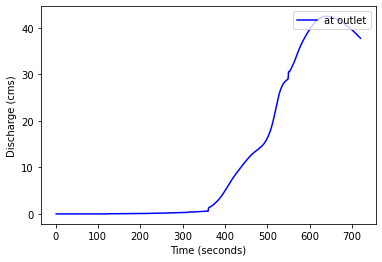

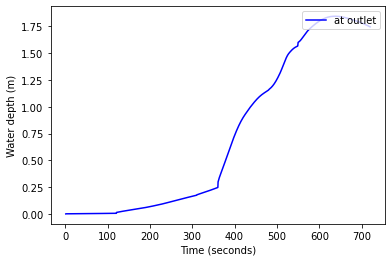

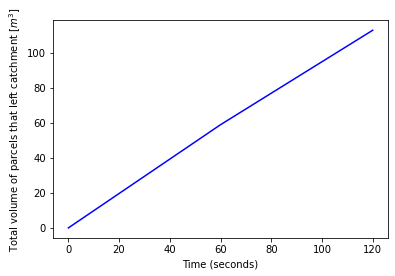

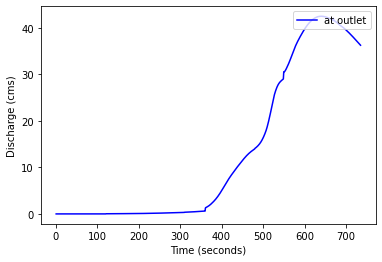

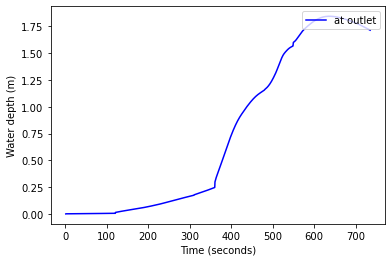

...

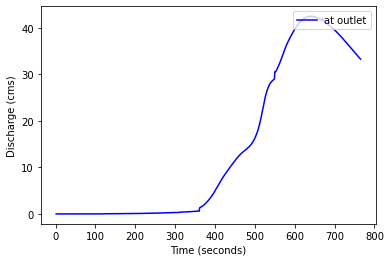

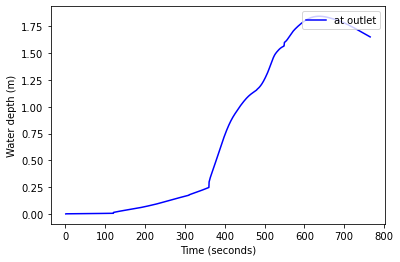

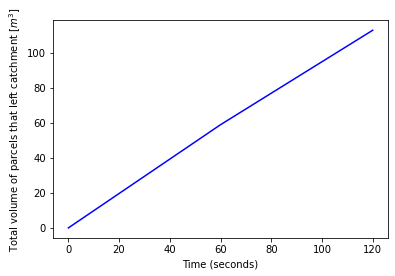

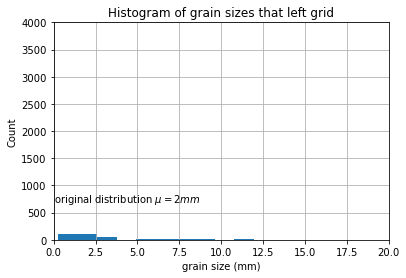

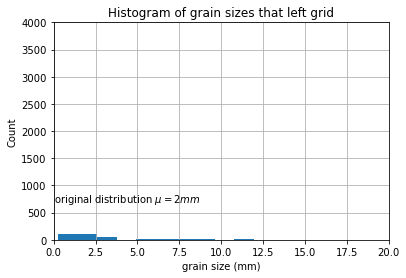

780.0


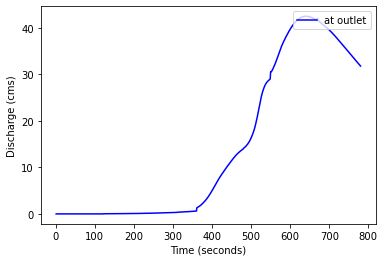

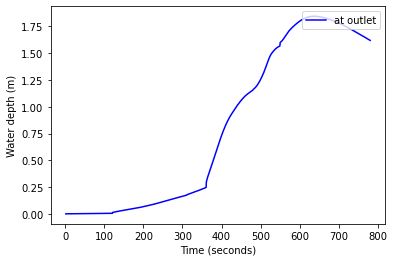

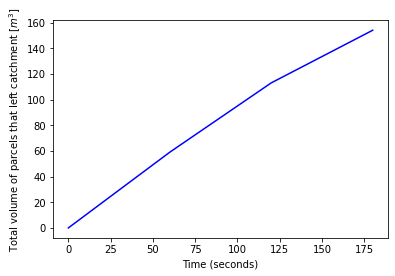

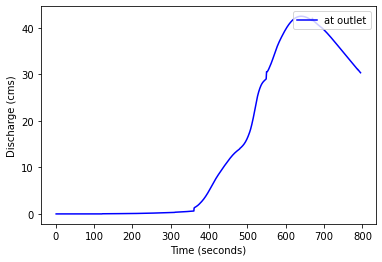

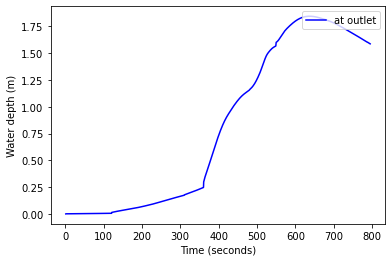

...

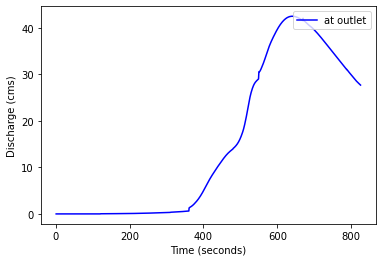

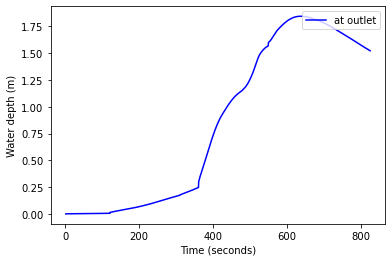

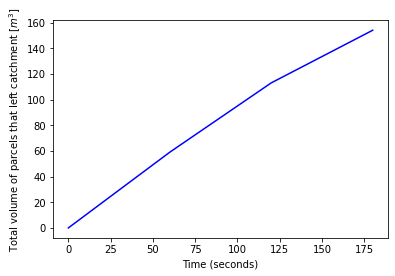

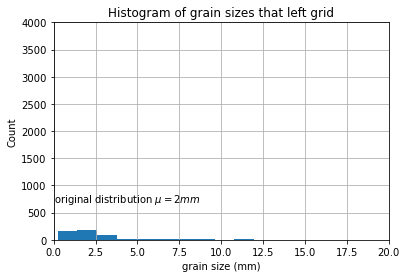

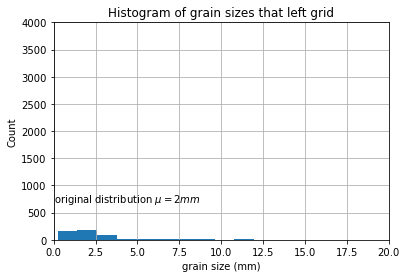

840.0


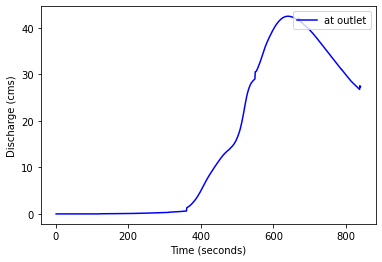

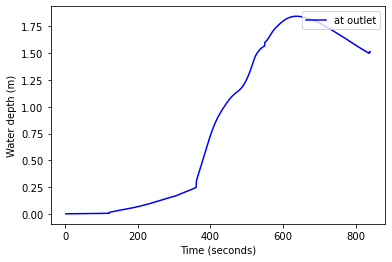

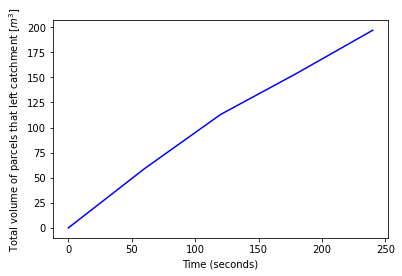

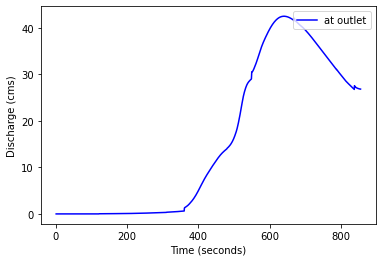

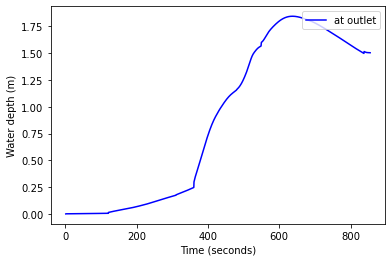

...

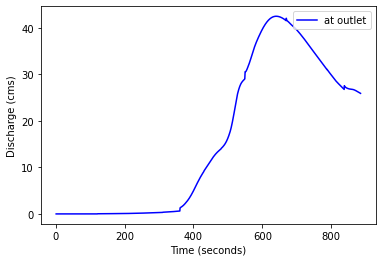

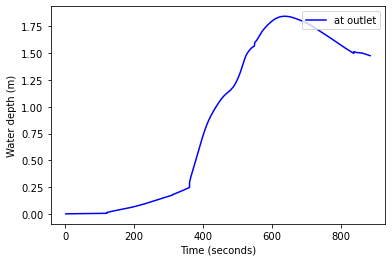

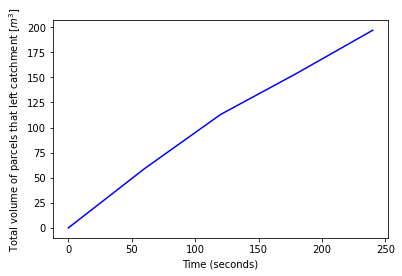

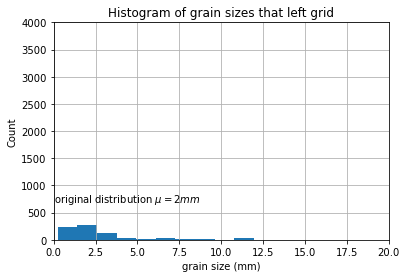

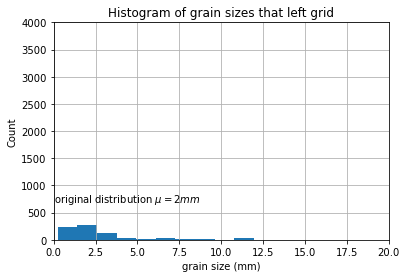

900.0


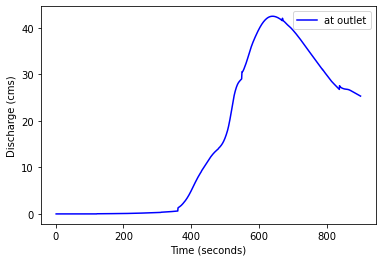

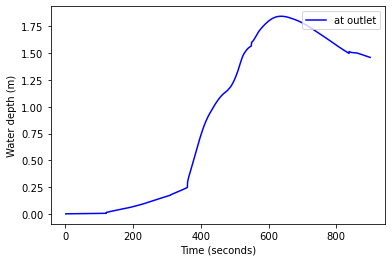

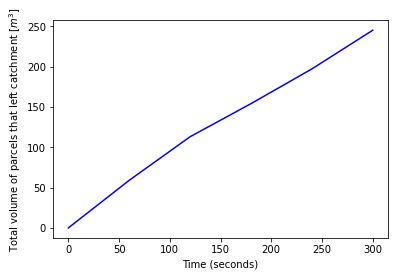

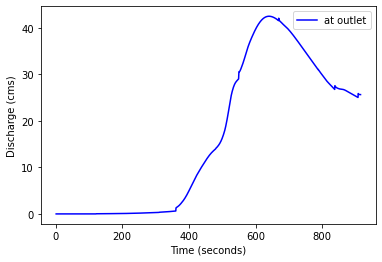

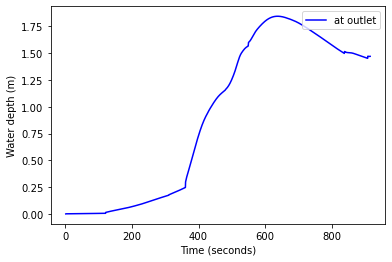

...

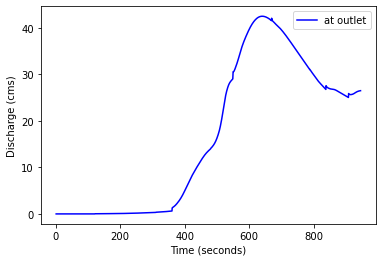

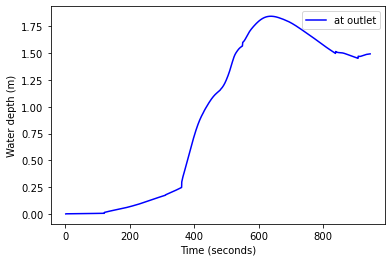

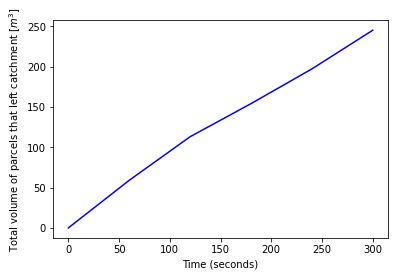

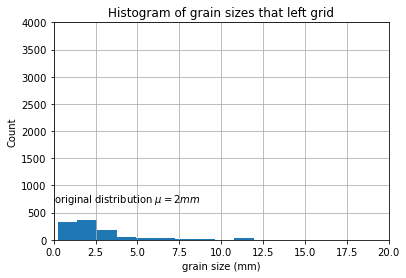

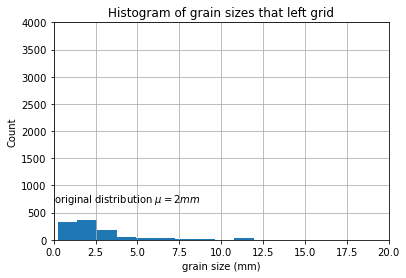

960.0


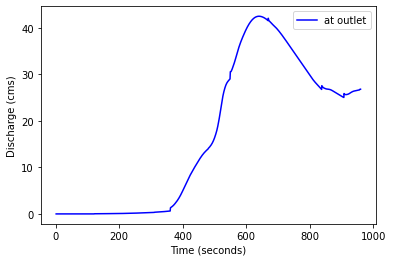

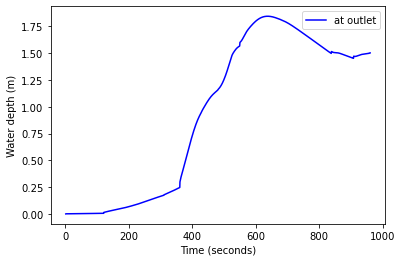

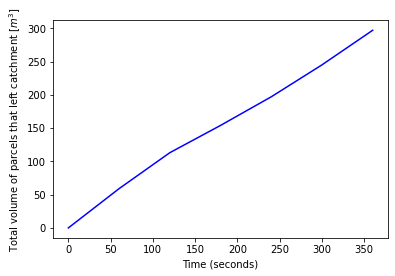

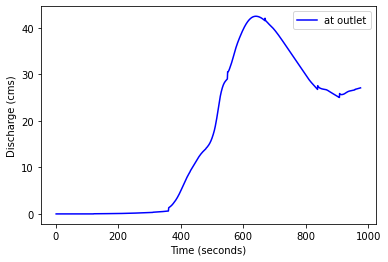

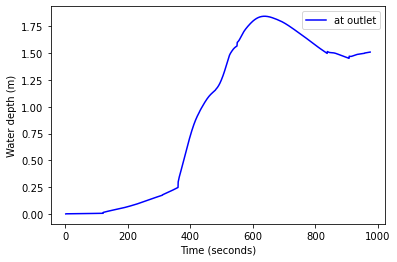

...

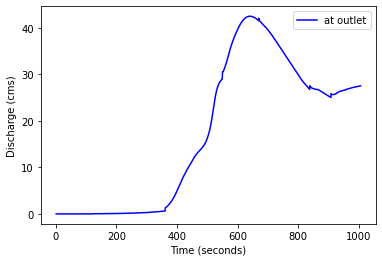

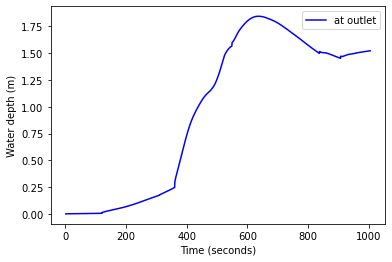

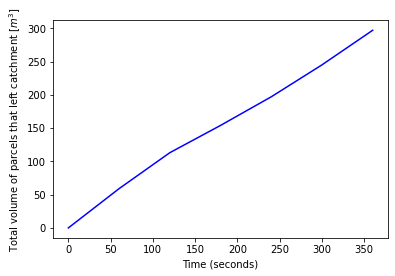

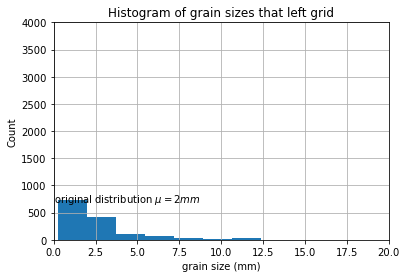

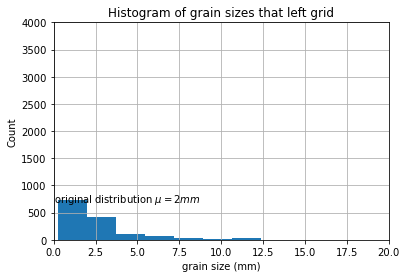

1020.0


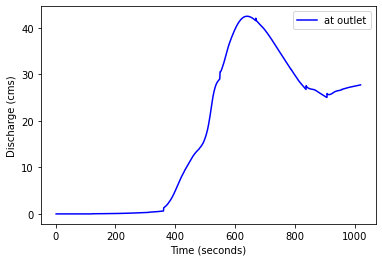

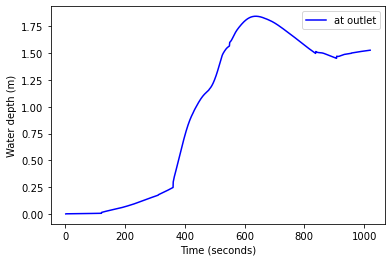

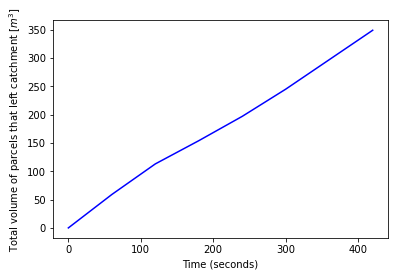

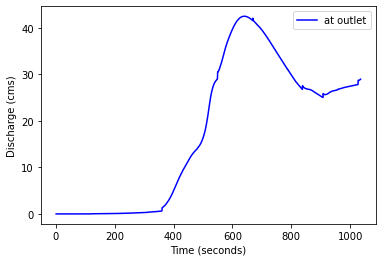

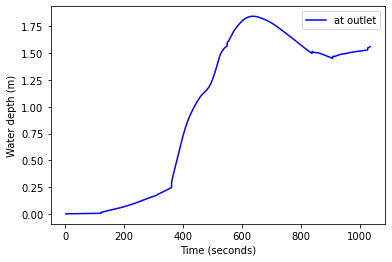

...

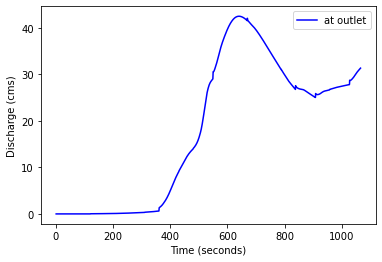

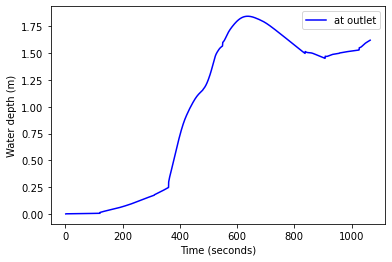

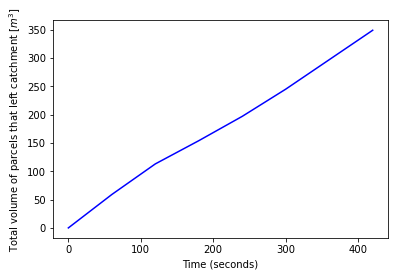

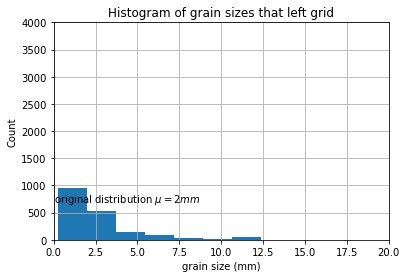

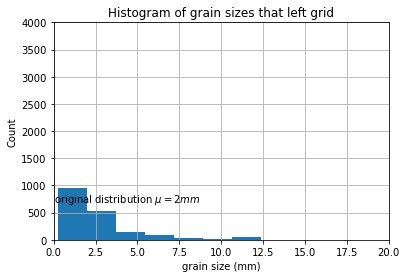

1080.0


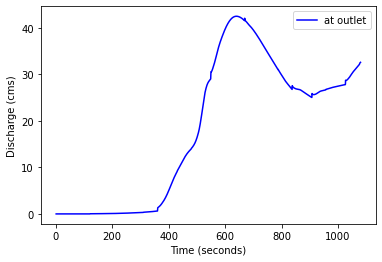

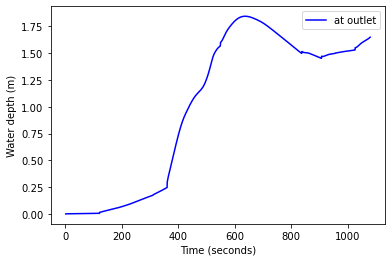

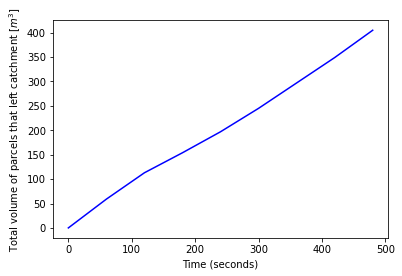

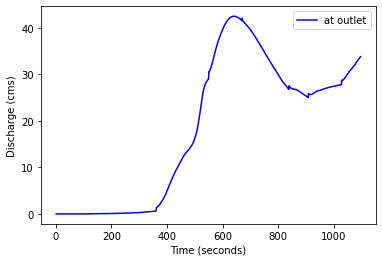

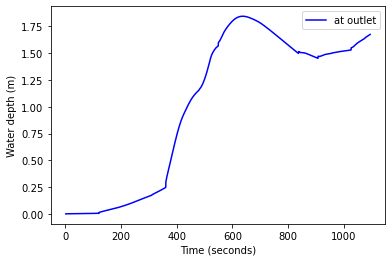

...

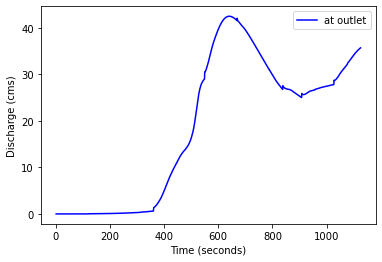

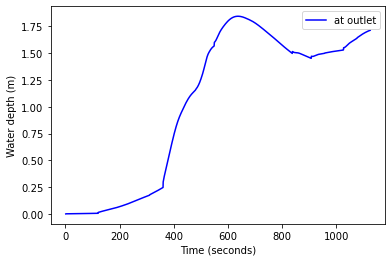

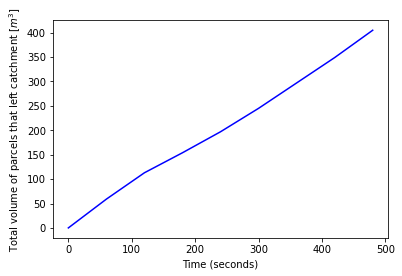

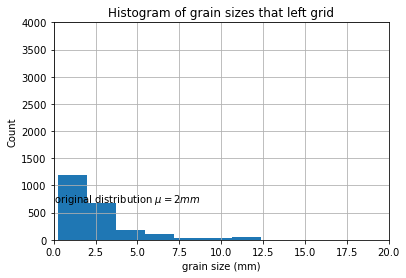

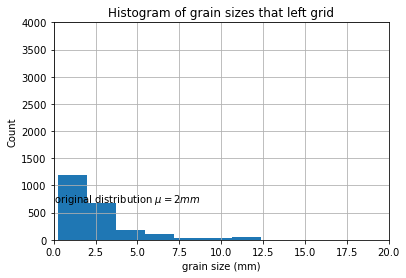

1140.0


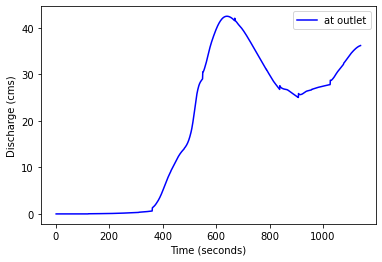

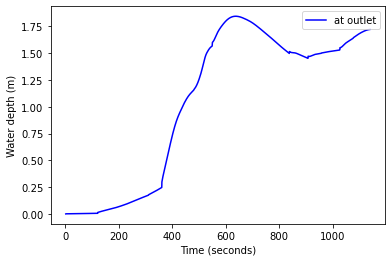

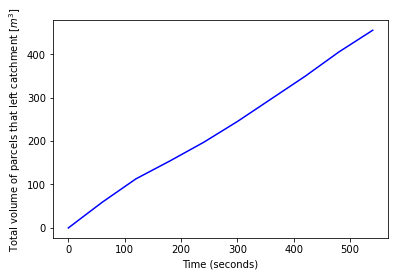

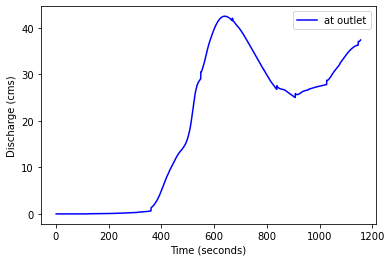

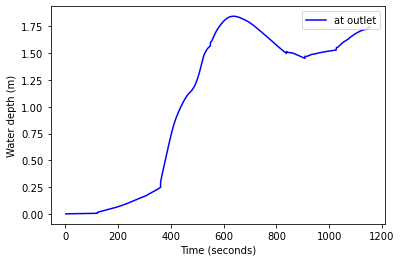

...

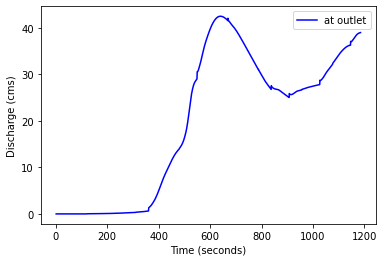

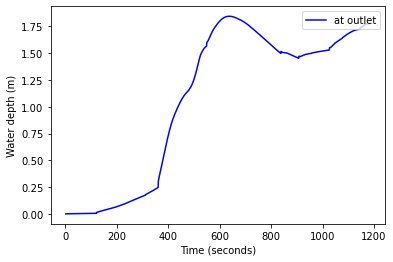

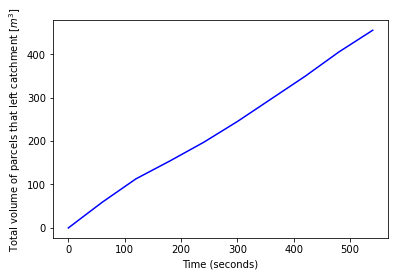

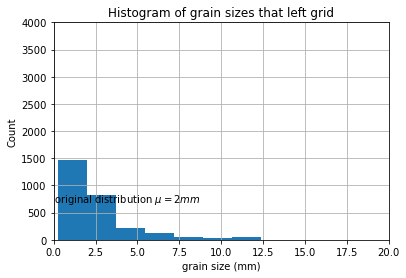

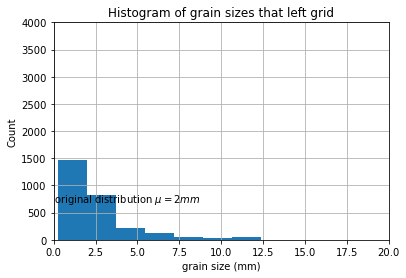

1200.0


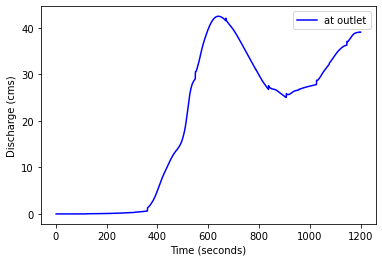

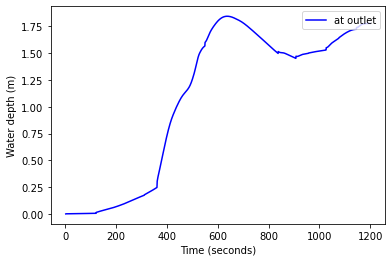

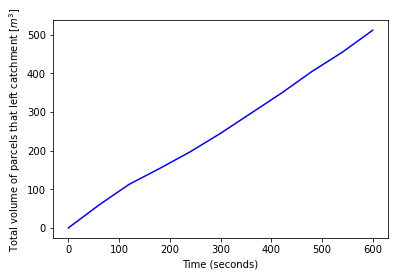

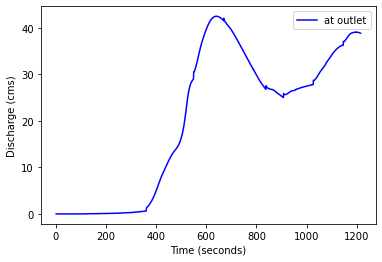

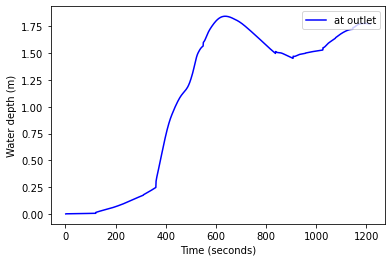

...

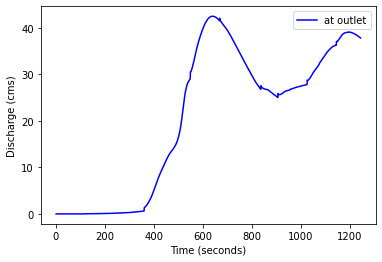

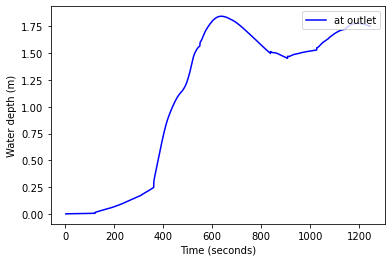

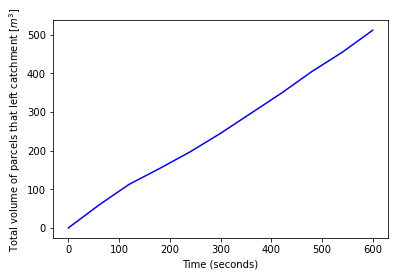

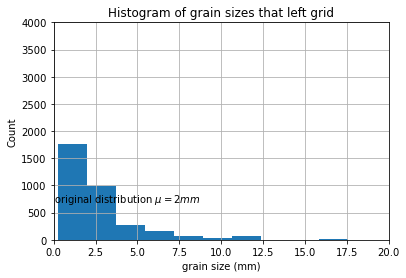

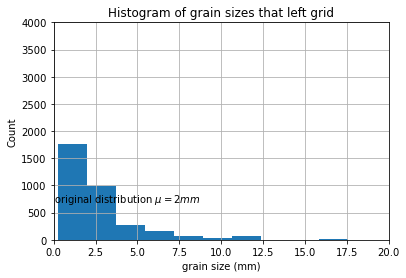

1260.0


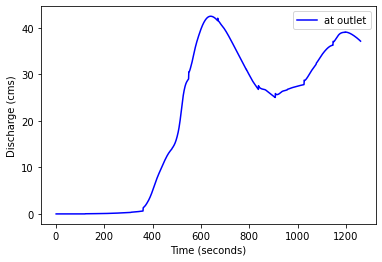

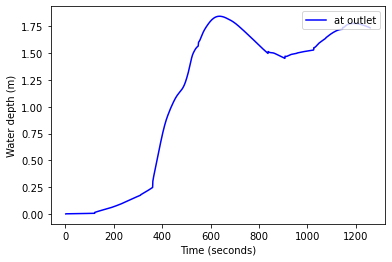

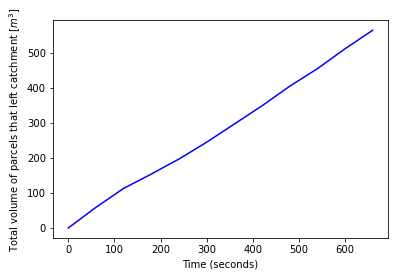

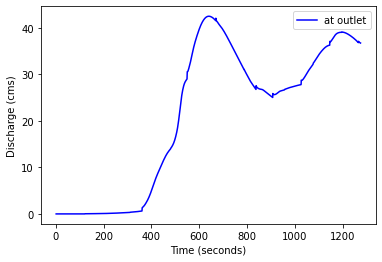

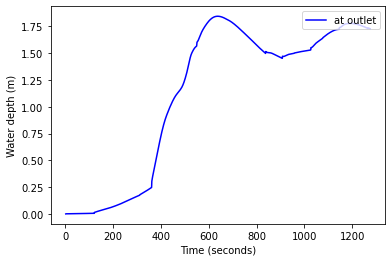

...

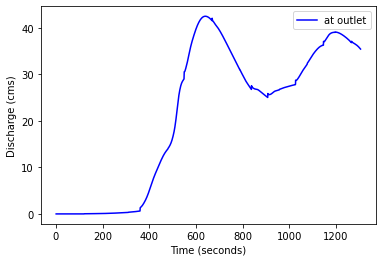

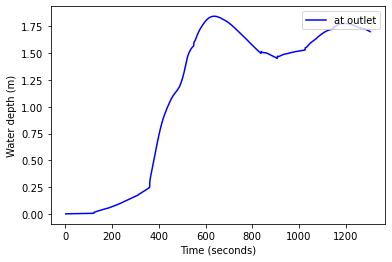

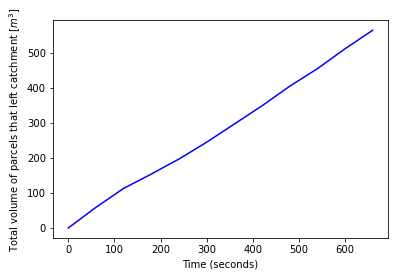

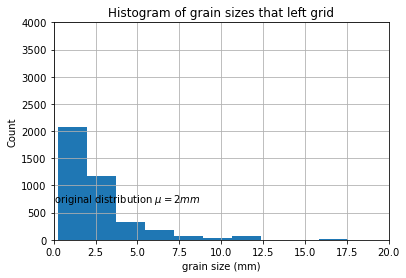

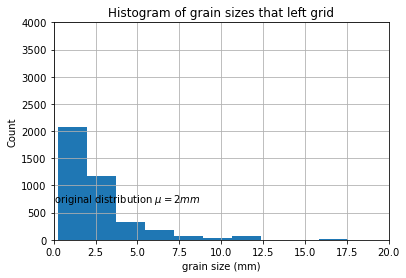

1320.0


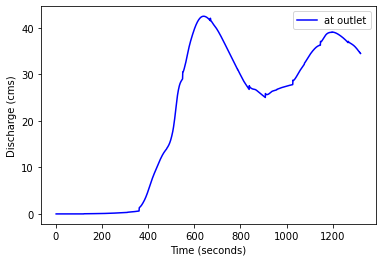

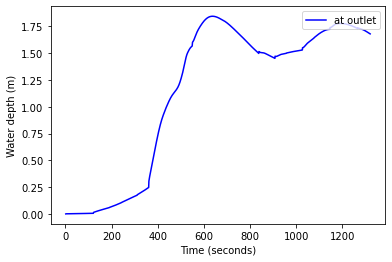

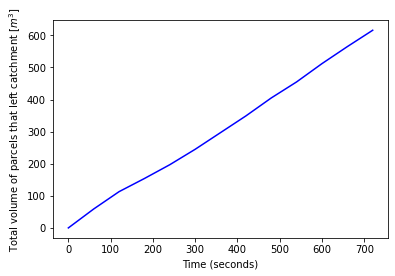

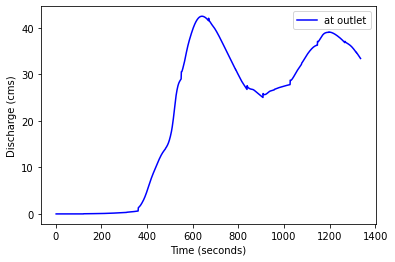

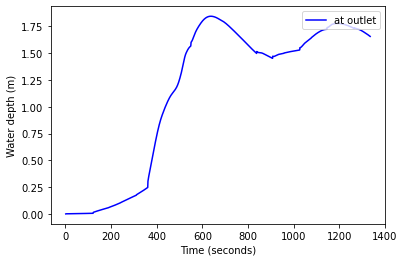

...

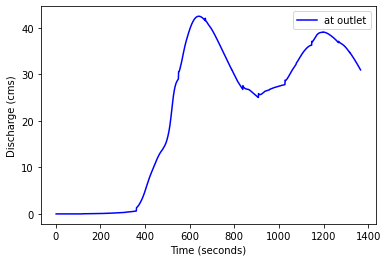

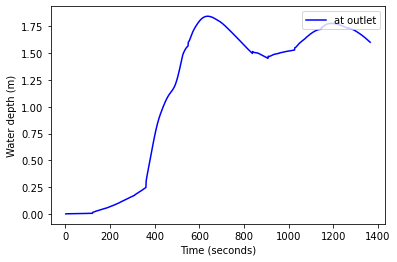

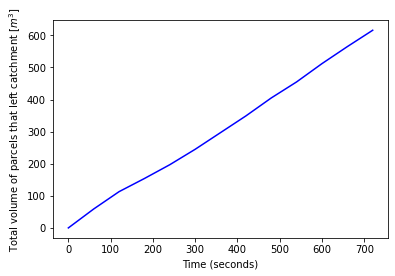

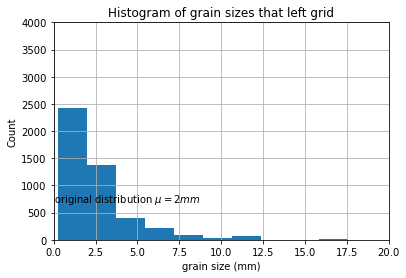

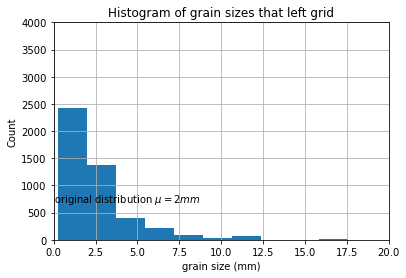

1380.0


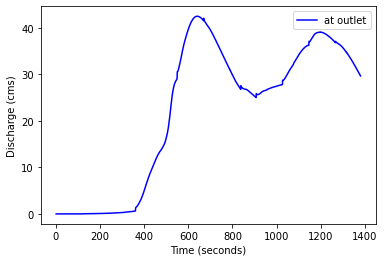

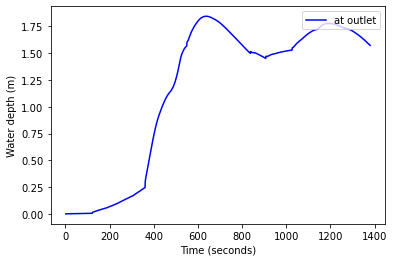

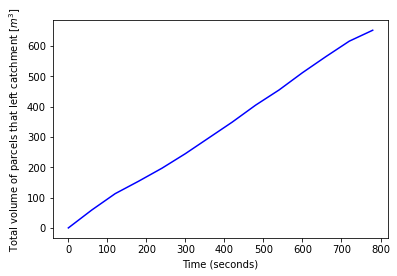

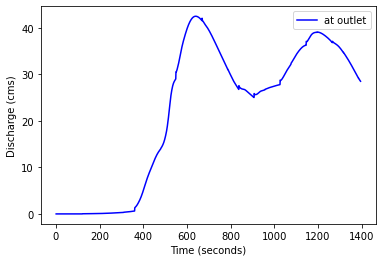

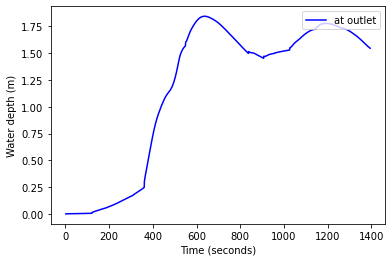

...

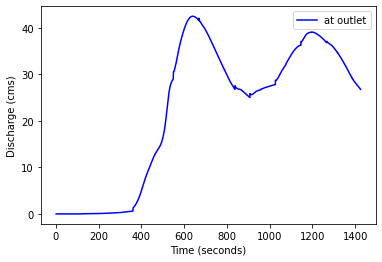

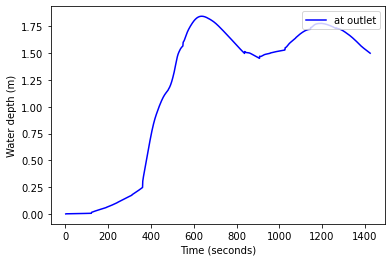

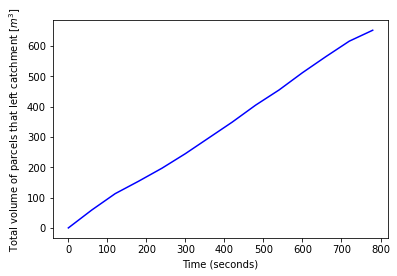

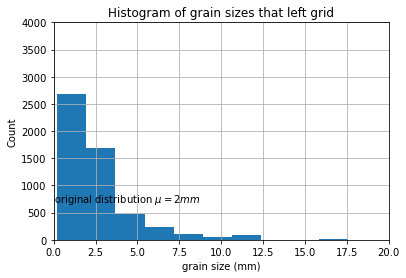

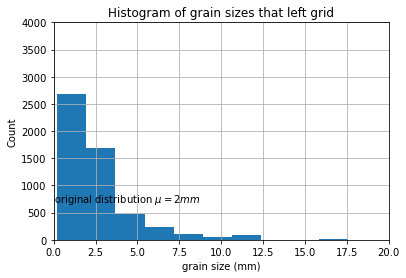

1440.0


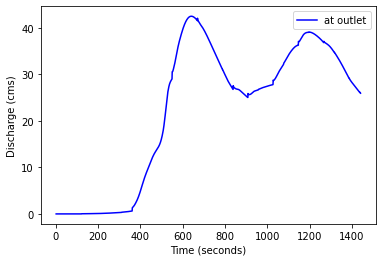

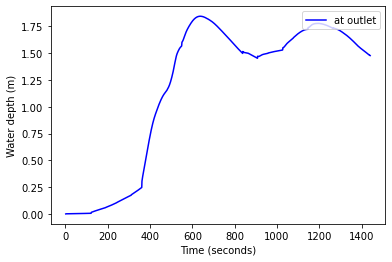

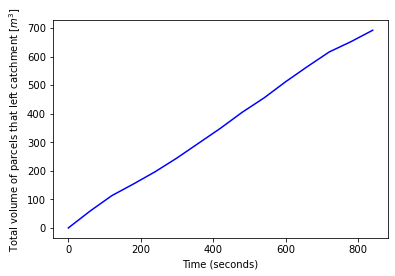

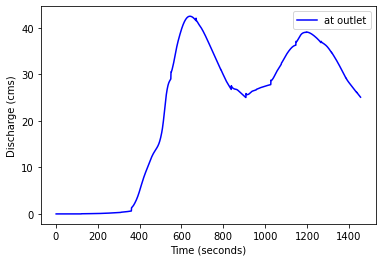

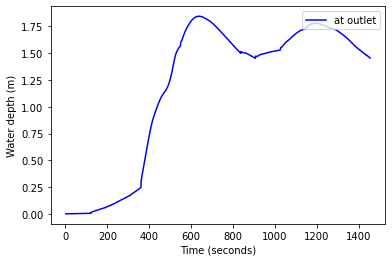

...

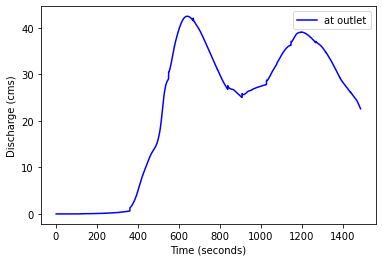

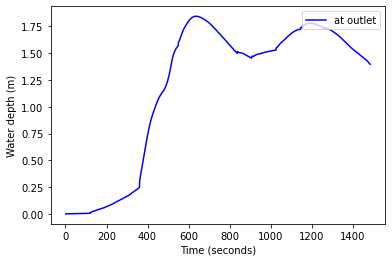

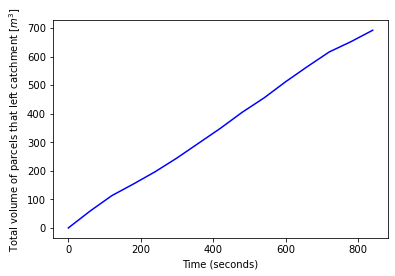

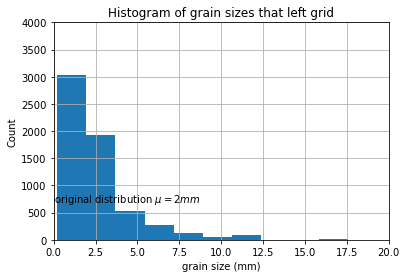

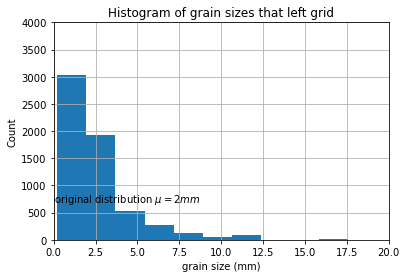

1500.0


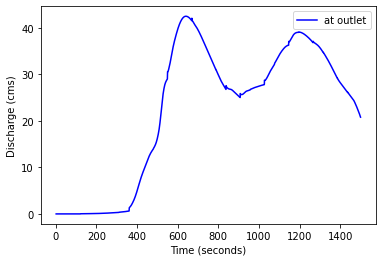

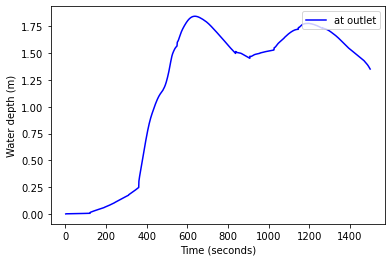

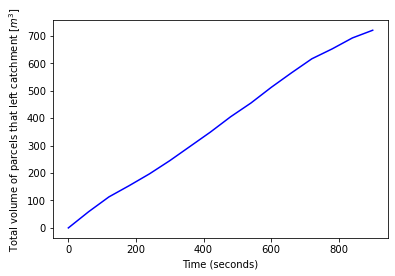

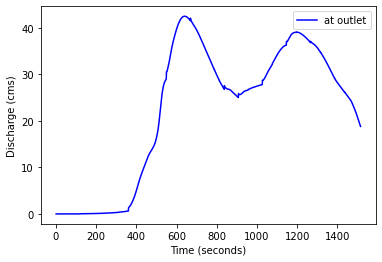

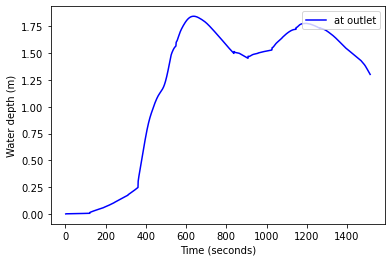

...

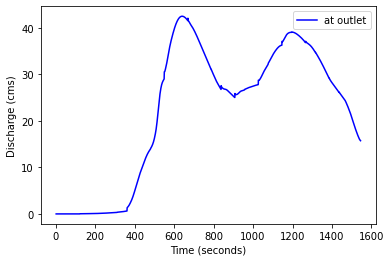

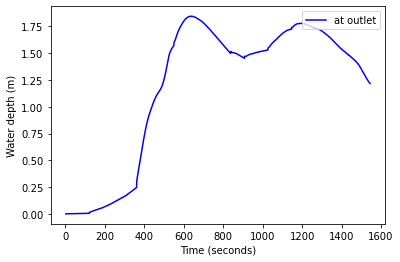

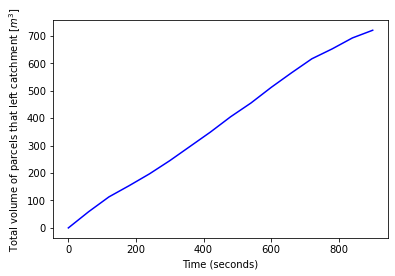

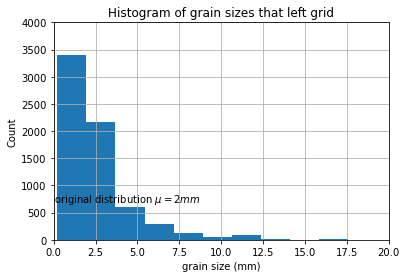

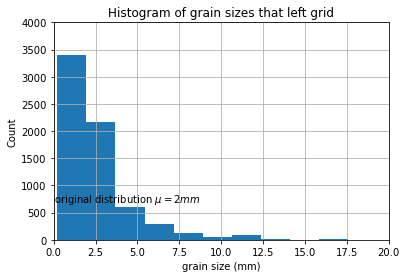

1560.0


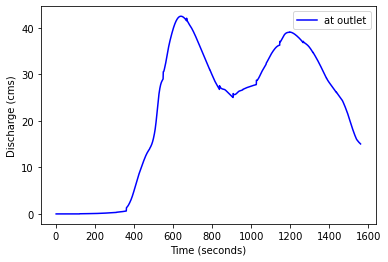

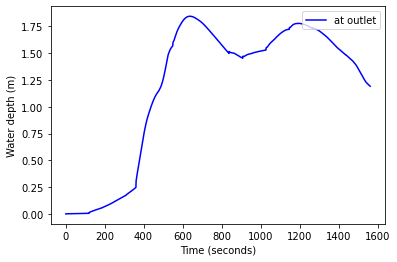

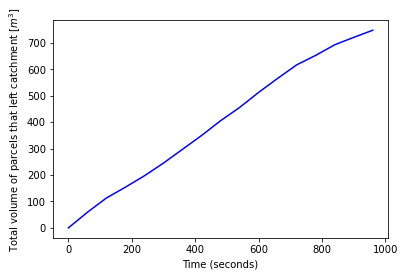

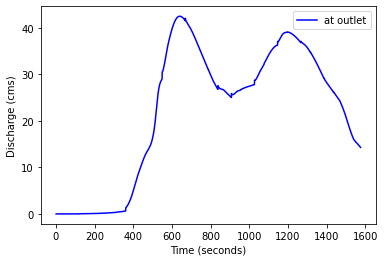

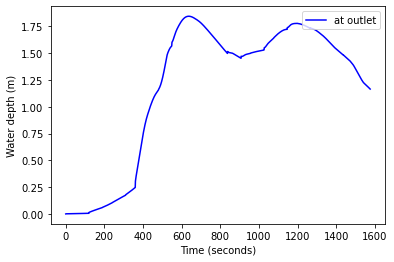

...

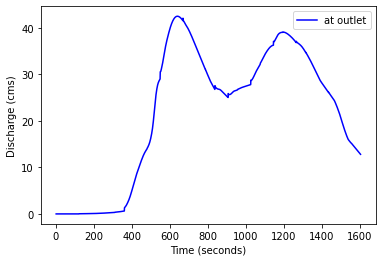

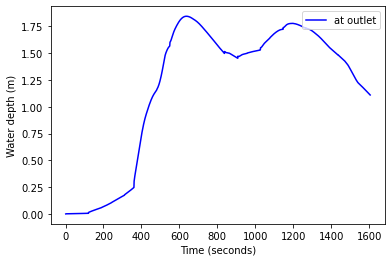

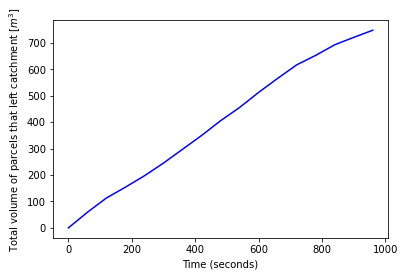

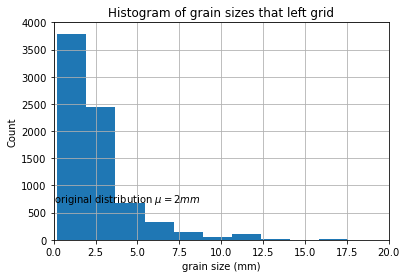

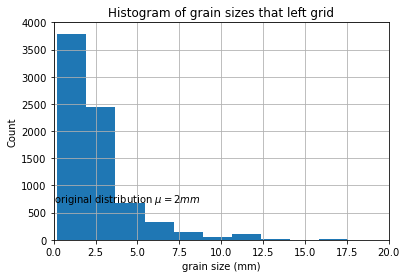

1620.0


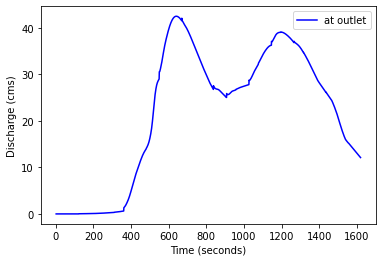

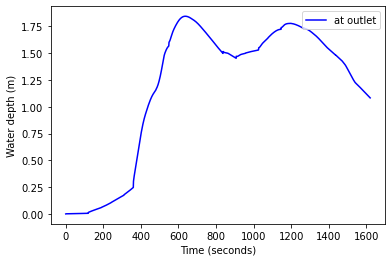

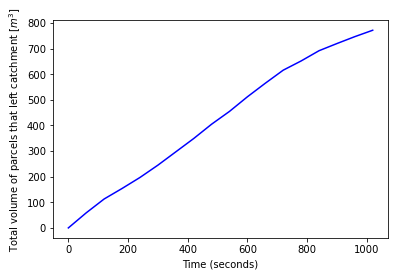

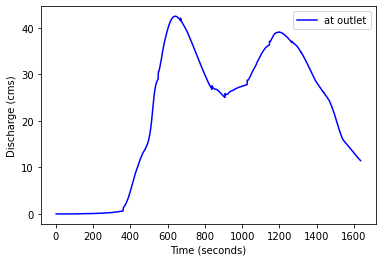

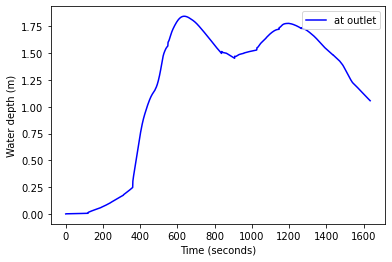

...

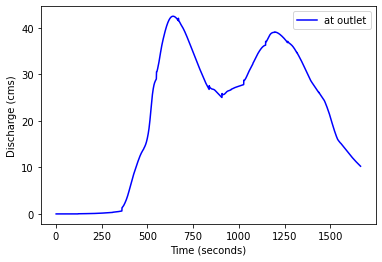

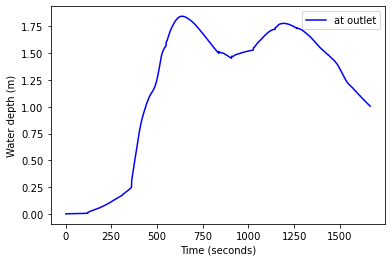

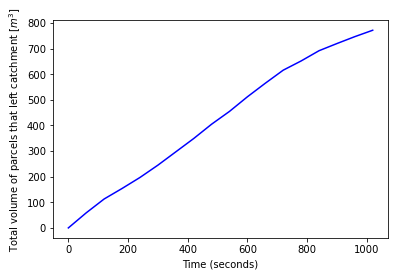

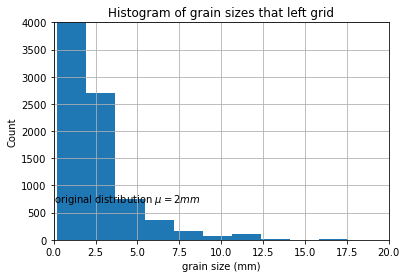

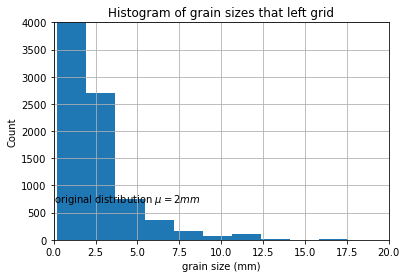

1680.0


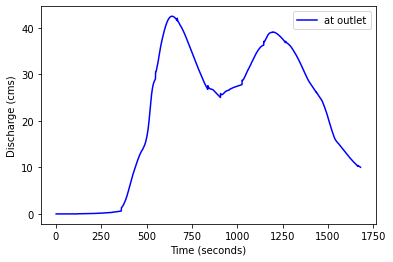

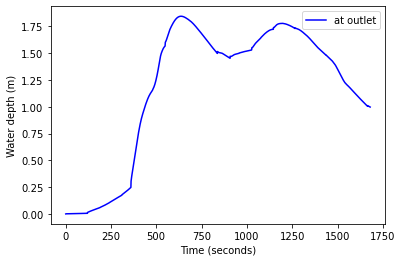

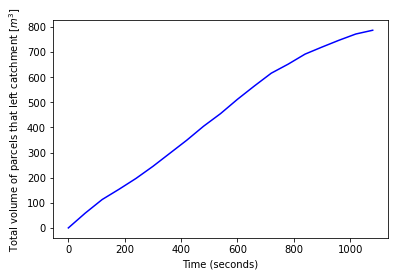

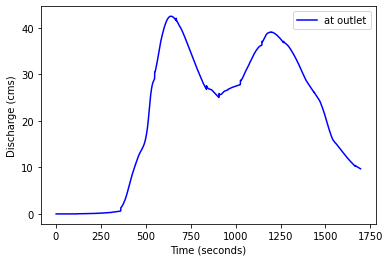

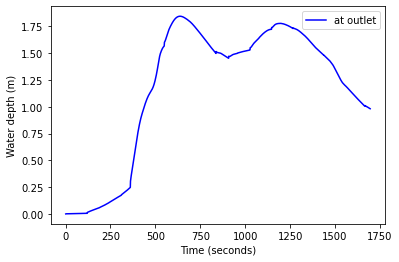

...

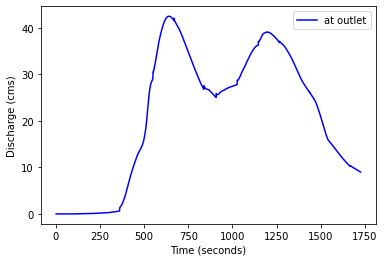

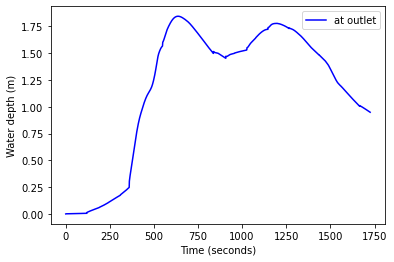

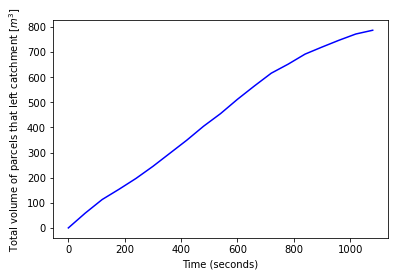

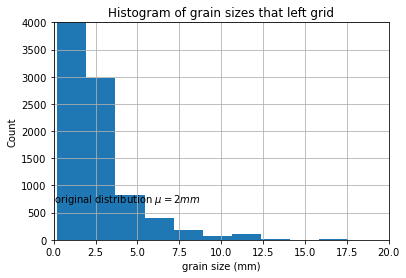

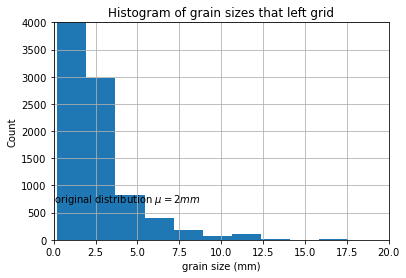

1740.0


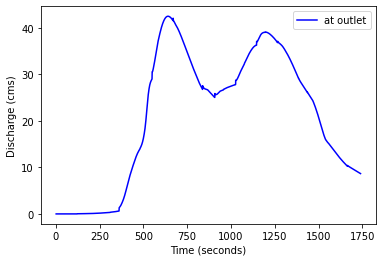

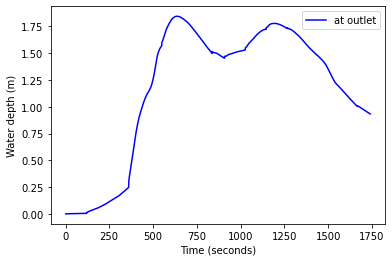

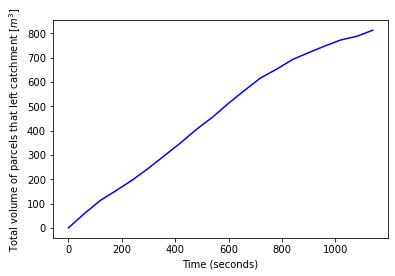

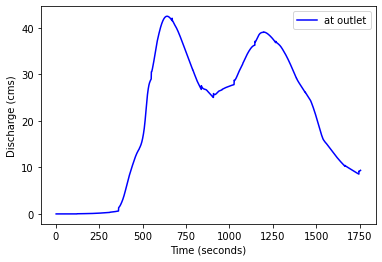

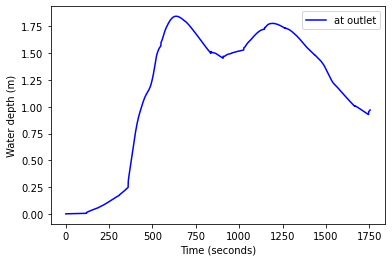

...

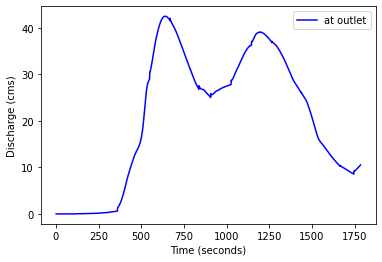

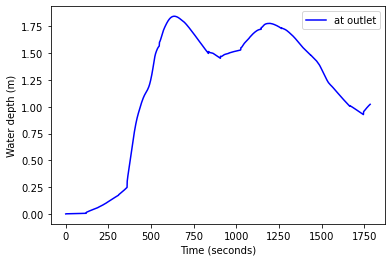

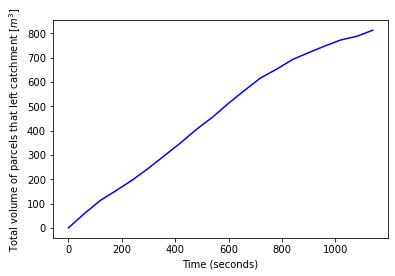

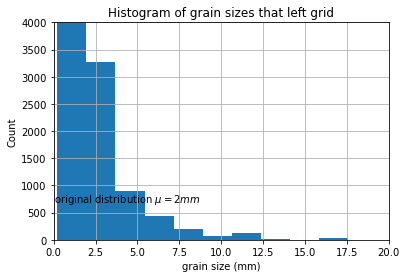

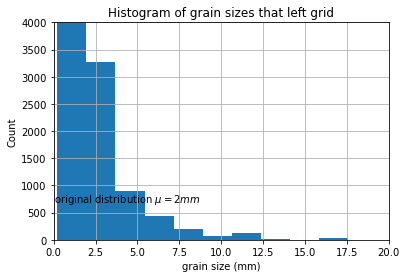

1800.0


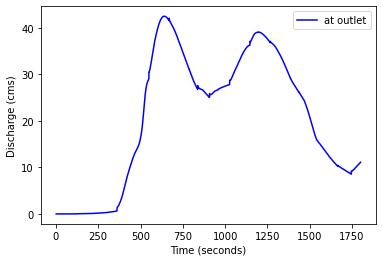

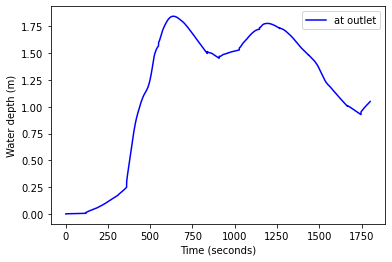

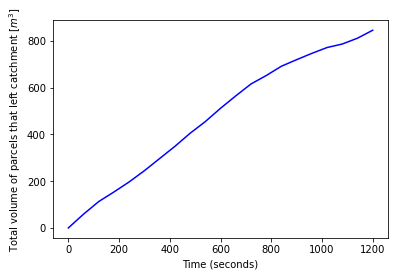

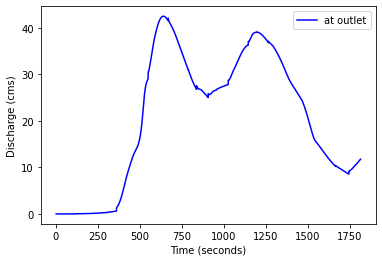

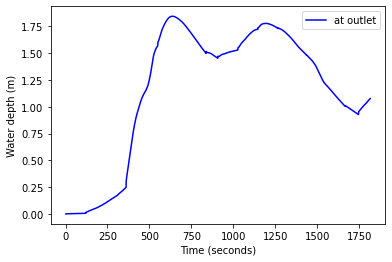

...

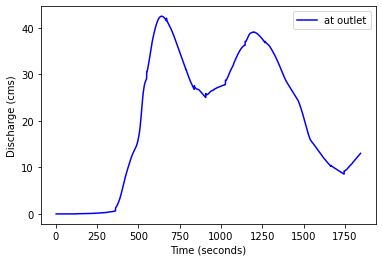

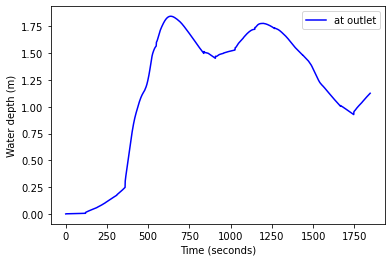

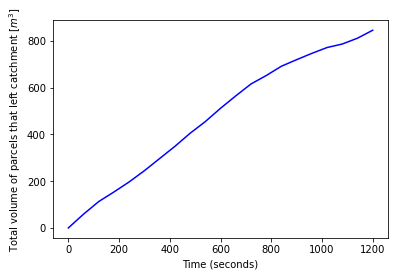

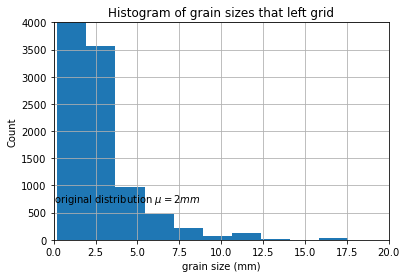

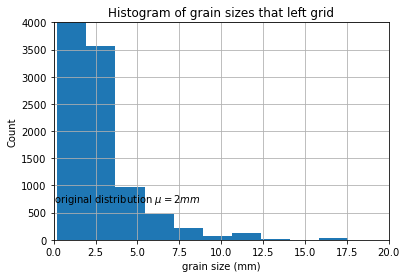

1860.0


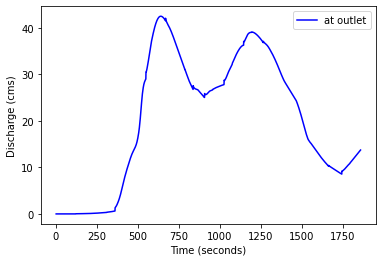

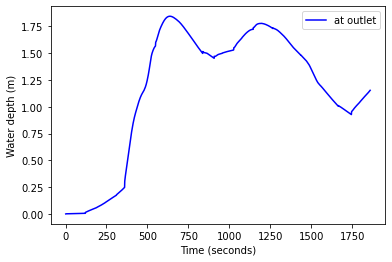

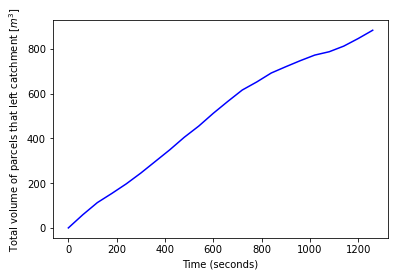

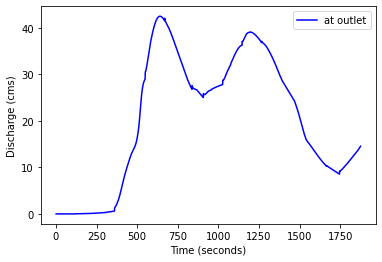

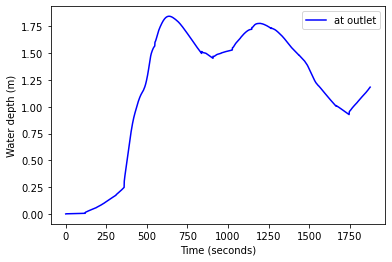

...

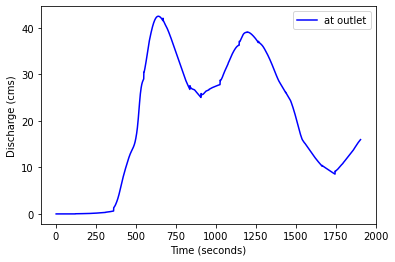

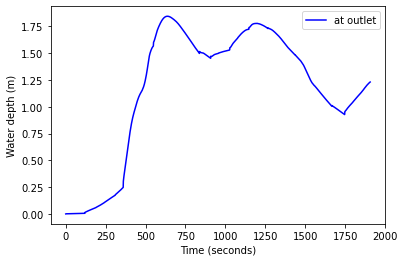

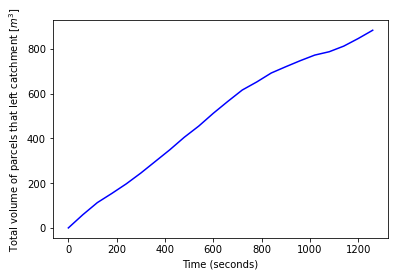

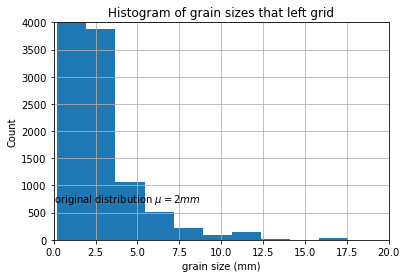

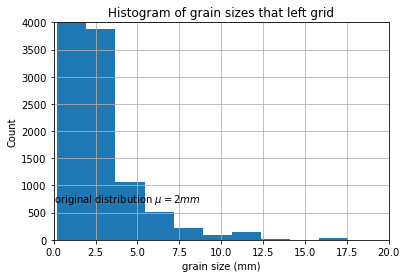

1920.0


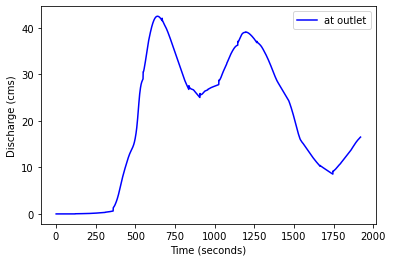

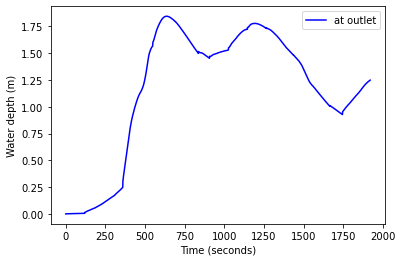

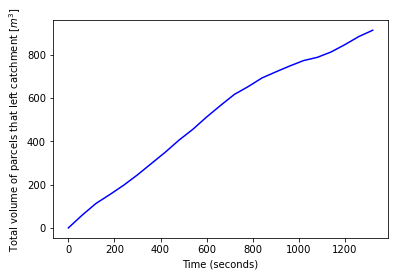

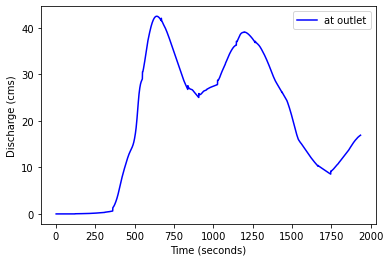

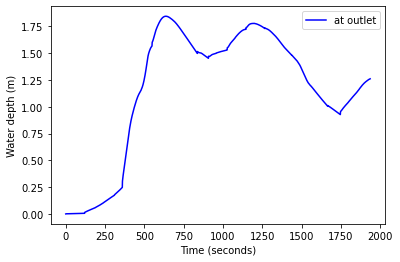

...

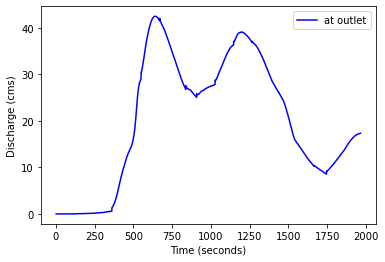

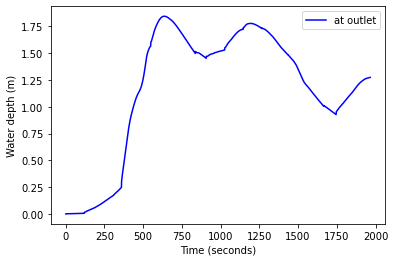

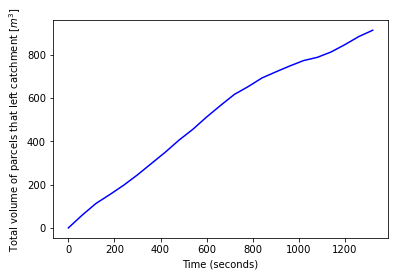

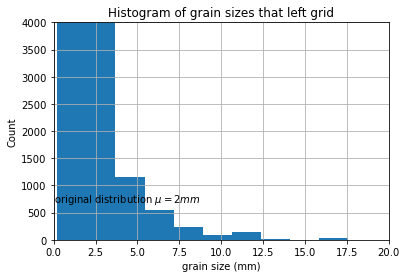

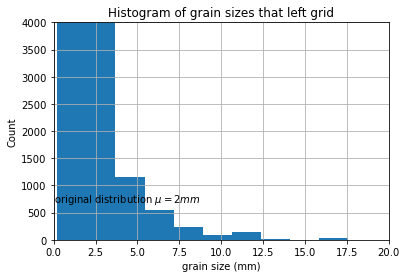

1980.0


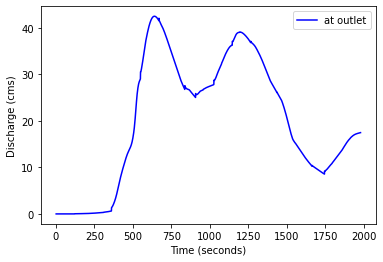

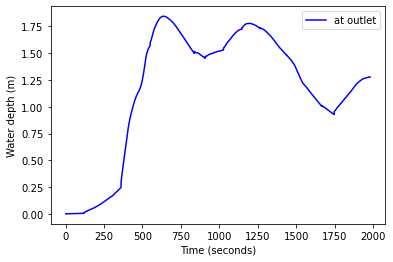

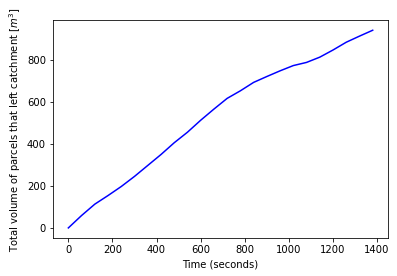

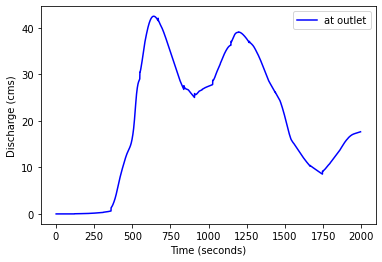

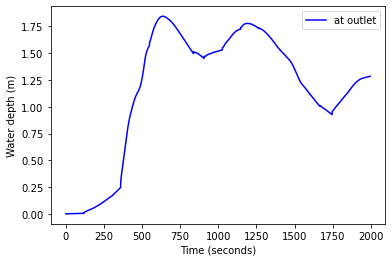

...

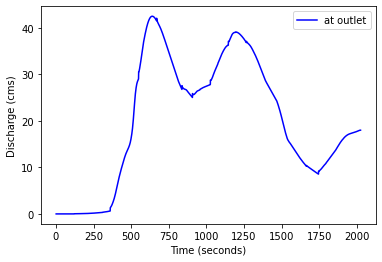

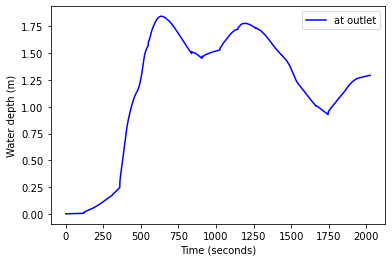

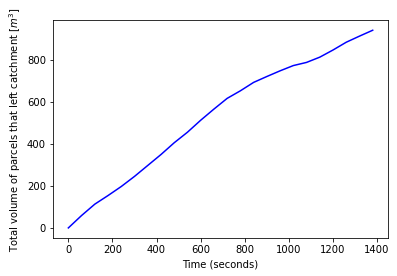

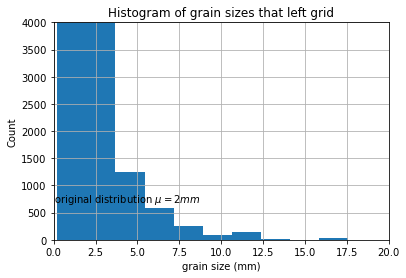

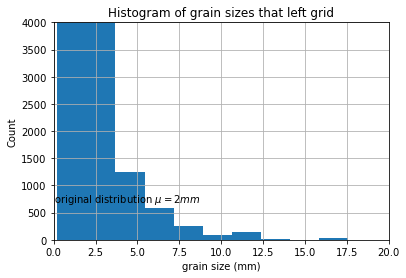

2040.0


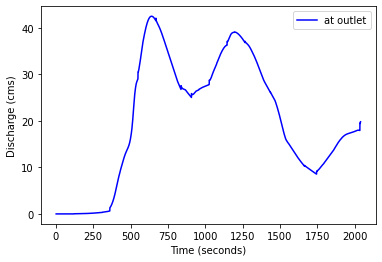

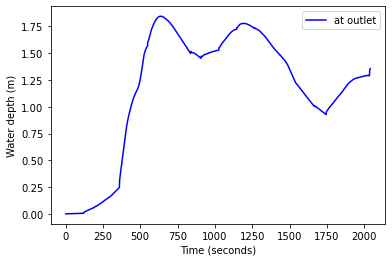

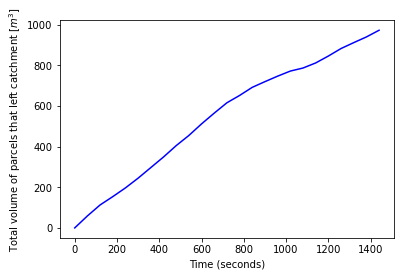

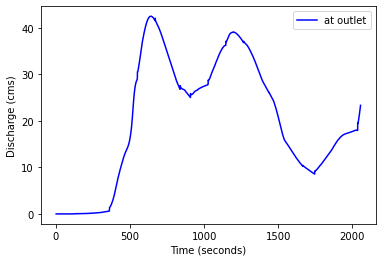

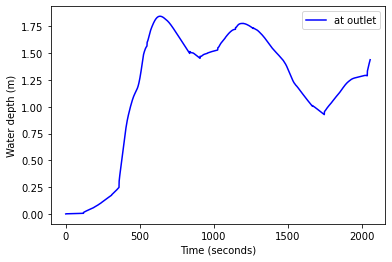

...

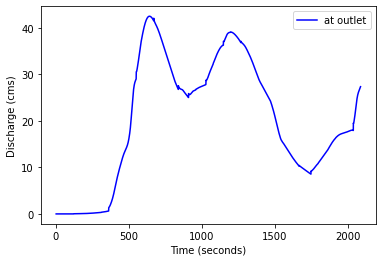

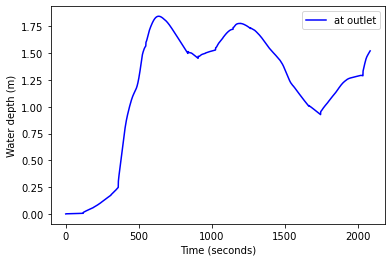

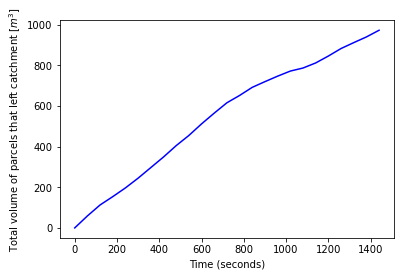

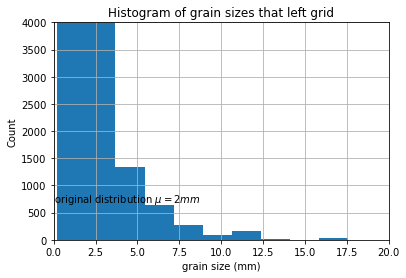

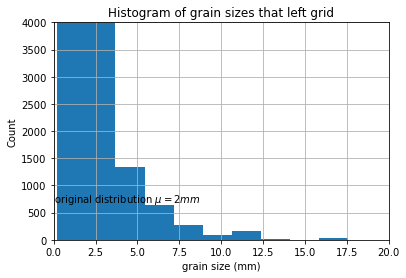

2100.0


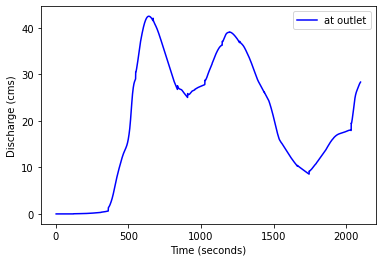

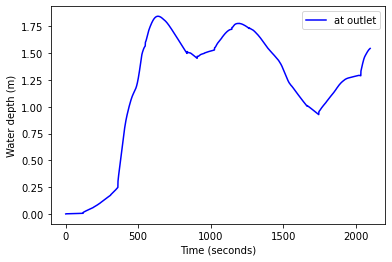

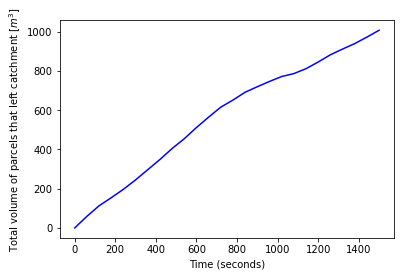

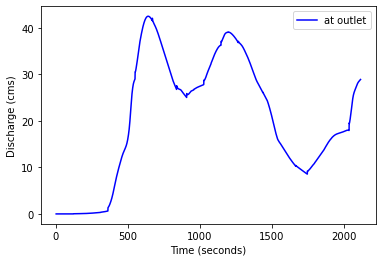

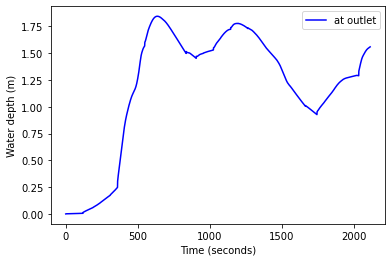

...

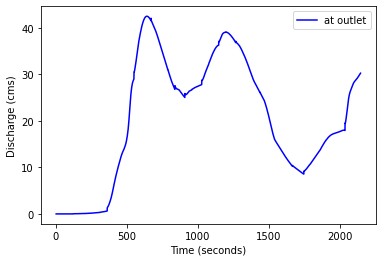

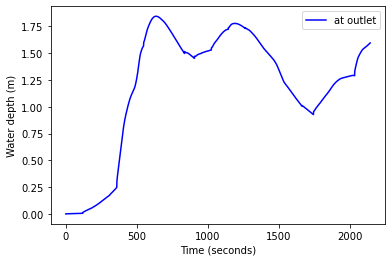

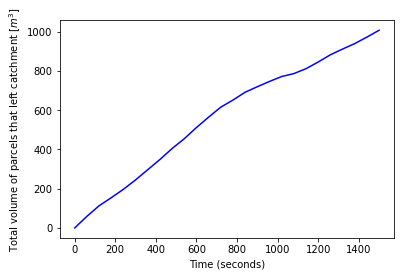

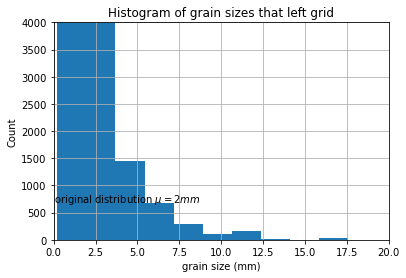

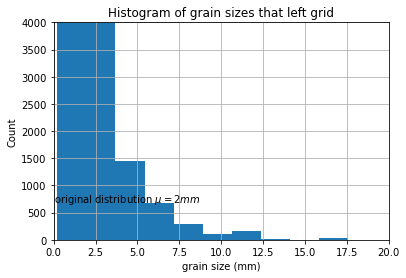

2160.0


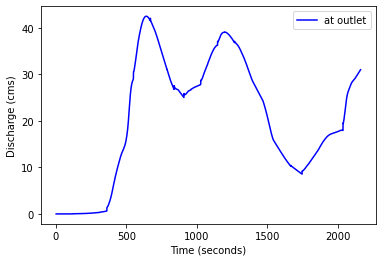

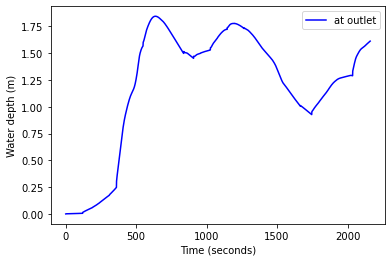

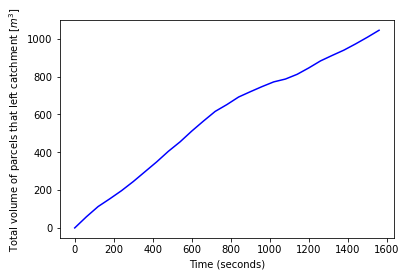

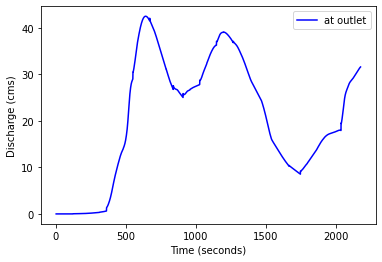

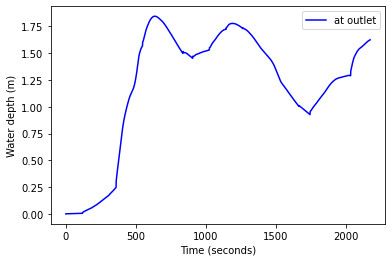

...

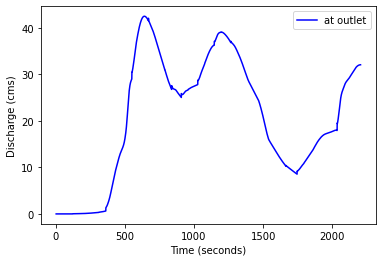

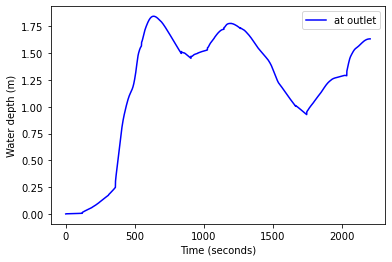

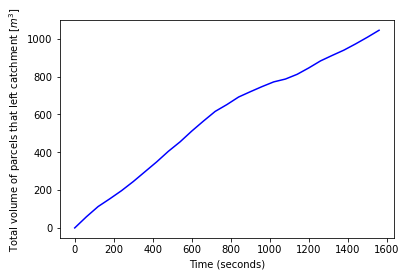

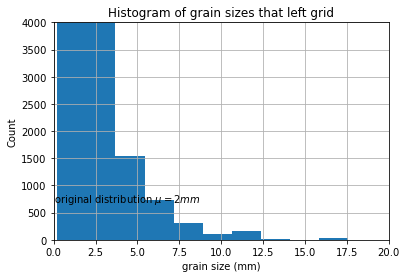

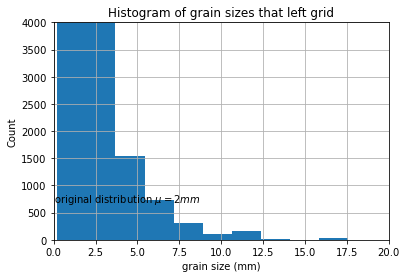

2220.0


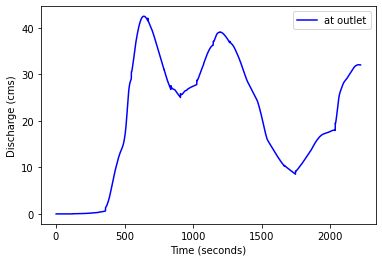

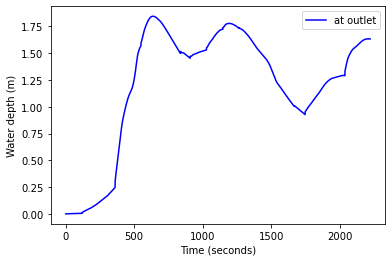

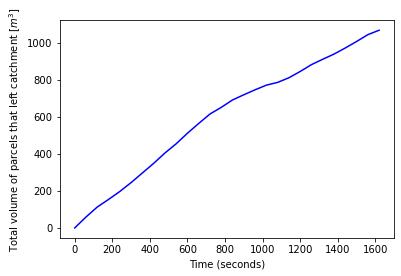

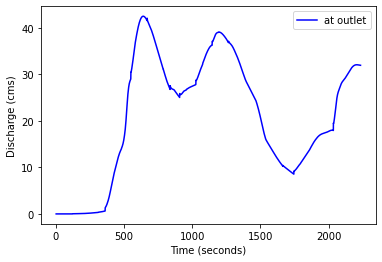

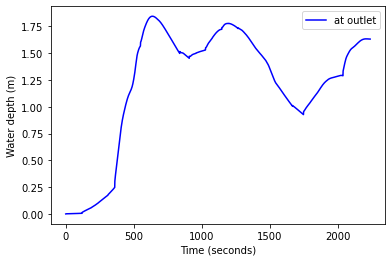

...

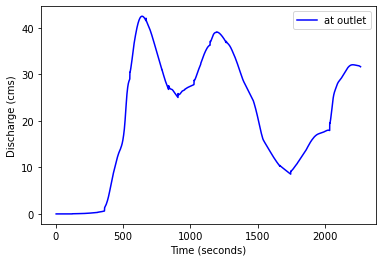

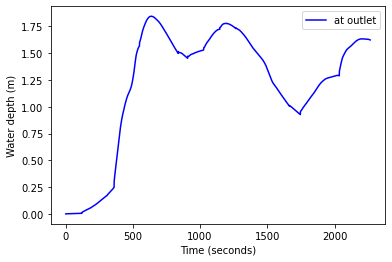

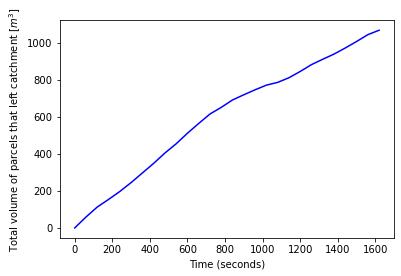

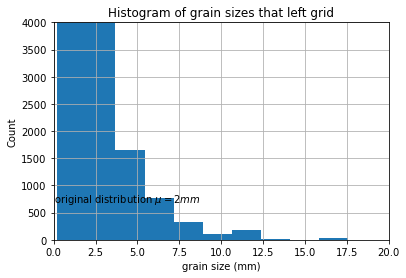

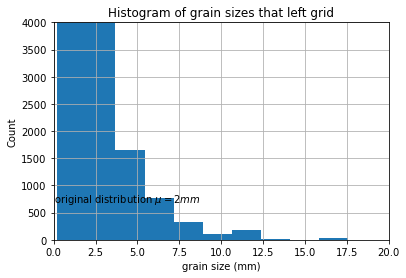

2280.0


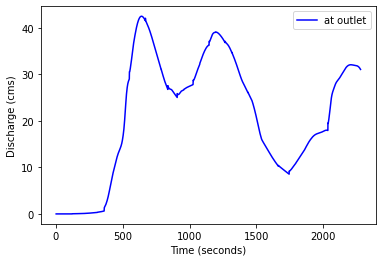

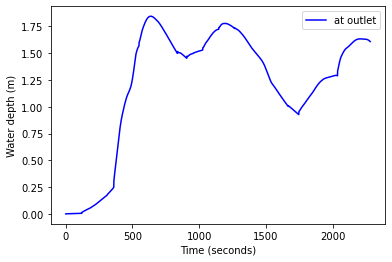

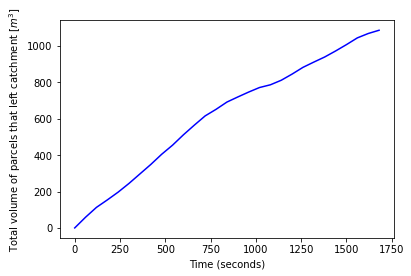

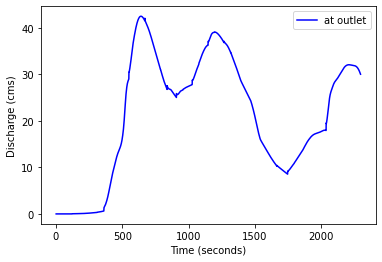

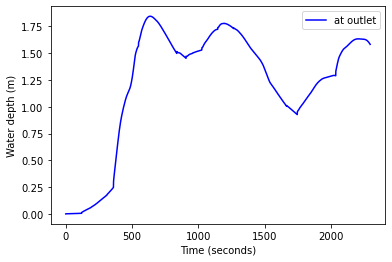

...

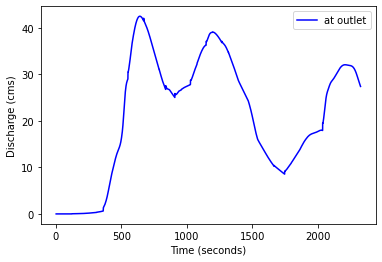

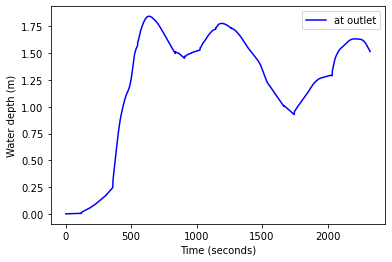

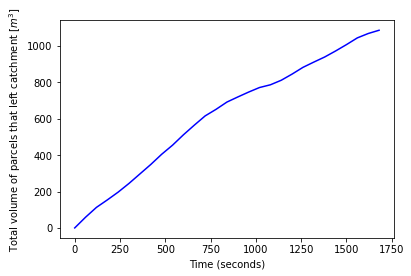

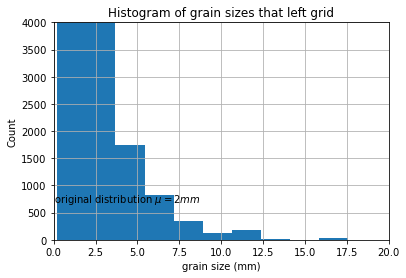

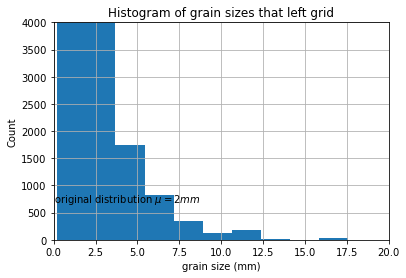

2340.0


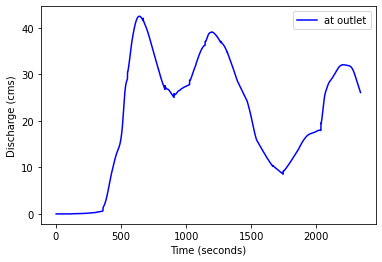

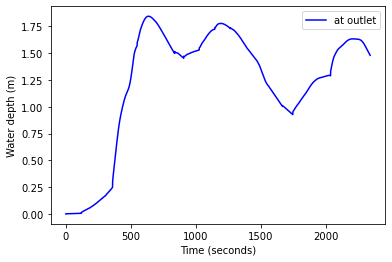

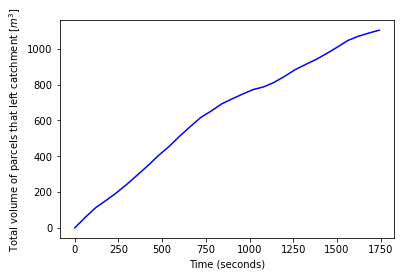

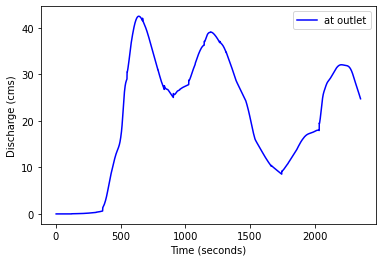

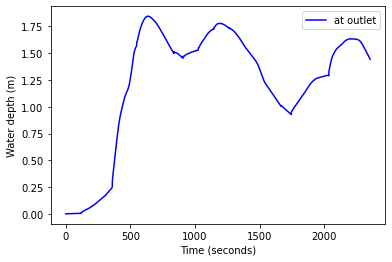

...

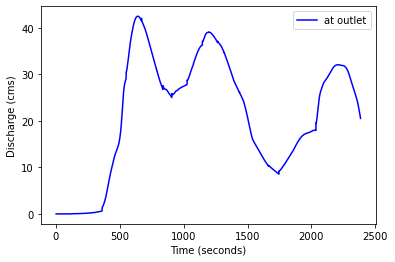

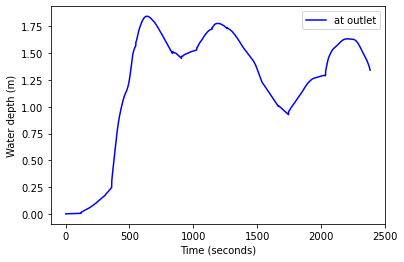

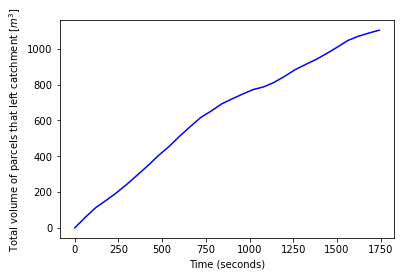

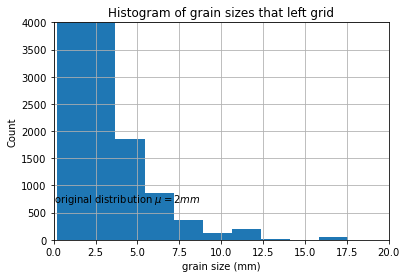

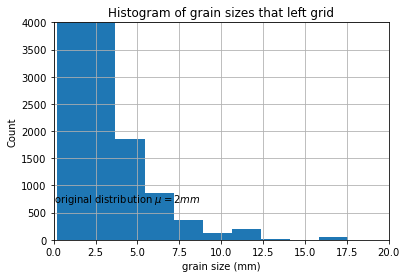

2400.0


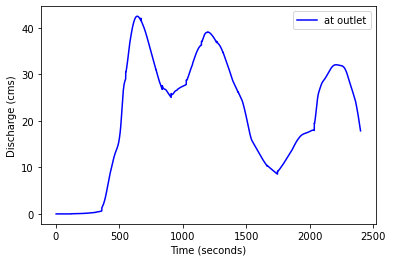

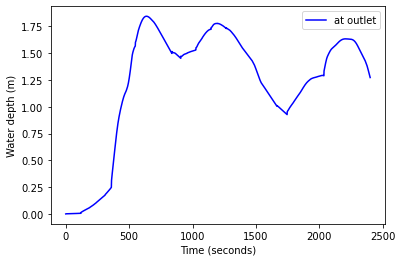

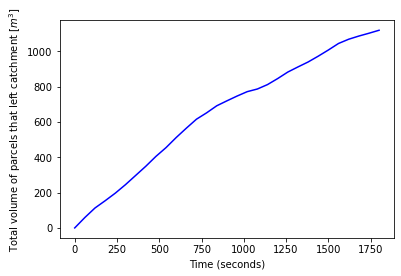

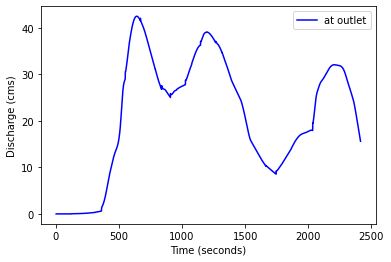

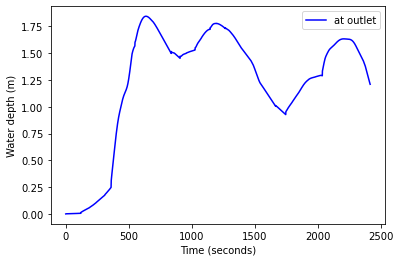

...

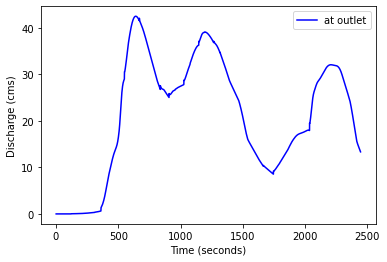

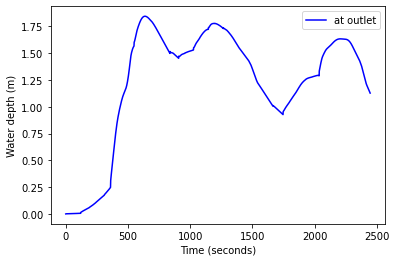

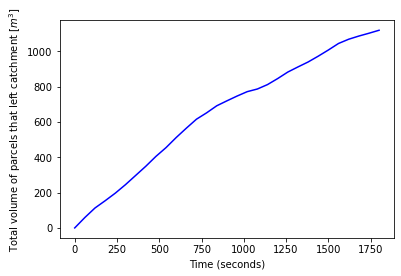

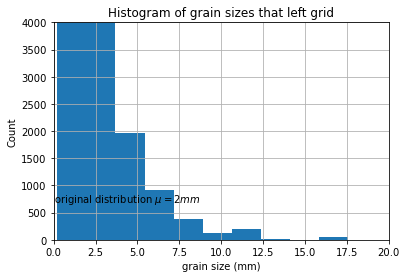

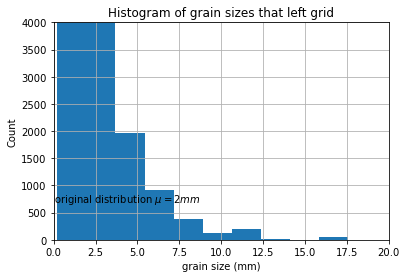

2460.0


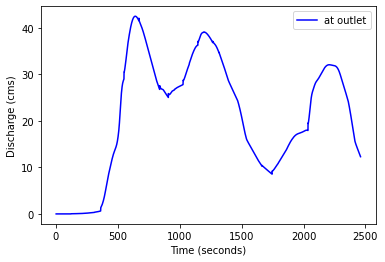

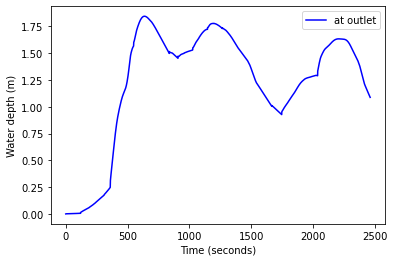

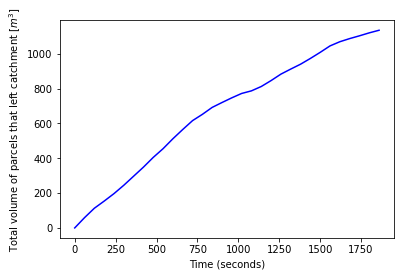

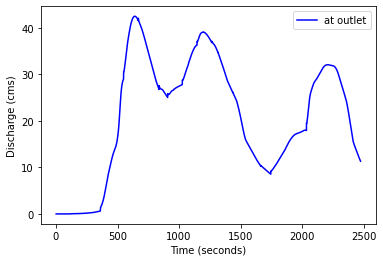

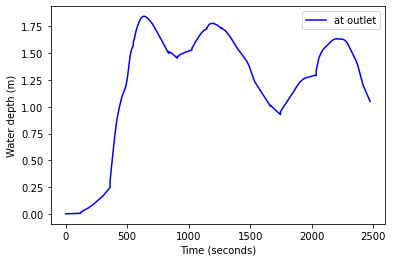

...

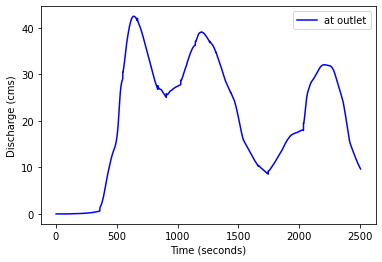

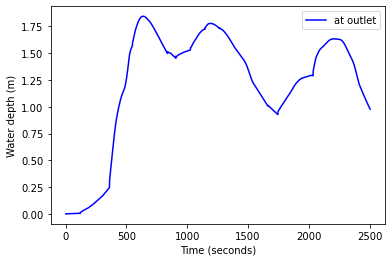

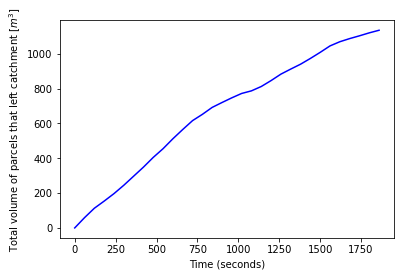

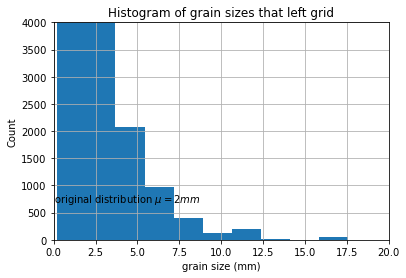

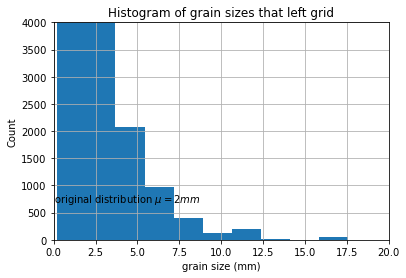

2520.0


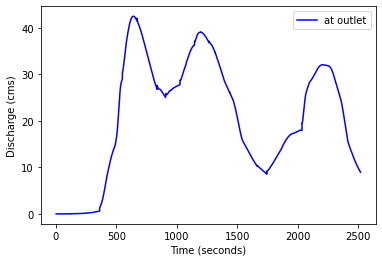

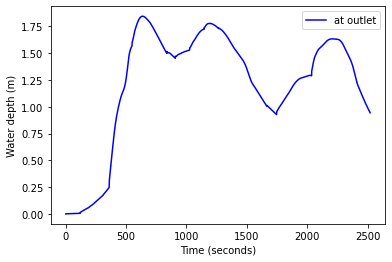

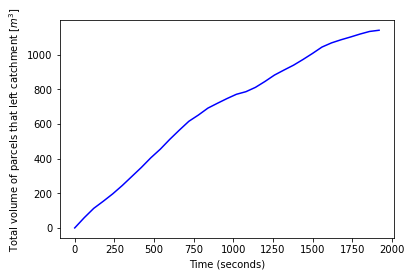

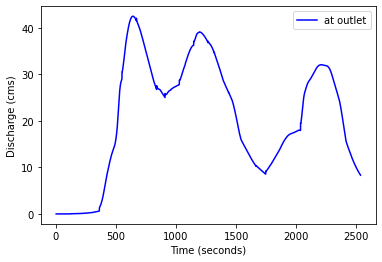

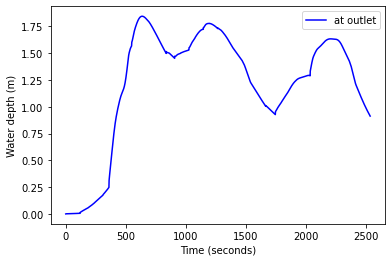

...

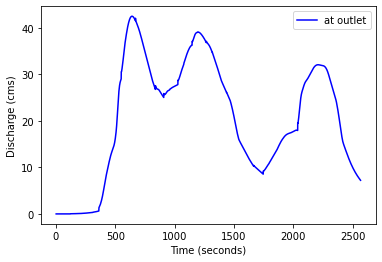

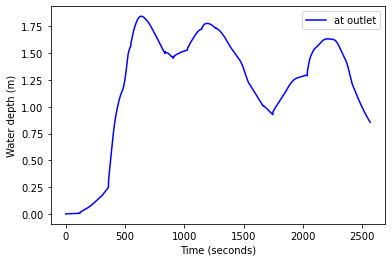

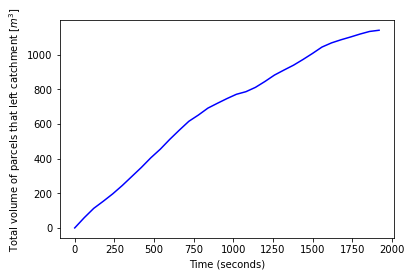

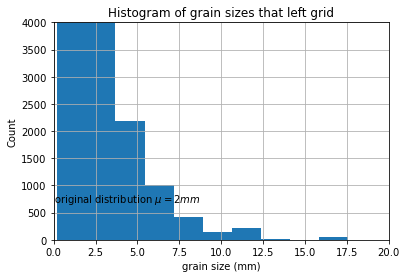

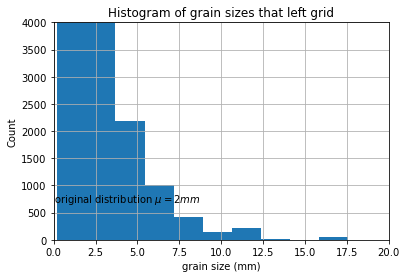

2580.0


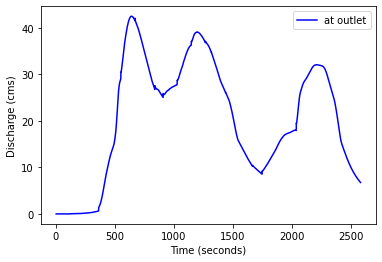

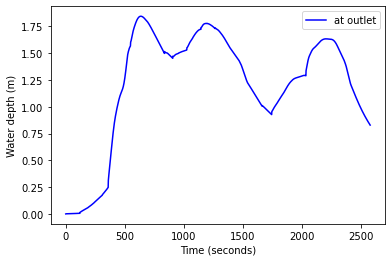

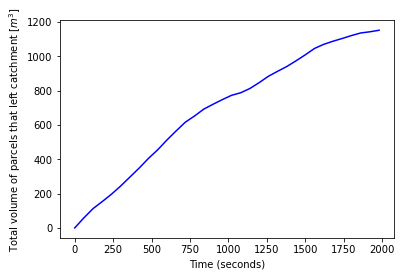

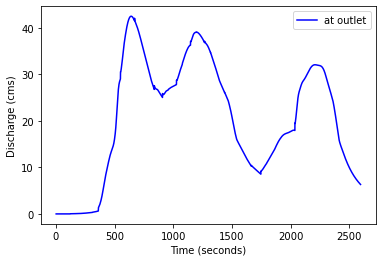

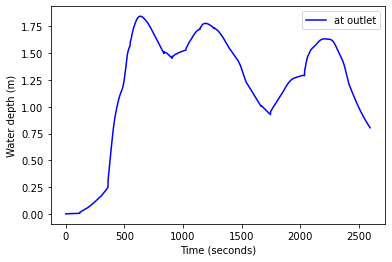

...

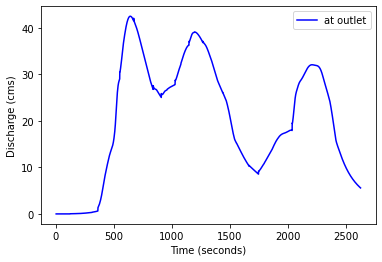

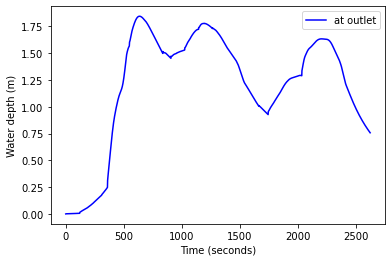

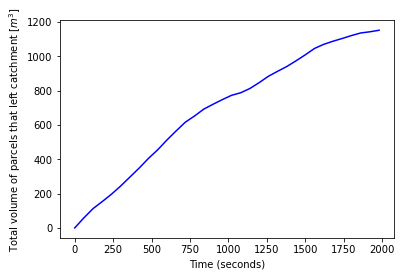

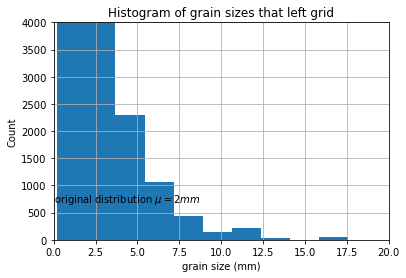

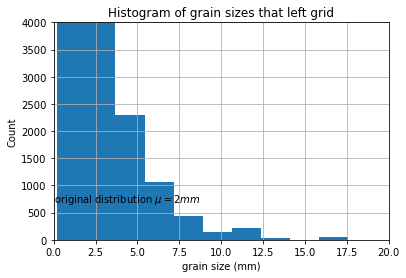

2640.0


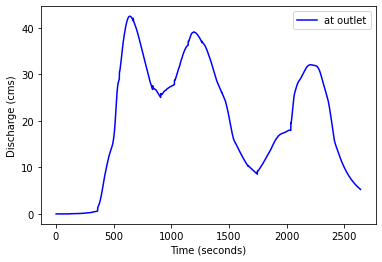

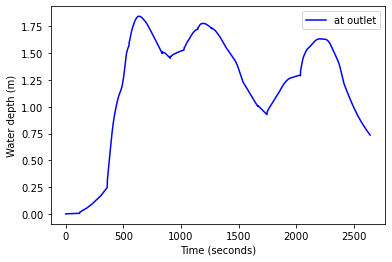

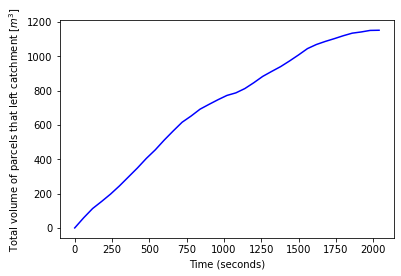

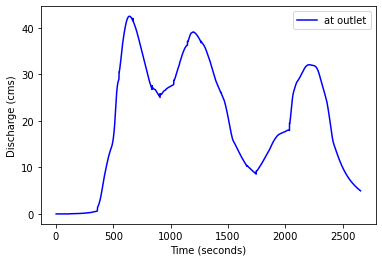

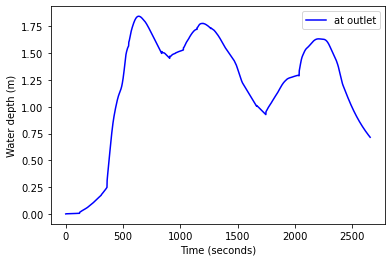

...

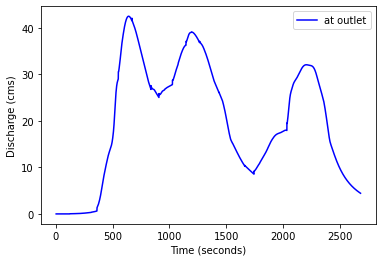

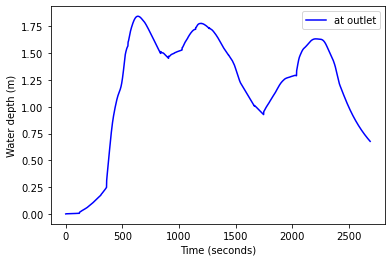

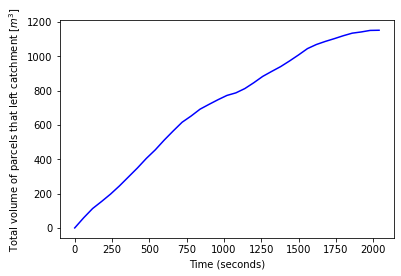

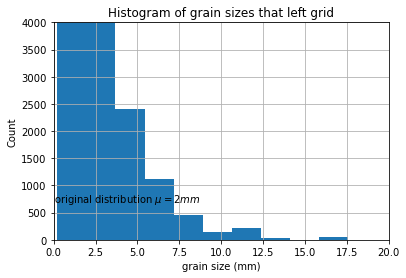

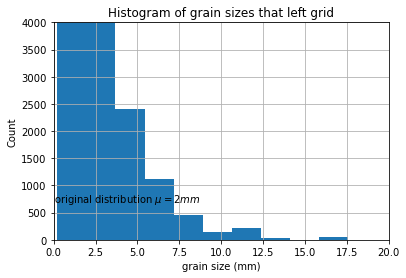

2700.0


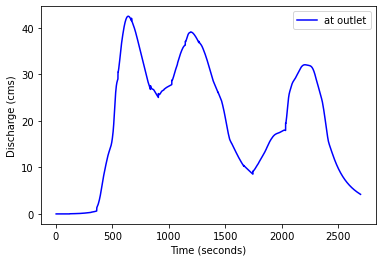

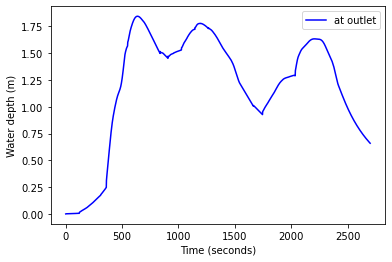

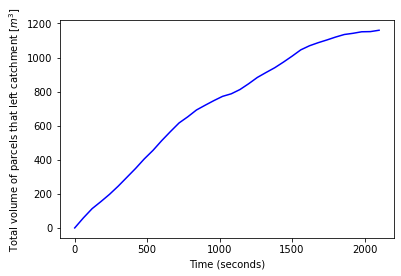

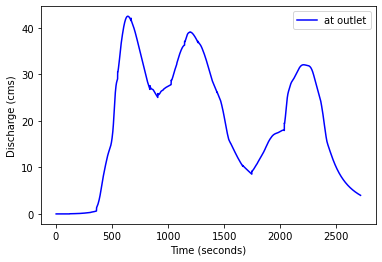

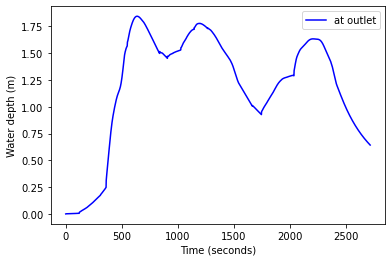

...

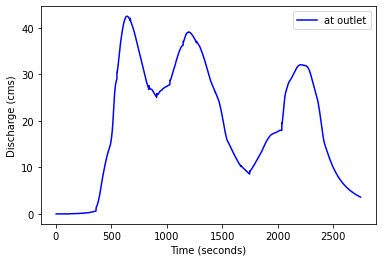

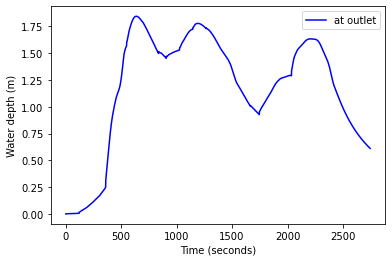

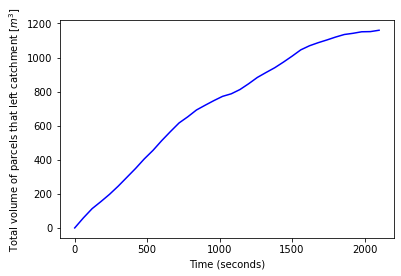

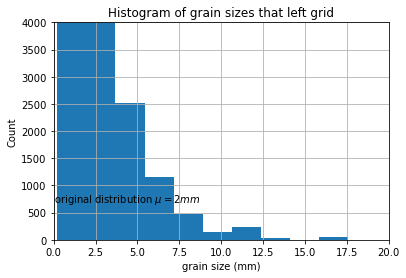

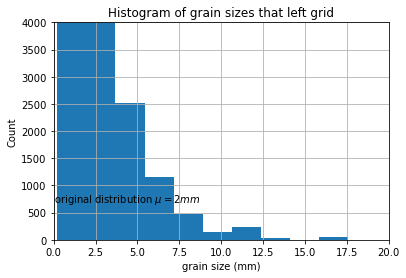

2760.0


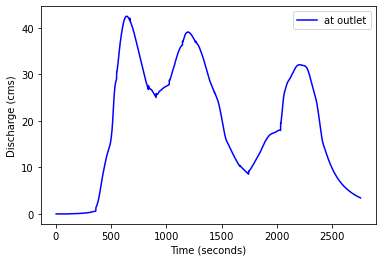

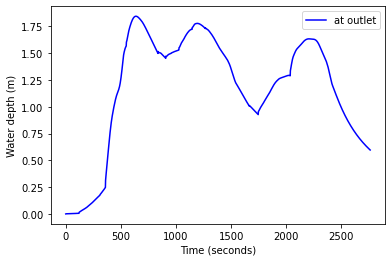

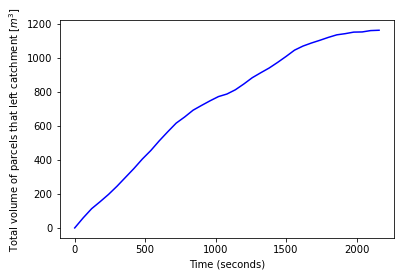

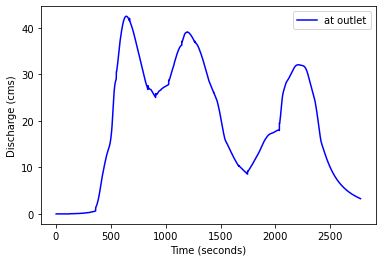

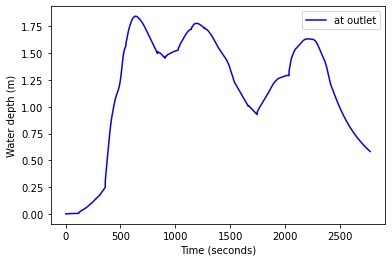

...

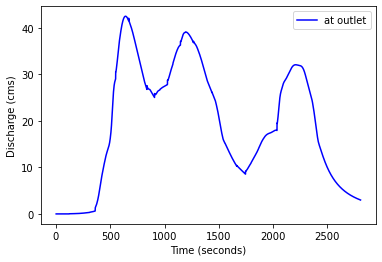

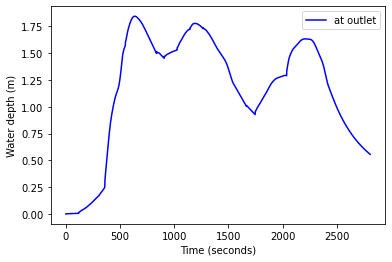

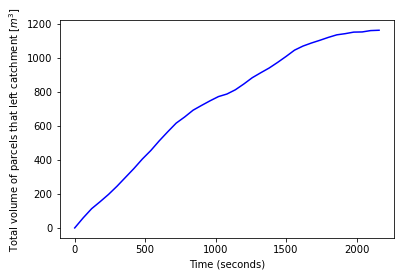

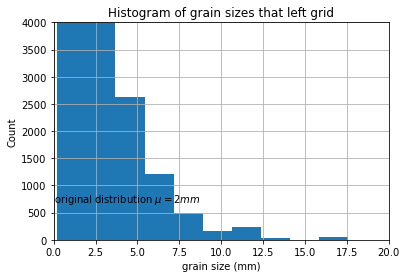

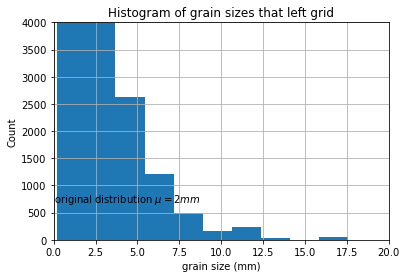

2820.0


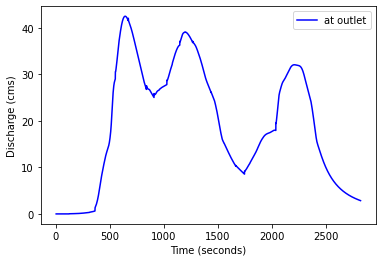

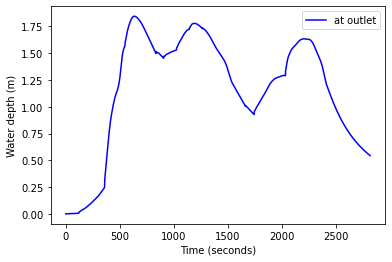

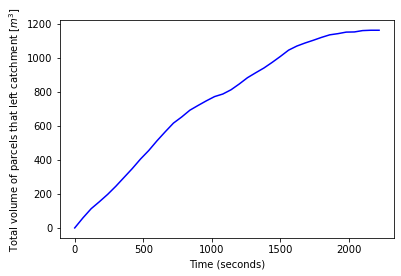

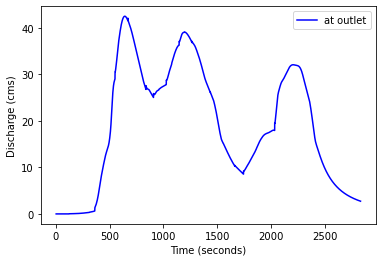

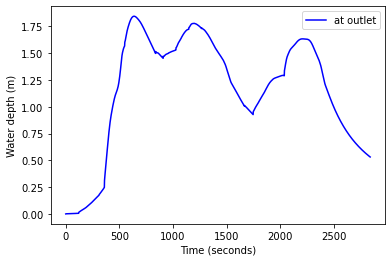

...

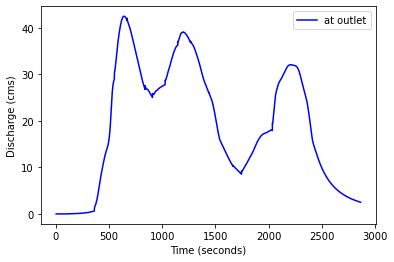

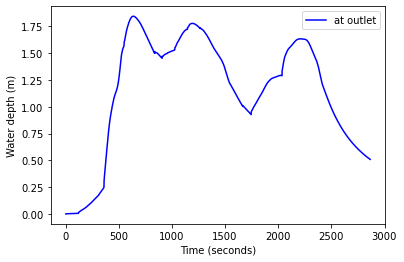

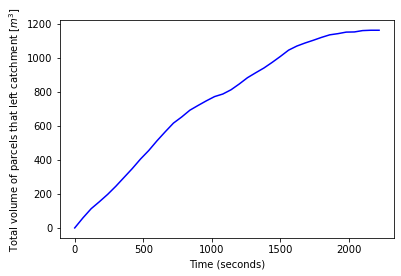

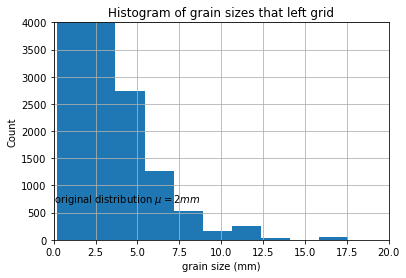

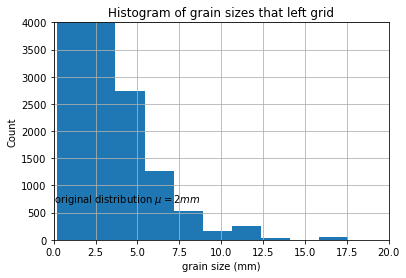

2880.0


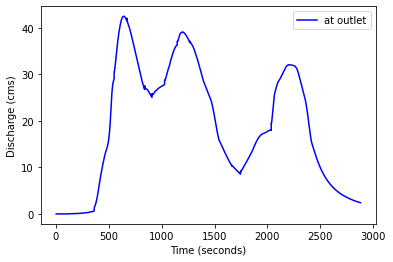

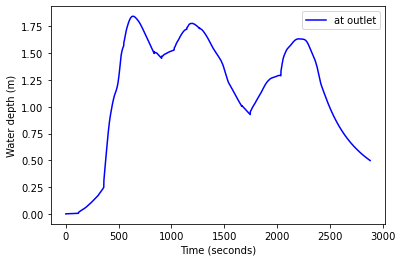

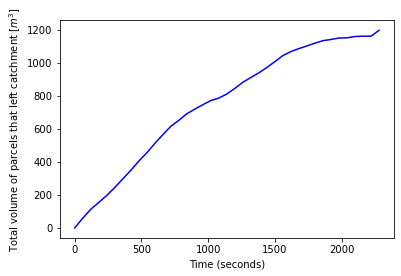

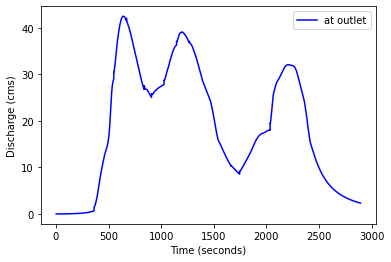

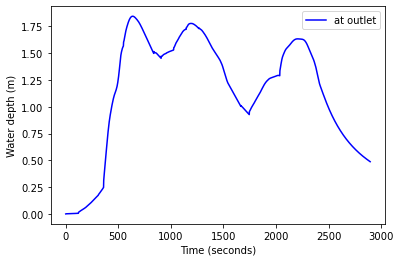

...

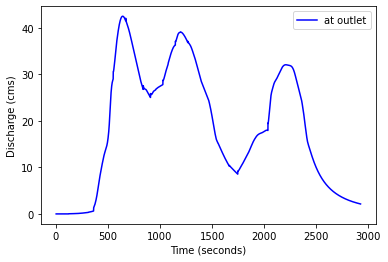

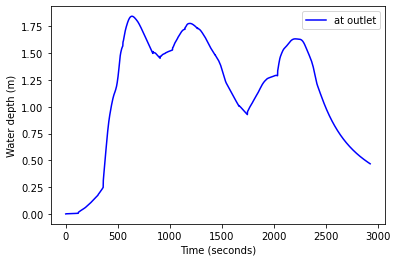

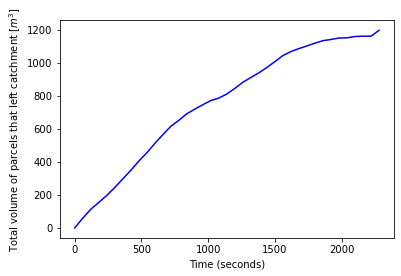

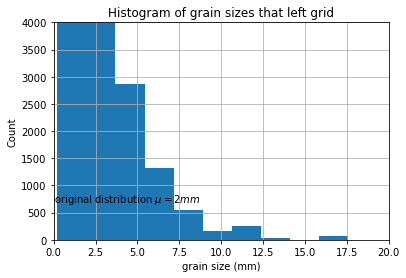

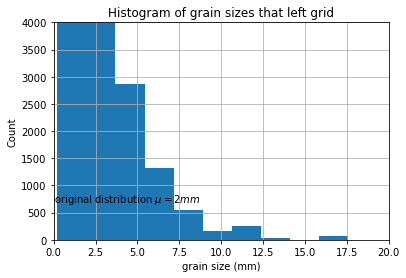

2940.0


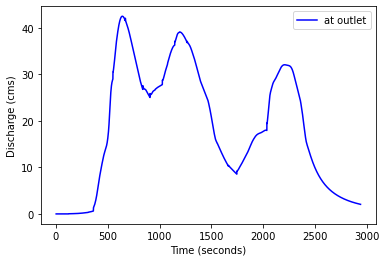

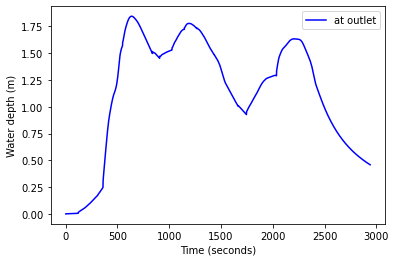

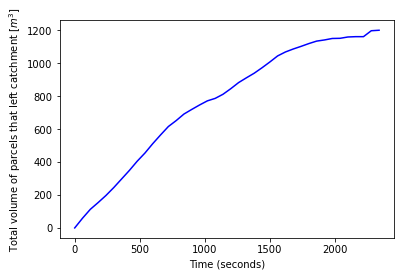

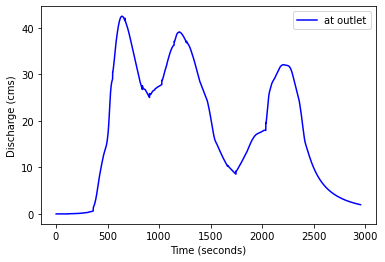

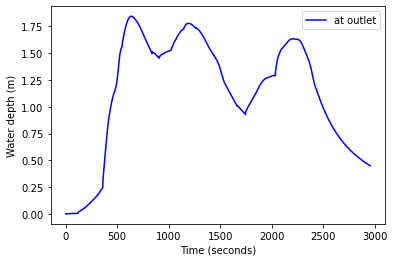

...

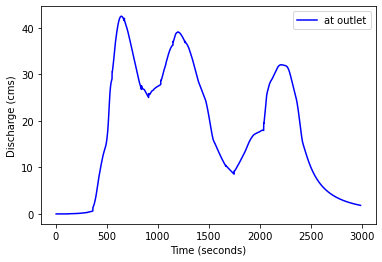

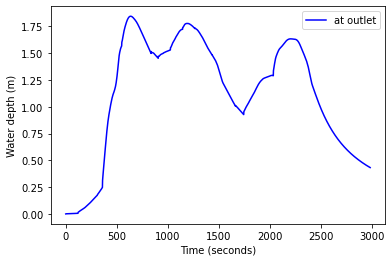

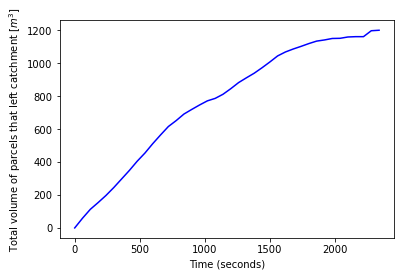

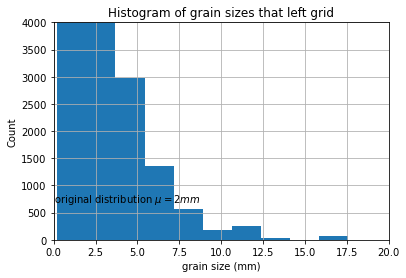

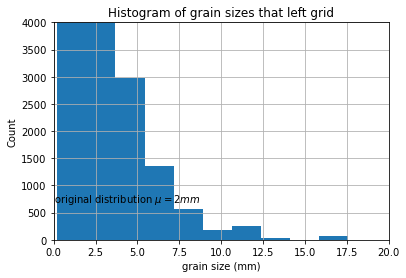

3000.0


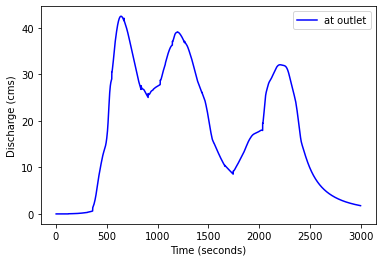

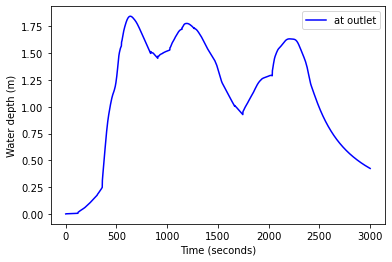

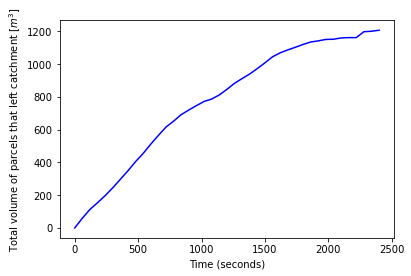

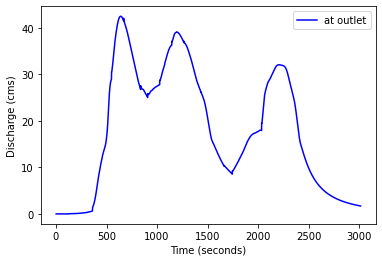

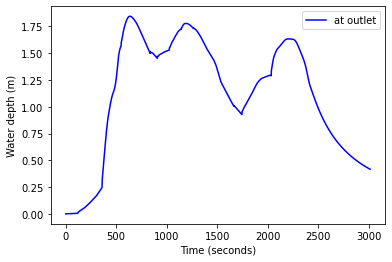

...

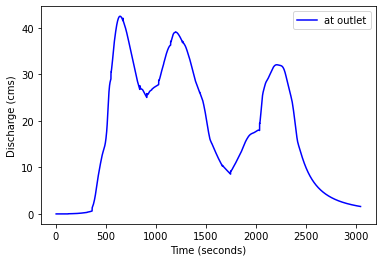

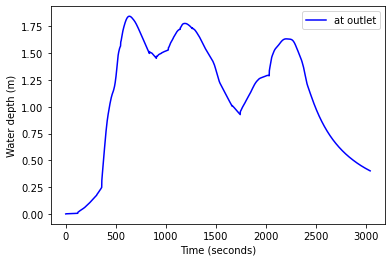

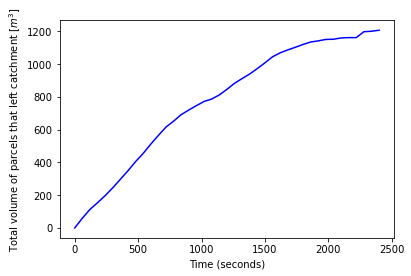

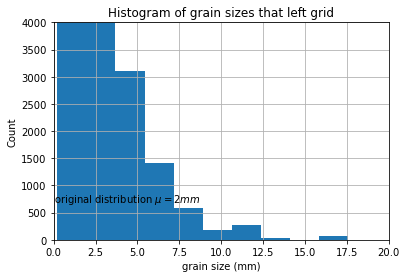

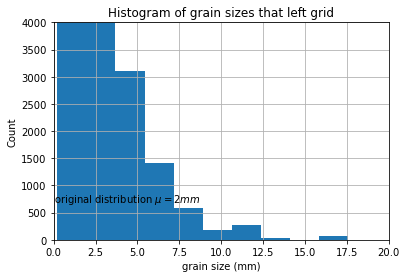

3060.0


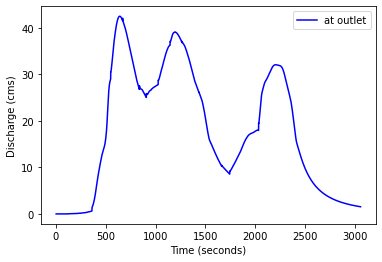

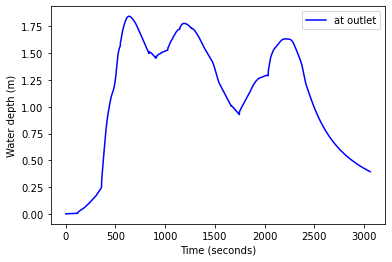

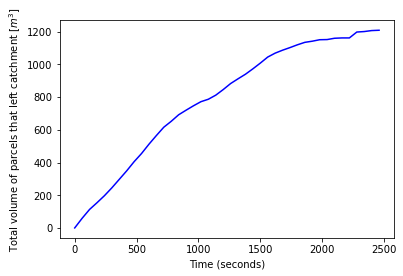

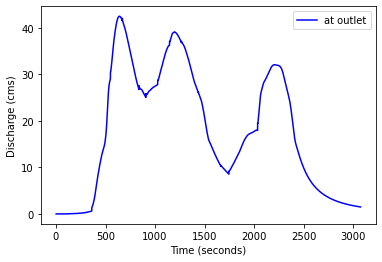

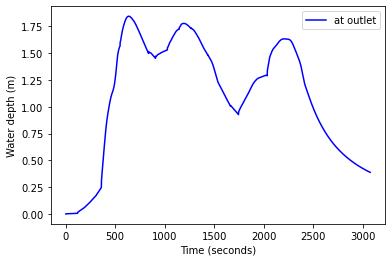

...

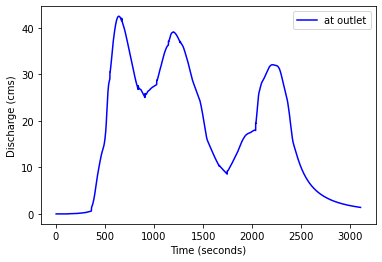

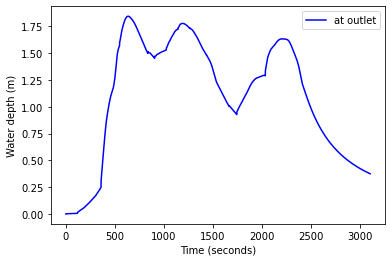

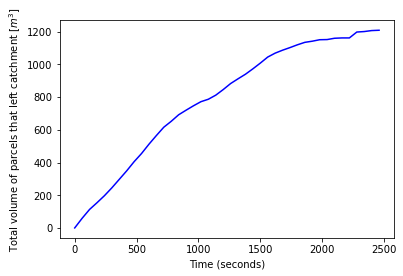

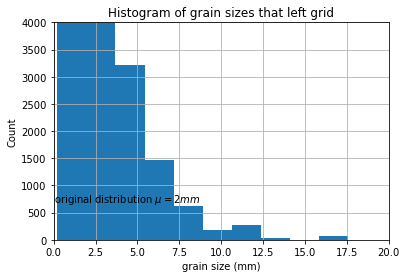

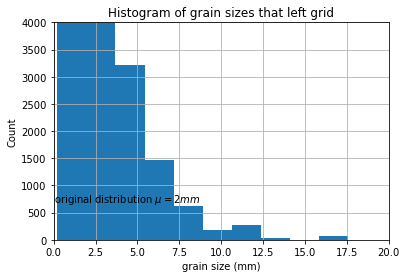

3120.0


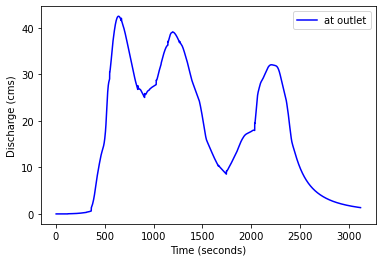

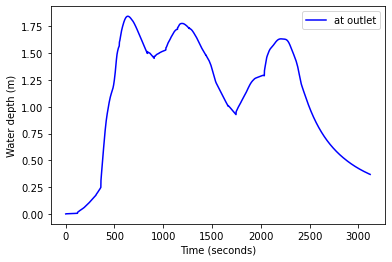

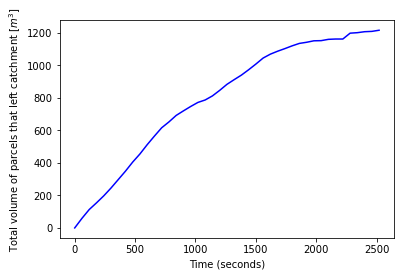

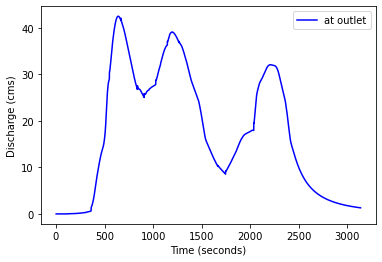

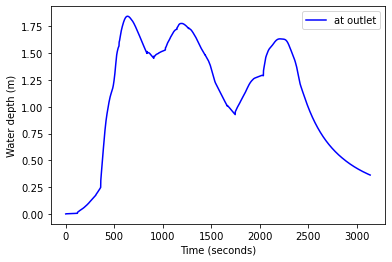

...

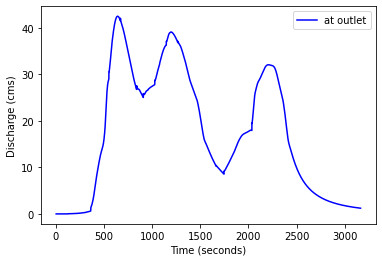

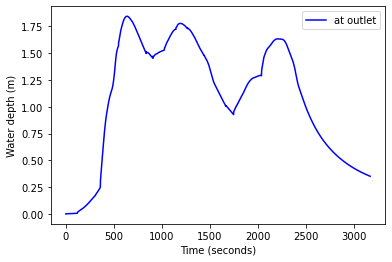

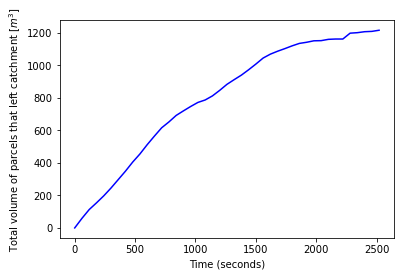

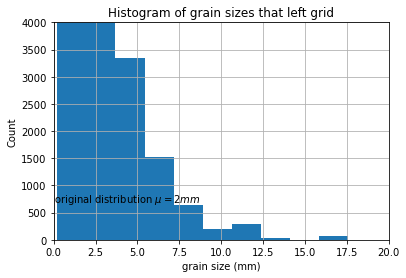

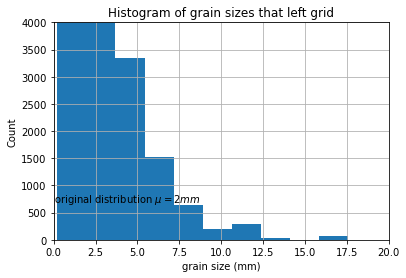

3180.0


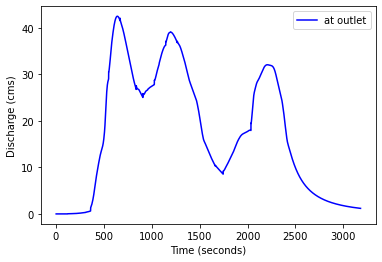

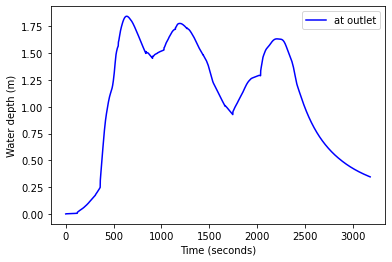

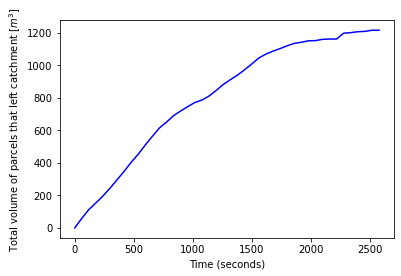

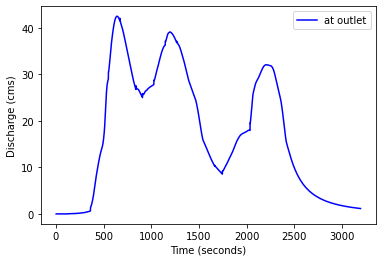

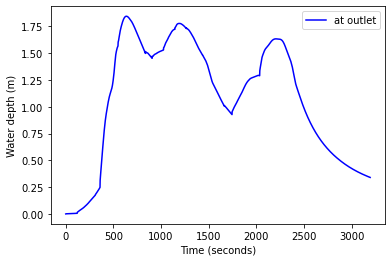

...

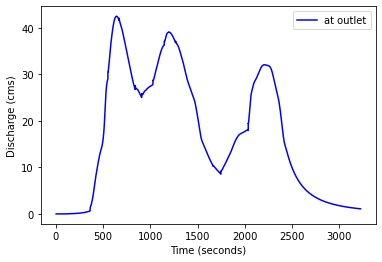

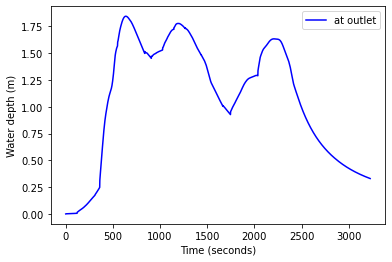

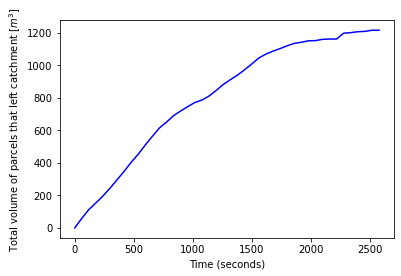

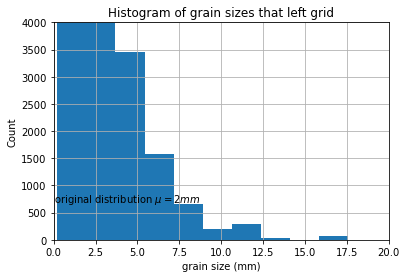

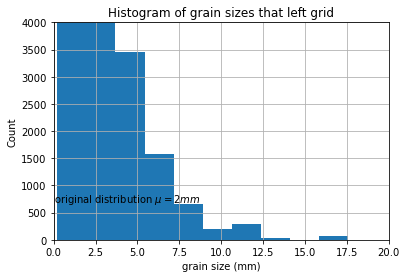

3240.0


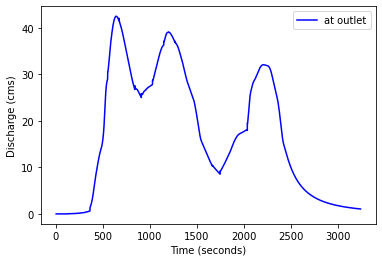

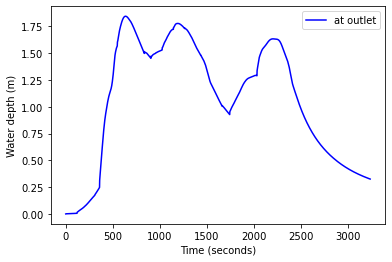

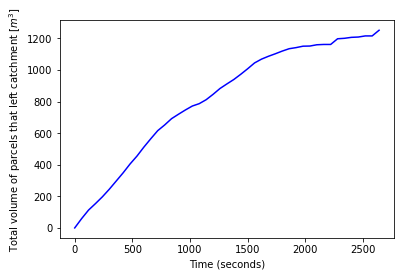

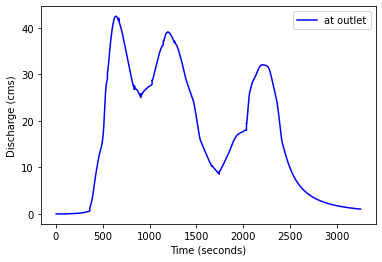

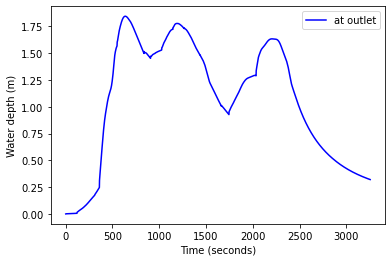

...

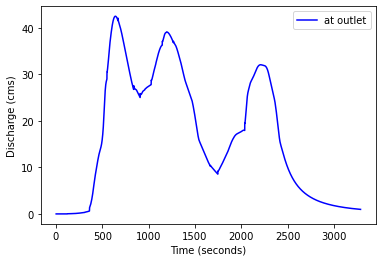

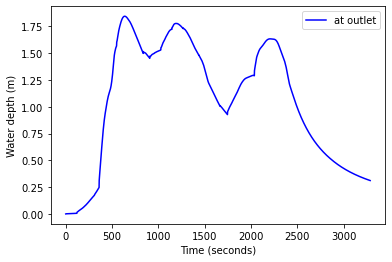

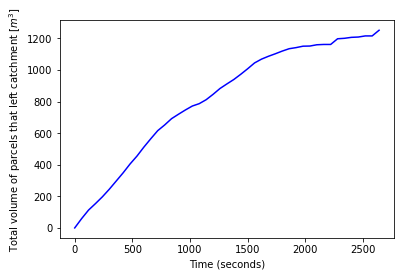

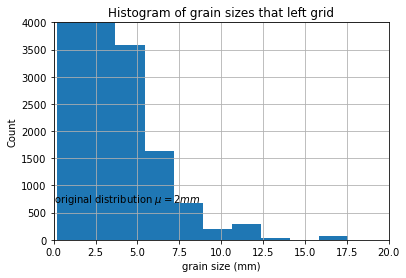

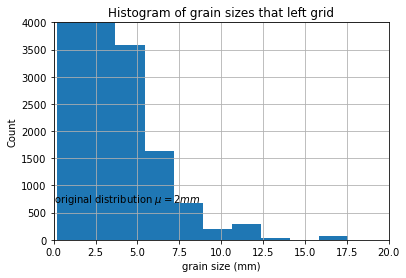

3300.0


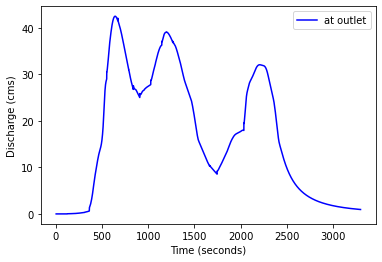

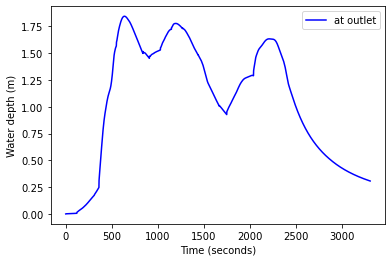

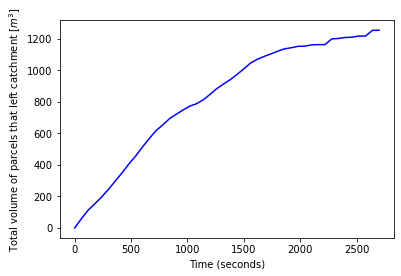

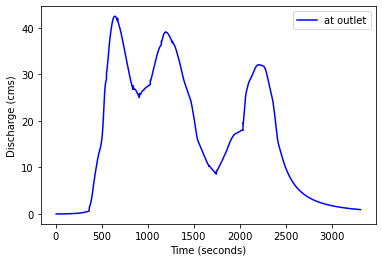

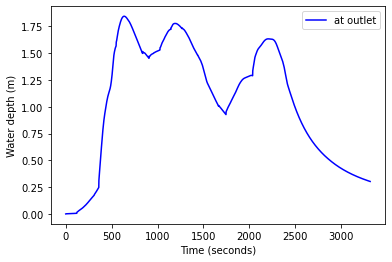

...

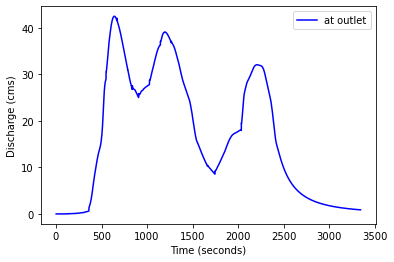

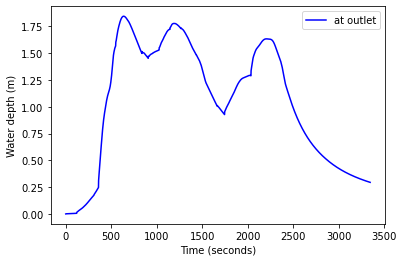

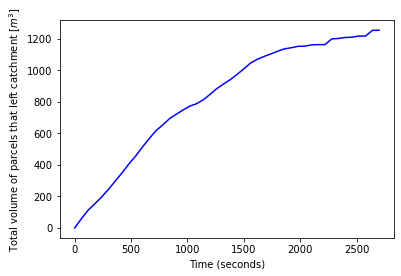

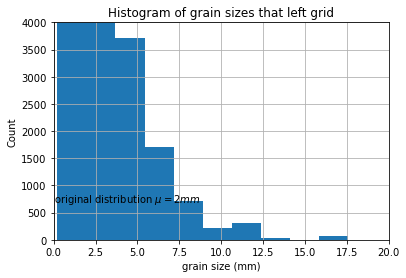

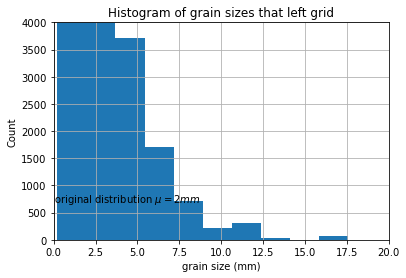

3360.0


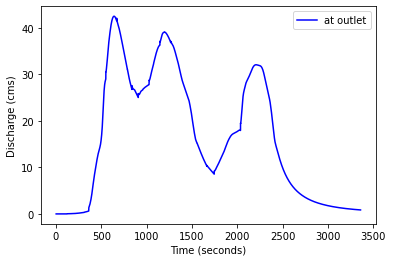

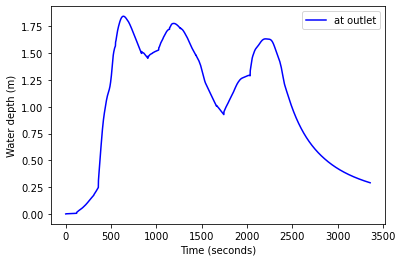

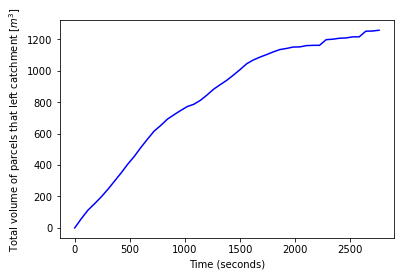

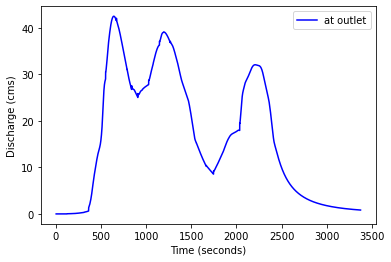

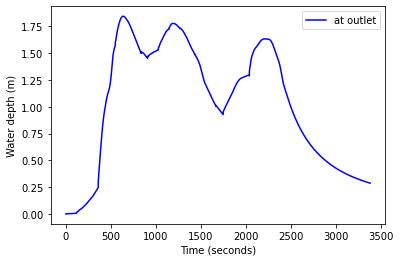

...

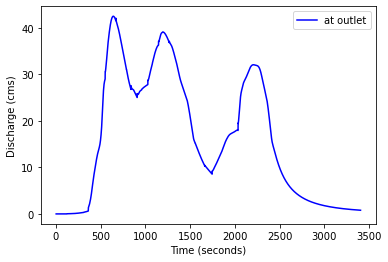

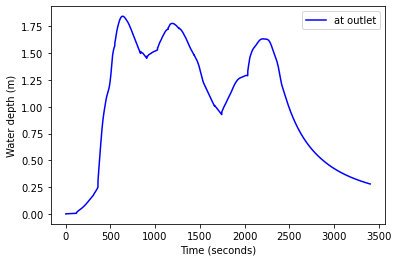

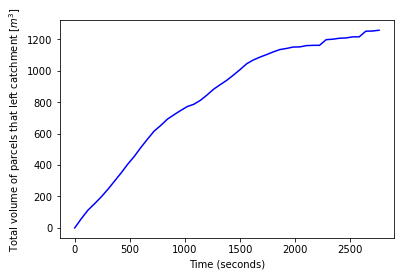

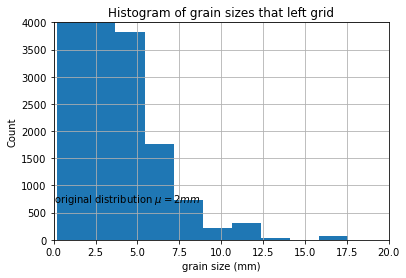

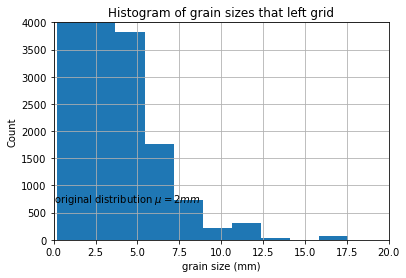

3420.0


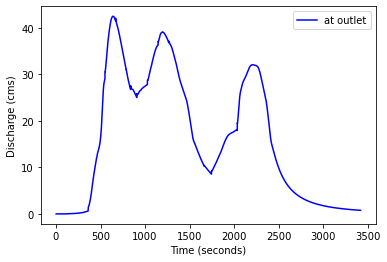

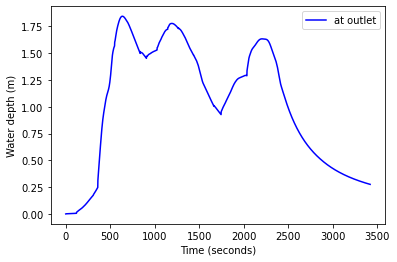

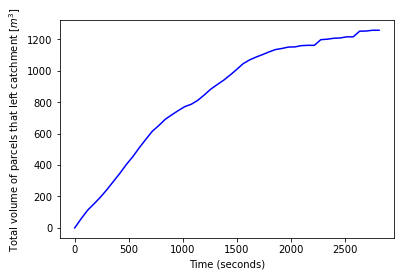

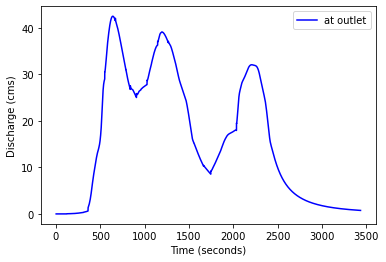

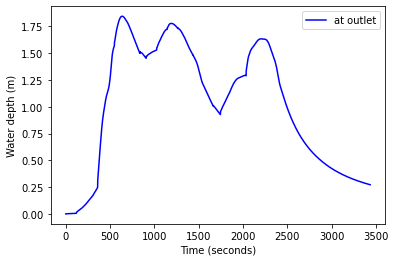

...

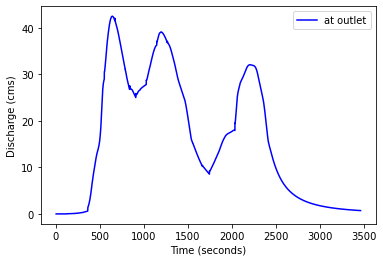

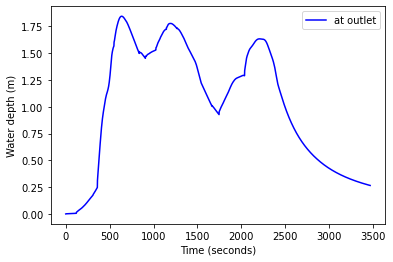

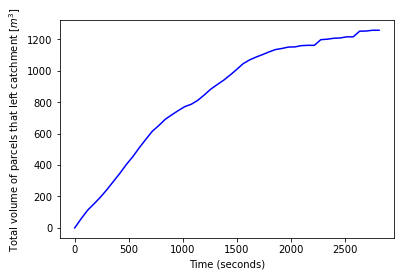

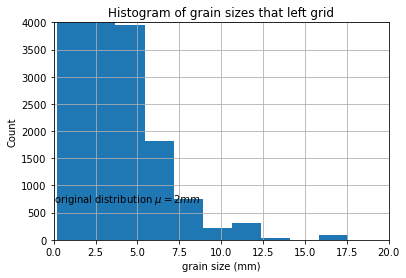

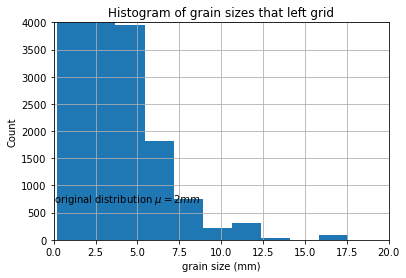

3480.0


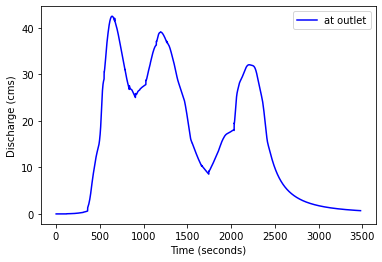

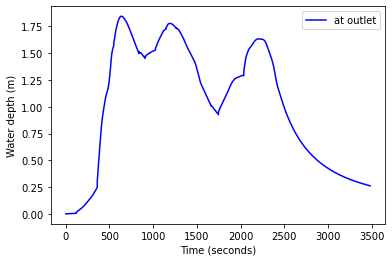

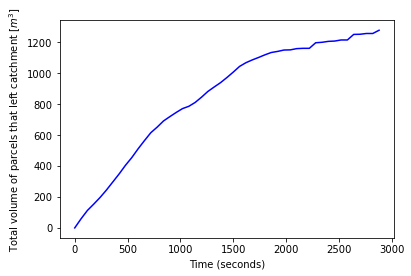

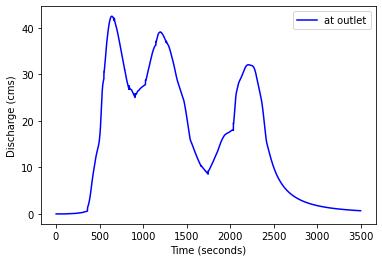

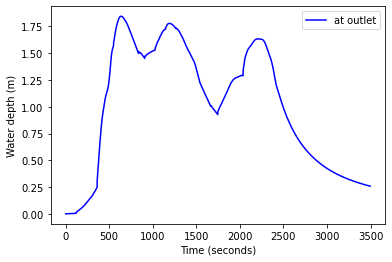

...

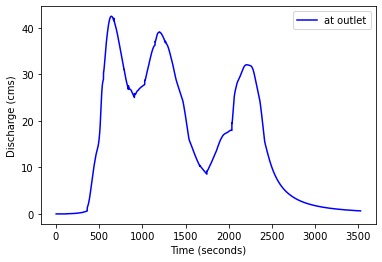

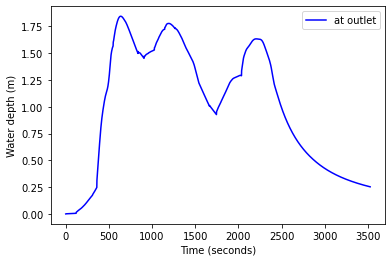

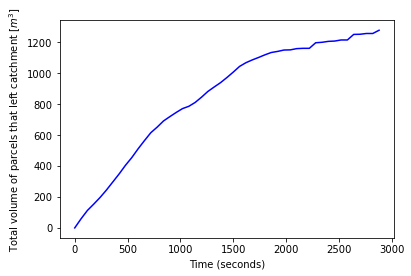

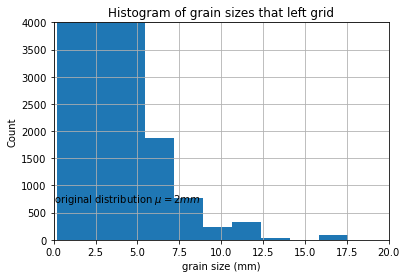

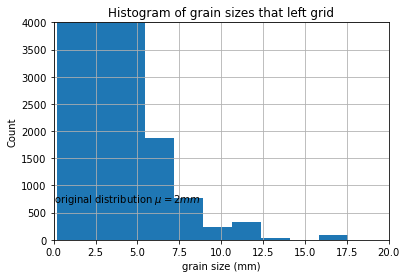

3540.0


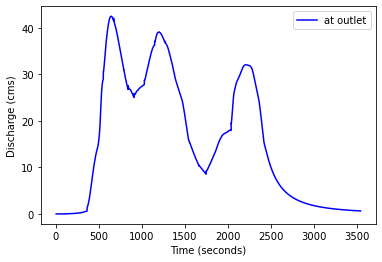

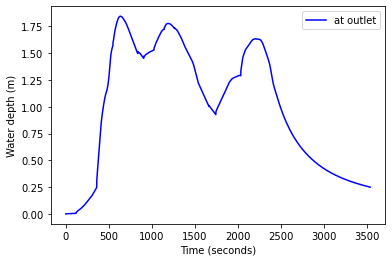

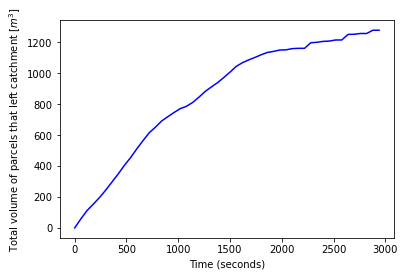

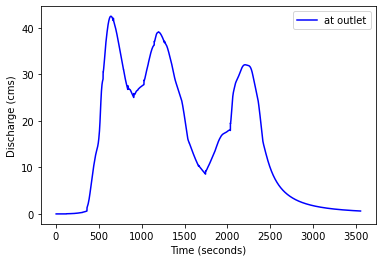

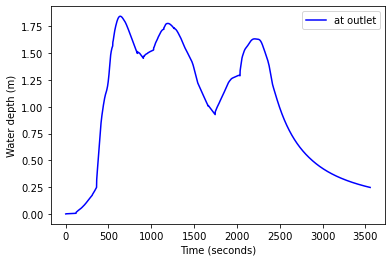

...

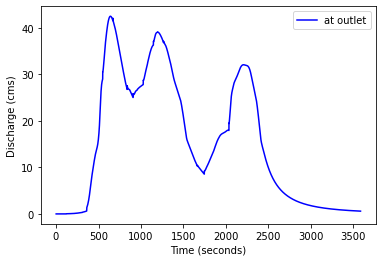

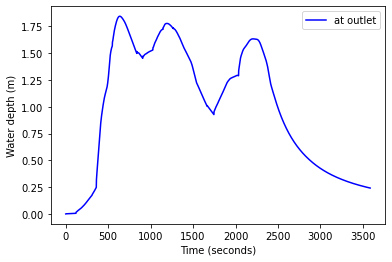

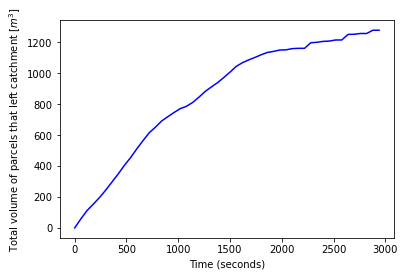

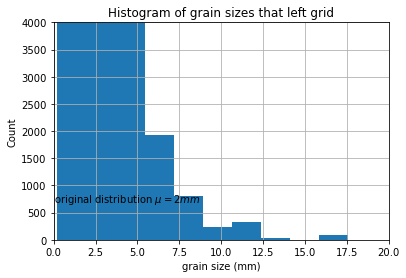

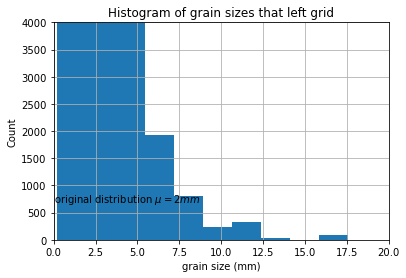

3600.0


In [45]:
for t in run_time_slices:
    elapsed_time_FP = float(elapsed_time)
    k = 0
    h_array = []
    while elapsed_time < t:
        
        # Add Rain
        if int(elapsed_time) in scaled_days_storms:
            ## Update rainfall dataset id
            rainfall_id += 1
            rainfall_name = 'rainfall__flux_' + str(rainfall_id)
            ## Avoid last time step
            if rainfall_id <= len(scaled_days_storms):
                ## Read rainfall data
                read_esri_ascii('./rainfall_series/rainfall_' + str(rainfall_id) + '.asc', 
                                grid=rmg, name=rainfall_name)
                ## Add rainfall event to water depth
                rmg.at_node['surface_water__depth'] += rmg.at_node[rainfall_name] 
                
                
        # Update Water Surface
        ## calculate our time step.
        dt_overland = .5
        ## generate overland flow.
        if k %30 == 0:
            fv.plot_overland_flow(rmg, outlet_nearest_raster_cell,elapsed_time, filepath="./output/")
            fv.plot_outlet_conditions(hydrograph_time, discharge_at_outlet, height_at_outlet, parcels)
        k+=1
        uplandOF.overland_flow(dt_overland)
        ## increase elapsed time.
        elapsed_time += dt_overland
        
        #Get outlet conditions
        hydrograph_time.append(elapsed_time) 
        q_output = uplandOF.discharge_mapper(rmg.at_link["surface_water__discharge"], convert_to_volume = True)
        h_output = rmg.at_node['surface_water__depth'][search_nodes]
        height_at_outlet.append(np.max(h_output))
        h_array.append(np.max(h_output))
        discharge_at_outlet.append(np.max(np.abs(q_output[outlet_nearest_raster_cell])))


    # Route Sediment
    ## update the water depth in network grid from raster grid
    
    for i in range(network_grid.number_of_links):
        idx_node_1_link = network_grid.nodes_at_link[i][0]
        idx_nearest_raster_cell = rmg.find_nearest_node([
            network_grid.x_of_node[idx_node_1_link], 
            network_grid.y_of_node[idx_node_1_link]])
        nmg_link_h[i] = rmg.at_node['surface_water__depth'][idx_nearest_raster_cell] 
    network_grid.at_link["flow_depth"] = nmg_link_h.copy()
    
    ## move parcel locations based on updated water level
    if elapsed_time>dt_sed*10: #dont allow sediment transport until upland reaches equilibrium
        nst.run_one_step(dt_sed)

    fv.plot_parcels(network_grid, parcels, elapsed_time, outlet_nearest_raster_cell, filepath = "./output/")
    fv.plot_parcels(network_grid, parcels, elapsed_time, outlet_nearest_raster_cell)

    
    # Update Floodplain Topography
    ##align flooplain elevation with catchment outlet which was just updated by the NST
    new_channel_depth = Datum - network_grid.at_node['topographic__elevation'][outlet_node]
  
    zFP[isChannel] += new_channel_depth - old_channel_depth
    old_channel_depth = new_channel_depth
 

    k = 0
    # Update Floodplain water surface
    while elapsed_time_FP < t:
        if h_array[k]>new_channel_depth:
            gridFP.at_node["surface_water__depth"][bools*isChannel] = h_array[k]
            gridFP.at_node["surface_water__depth"][bools*~isChannel] = h_array[k]-new_channel_depth
        else: 
            gridFP.at_node["surface_water__depth"][bools*isChannel] = h_array[k]
        if k %30 == 0:
            fv.plot_floodplain(gridFP, zFP, nX, nY, elapsed_time_FP, filepath="./output/")
        k+=1 
        ## calculate our time step.
        dt_overland = .5
        ## update water surface elevation in floodplain.
        floodplainOF.overland_flow(dt_overland)
        ## allow water to infiltrate
        SI.run_one_step(dt_overland)
        ## increase elapsed time
        elapsed_time_FP += dt_overland
  
     
    iters += 1
    print(elapsed_time)

## 4. Visualize Results

Plot outlet node conditions through time, which is the information passed between grids

outlet figures saved


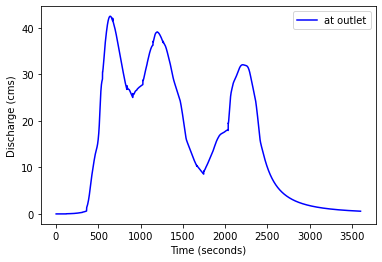

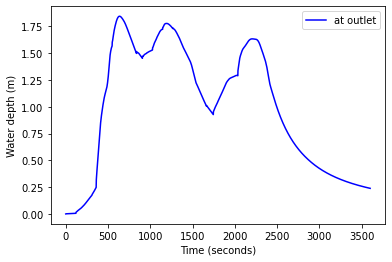

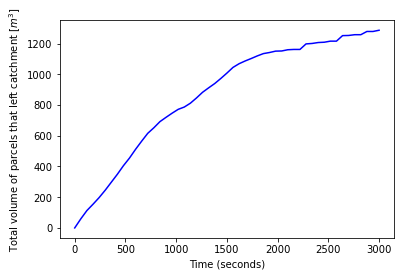

In [46]:
fv.plot_outlet_conditions(hydrograph_time, discharge_at_outlet, height_at_outlet, parcels, filepath = "./output/")

Save animations of model output figures

In [47]:
fv.save_animations("./output/")

./output/flow/*
./output/sed/*
./output/floodplain/*
animations saved


## 5. Assignments

1. 

2. 

3. 